In [1]:
from IPython.display import HTML
from IPython.display import Image

Magic the Gathering Card Recognition Project
===============================================

<img src='Shahrazad.jpg' width="540" height="370" align="left"/>

In [2]:
#Image("Image.ashx.png")

**By: Pieter Leffers**,

*Starting Date: May 1, 2018*

*Completion Date: May 25, 2018*

*Last Updated: May 25, 2018*

Project Description
-----------------

For this project I wanted to combine skills I had used previously working for the State of Oregon with skills I have been trying to use and increase. Specifically I wanted to use Python to analyze public health survey data in order to answer a specific project question or set of questions; bonus points if I can use Machine Learning techniques as well. It stands to reason that the Behavioral Risk Factor Surveillance System would be an excellent candidate for this project since I already have a fair amount of content knowledge expertise from when I was a Research Analyst of chronic disease.....


**The Challenges**
- Lack of python documentation for proper Survey Techniques
- Lack of examples to reference where Python was the language of choice for Survey Analysis 
- Lack of support or documentation for various weighting systems
- Lack of documentation or just terrible documentation for the Statsmodels package
- Getting Python results to match SAS results

**Materials**
- Python 3.6
- SAS 9.2

Data Source:
-----------
**The Behavioral Risk Factor Surveillance System**, available at: https://www.cdc.gov/brfss/annual_data/annual_data.htm

The Behavioral Risk Factor Surveillance System (BRFSS) is a cross-sectional telephone survey that state health departments conducts monthly over landline telephones and cellular telephones with a standardized questionnaire and technical and methodologic assistance from CDC. BRFSS is used to collect prevalence data among adult U.S. residents regarding their risk behaviors and preventive health practices that can affect their health status. 


*An important feature when analyzing BRFSS data is the weighting system in order to produce accurate statistical results. Below is an introductory summary of Raked Weighting which is provided in the proceding link.*

**Raked Weighting:**

When data are used without weights, each record counts the same as any other record and this implies the following assumptions:

   1. Each record has equal probabilities of being selected.
   2. Noncoverage and nonresponse are equal among all segments of the population.  
   
During data collection, the conditions that actually happen may be different than the preceding 
assumptions, and the differences can become large enough to affect the results of the data set. Weighting each record appropriately can help to adjust for these differences (or assumption violations). Another reason for weighting one that is conceptually unrelated to the first reason is to make the total number of cases equal to some desired number. This state BRFSS data is the number of people in the state who are aged 18 years and older. In the BRFSS, such raking serves as a blanket adjustment for noncoverage and nonresponse and forces the total number of cases to equal population estimates for each geographic region. 


**Additional Materials:**

* http://colah.github.io/posts/2015-08-Understanding-LSTMs/

* https://www.kdnuggets.com/2018/09/object-detection-image-classification-yolo.html#.W5bJ1wFKfgI.linkedin

* https://www.pyimagesearch.com/2018/09/17/opencv-ocr-and-text-recognition-with-tesseract/?__s=bir9h53nkfqssqsteipg

* https://www.pyimagesearch.com/2018/08/20/opencv-text-detection-east-text-detector/

* https://github.com/geaxgx/playing-card-detection

* https://github.com/AlexeyAB/darknet#how-to-train-to-detect-your-custom-objects


In [3]:
HTML('''<script>
  function code_toggle() {
    if (code_shown){
      $('div.input').hide('500');
      $('#toggleButton').val('Show Code')
    } else {
      $('div.input').show('500');
      $('#toggleButton').val('Hide Code')
    }
    code_shown = !code_shown
  }

  $( document ).ready(function(){
    code_shown=false;
    $('div.input').hide()
  });
</script>
<form action="javascript:code_toggle()"><input type="submit" id="toggleButton" value="Show Code"></form>''')

**Import packages**


In [4]:
import pandas as pd
import numpy as np
import cv2
import os
import operator
from tqdm import tqdm
import random
import os, re
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.patches as patches
import pickle
from glob import glob 
import imgaug as ia
from imgaug import augmenters as iaa
from shapely.geometry import Polygon

print('OpenCV Version:',cv2.__version__)

OpenCV Version: 3.4.1


In [5]:
def scrubadub(variable):
    myList=(list(variable))
    clean=[]
    for i in range(0,len(myList)):
        #Regular expressions for removing web addresses
        url_reg  = r'[a-z]*[:.]+\S+'
        #and replacing with nothing
        url_text=re.sub(url_reg, '', myList[i])
        sep = " "
        junk = re.findall(r"(?i)\b[a-z]+\b", url_text)
        #join the seperated words
        junk = sep.join(junk)
        #remove _s_ spaces from text after punctuation removal
        S_space = re.sub(r' s ',' ',junk)
        clean.append(S_space)
    return clean

In [6]:
CardNames=pd.read_json('data\\labels\\AllCards.json')
CardNames=CardNames.transpose() #Make the data columnar
CardNames=CardNames.reset_index() #Change names from index to a column in dataset
CardNames=CardNames.sort_values(by='index',ascending=True)
CardNames['index']=scrubadub(CardNames['index'])
CardNames['index']=CardNames['index'].str.replace(' ','_',regex=True)#Replace spaces with undercarriage
CardNames=list(CardNames['index'])#Make a list of the names

In [7]:
CardNames[:5]

['Ach_Hans_Run',
 'Rumors_of_My_Death',
 'World_Champion',
 'A_Display_of_My_Dark_Power',
 'A_Reckoning_Approaches']

Create a folder for each card

In [8]:
root_path=os.getcwd()+'\\data\\cards' #Assigned location for the cards folders

for name in CardNames:
#    print(name)
    try:
        os.mkdir(os.path.join(root_path,str(name)))
    except:
        continue

*Measurements on the cards*

Use a ruler to measure the dimensions as indicated in the image below. 
For the corner* measures, the idea is to delimit one rectangular zone that can hold every value+suit. The size of the marks may vary with the value or the suit, so take the measures on the cards with the widest, the tallest symbols, and add one or two millimeters.

*Measures*

Report the measures in mm in the cell below (and don't forget to run the cell).

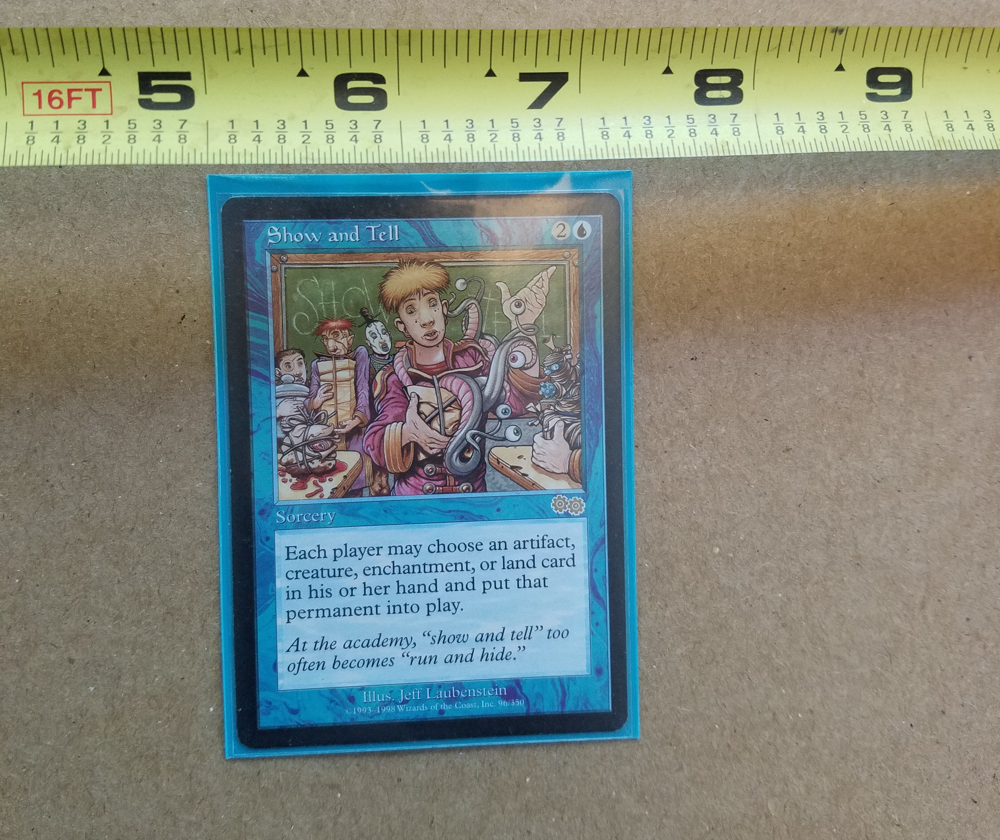

In [80]:
#Card Width
cardW=57 
Image("Width.jpg")

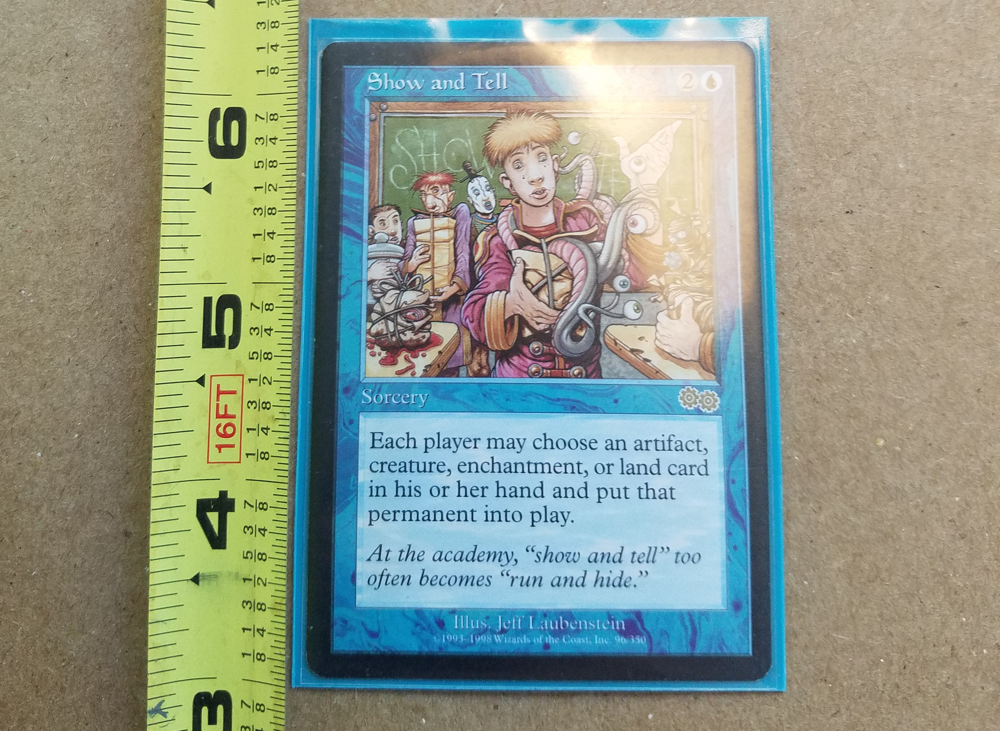

In [81]:
#Card Height
cardH=87 
Image("Height.jpg")

In [11]:
cornerXmin=5
cornerXmax=52
cornerYmin=4
cornerYmax=18

# We convert the measures from mm to pixels: multiply by an arbitrary factor 'zoom'
# You shouldn't need to change this
zoom=4
cardW*=zoom #228
cardH*=zoom #348
cornerXmin=int(cornerXmin*zoom)
cornerXmax=int(cornerXmax*zoom)
cornerYmin=int(cornerYmin*zoom)
cornerYmax=int(cornerYmax*zoom)

Global variables
---------------

In [12]:
data_dir="data" # Directory that will contain all kinds of data (the data we download and the data we generate)

if not os.path.isdir(data_dir):
    os.makedirs(data_dir)

names=CardNames

# Pickle file containing the background images from the DTD
backgrounds_pck_fn=data_dir+"\\backgrounds.pck"

# Pickle file containing the card images
cards_pck_fn=data_dir+"\\cards.pck"

# imgW,imgH: dimensions of the generated dataset images 
imgW=720
imgH=720

#https://math.stackexchange.com/questions/1764314/get-vertex-points-of-transformed-rectangle-knowing-bounding-box-and-transform-ma
#Card Dimensions
refCard=np.array([[0,0],[cardW,0],[cardW,cardH],[0,cardH]],dtype=np.float32)
refCardRot=np.array([[cardW,0],[cardW,cardH],[0,cardH],[0,0]],dtype=np.float32)
refCornerHL=np.array([[cornerXmin,cornerYmin],[cornerXmax,cornerYmin],[cornerXmax,cornerYmax],[cornerXmin,cornerYmax]],dtype=np.float32)
refCornerLR=np.array([[cardW-cornerXmax,cardH-cornerYmax],[cardW-cornerXmin,cardH-cornerYmax],[cardW-cornerXmin,cardH-cornerYmin],[cardW-cornerXmax,cardH-cornerYmin]],dtype=np.float32)
refCorners=np.array([refCornerHL,refCornerLR])


**Convenient Functions**

In [13]:
def display_img(img,polygons=[],channels="bgr",size=9):
    """
        Function to display an inline image, and draw optional polygons (bounding boxes, convex hulls) on it.
        Use the param 'channels' to specify the order of the channels ("bgr" for an image coming from OpenCV world)
    """
    if not isinstance(polygons,list):
        polygons=[polygons]    
    if channels=="bgr": # bgr (cv2 image)
        nb_channels=img.shape[2]
        if nb_channels==4:
            img=cv2.cvtColor(img,cv2.COLOR_BGRA2RGBA)
        else:
            img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)    
    fig,ax=plt.subplots(figsize=(size,size))
    ax.set_facecolor((0,0,0))
    ax.imshow(img)
    try:
        for polygon in polygons:
            # An polygon has either shape (n,2), 
            # either (n,1,2) if it is a cv2 contour (like convex hull).
            # In the latter case, reshape in (n,2)
            if len(polygon.shape)==3:
                polygon=polygon.reshape(-1,2)
            patch=patches.Polygon(polygon,linewidth=1,edgecolor='g',facecolor='none')
            ax.add_patch(patch)
    except:
        print(img)
        
def give_me_filename(dirname, suffixes, prefix=""):
    """
        Function that returns a filename or a list of filenames in directory 'dirname'
        that does not exist yet. If 'suffixes' is a list, one filename per suffix in 'suffixes':
        filename = dirname + "/" + prefix + random number + "." + suffix
        Same random number for all the file name
        Ex: 
            > give_me_filename("dir","jpg", prefix="prefix")
            'dir/prefix408290659.jpg'
            > give_me_filename("dir",["jpg","xml"])
            ['dir/877739594.jpg', 'dir/877739594.xml']        
    """
    if not isinstance(suffixes, list):
        suffixes=[suffixes]
    
    suffixes=[p if p[0]=='.' else '.'+p for p in suffixes]
          
    while True:
        bname="%09d"%random.randint(0,999999999)
        fnames=[]
        for suffix in suffixes:
            fname=os.path.join(dirname,prefix+bname+suffix)
            if not os.path.isfile(fname):
                fnames.append(fname)
                
        if len(fnames) == len(suffixes): break
    
    if len(fnames)==1:
        return fnames[0]
    else:
        return fnames


** Get Describable Textures Dataset (DTD)**

A convenient way to generate backgrounds for the images of the cards dataset

**Download DTD (1x)**

In [14]:
#!wget https://www.robots.ox.ac.uk/~vgg/data/dtd/download/dtd-r1.0.1.tar.gz

**Extract the DTD (1x)**

In [15]:
#!tar xf dtd-r1.0.1.tar.gz

**Load all *jpg from dtd subdirectories and save them in a pickle file (1x)**

The next times, we will directly load the pickle file 

In [16]:
print(backgrounds_pck_fn)

data\backgrounds.pck


In [17]:
dtd_dir="dtd\\images\\"
bg_images=[]
for subdir in glob(dtd_dir+"\\*"):
    for f in glob(subdir+"\\*.jpg"):
        bg_images.append(mpimg.imread(f))
print("Number of images loaded :",len(bg_images))
#pickle.dump(bg_images,open(backgrounds_pck_fn,'wb'),protocol=2)#python2 
pickle.dump(bg_images,open(backgrounds_pck_fn,'wb'))#python3
print("Saved in :",backgrounds_pck_fn)#backgrounds_pck_fn


Number of images loaded : 5640
Saved in : data\backgrounds.pck


In [18]:
# Clean-up
#!rm -r dtd
#!rm dtd-r1.0.1.tar.gz

### Load the backgounds pickle file in 'backgrounds'
'backgrounds' is an instance of the class Backgrounds
To get a random background image, call the method : backgrounds.get_random

In [19]:
class Backgrounds():
    def __init__(self,backgrounds_pck_fn=backgrounds_pck_fn):
        self._images=pickle.load(open(backgrounds_pck_fn,'rb'))
        self._nb_images=len(self._images)
        print("Nb of images loaded :", self._nb_images)
    def get_random(self, display=False):
        bg=self._images[random.randint(0,self._nb_images-1)]
        if display: plt.imshow(bg)
        return bg
    
backgrounds = Backgrounds()

Nb of images loaded : 5640


In [20]:
#backgrounds = Backgrounds()

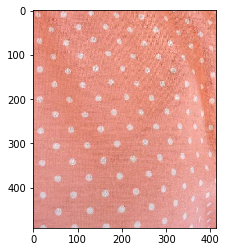

In [21]:
# Test: display a random background
_=backgrounds.get_random(display=True)


Extraction of the cards from pictures or video 
------------------------------------------

### Define the alphamask
The alphamask has 2 purposes:
- clean the border of the detected cards,
- make that border transparent. Cards are not perfect rectangles because corners are rounded. We need to make transparent the zone between the real card and its bounding rectangle, otherwise this zone will be visible in the final generated images of the dataset


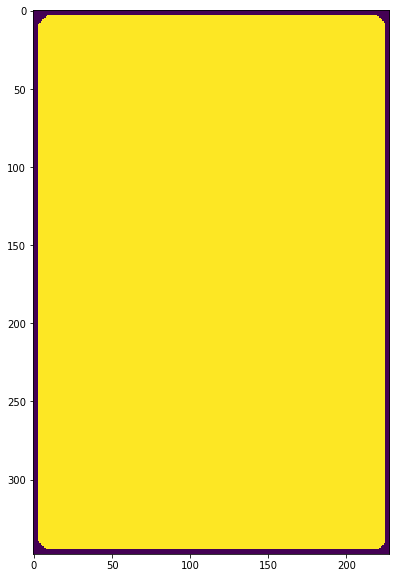

In [22]:
bord_size=3 # bord_size alpha=0
alphamask=np.ones((cardH,cardW),dtype=np.uint8)*255
cv2.rectangle(alphamask,(0,0),(cardW-1,cardH-1),0,bord_size)
cv2.line(alphamask,(bord_size*3,0),(0,bord_size*3),0,bord_size)
cv2.line(alphamask,(cardW-bord_size*3,0),(cardW,bord_size*3),0,bord_size)
cv2.line(alphamask,(0,cardH-bord_size*3),(bord_size*3,cardH),0,bord_size)
cv2.line(alphamask,(cardW-bord_size*3,cardH),(cardW,cardH-bord_size*3),0,bord_size)
plt.figure(figsize=(10,10))
plt.imshow(alphamask)

In [23]:
#alphamask=np.ones((cardH,cardW),dtype=np.uint8)*255

In [24]:
alphamask.shape

(348, 228)

## Function extract_card 
Extract from scene image (cv2/bgr) the part corresponding to the card and transforms it 
to fit into the reference card shape.
We suppose here that the user facilitates as much as he can the extraction task by
making the scene image simple (one card on uniform backgroung, not too blurry, correct lighting,...)

In [25]:
def varianceOfLaplacian(img):
    """
    Compute the Laplacian of the image and then return the focus
    measure, which is simply the variance of the Laplacian
    Source: A.Rosebrock, https://www.pyimagesearch.com/2015/09/07/blur-detection-with-opencv/
    """
    return cv2.Laplacian(img, cv2.CV_64F).var()

Focus : 142.61904413846992 > 120


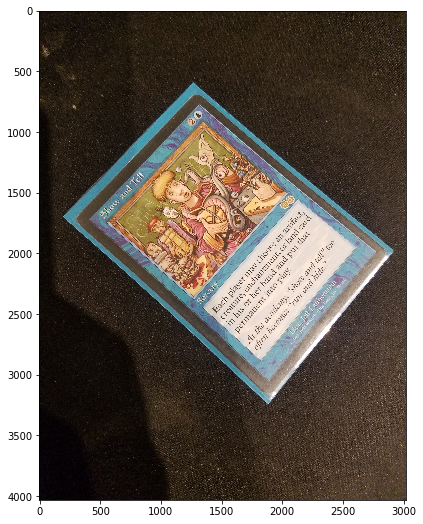

In [26]:
img=cv2.imread("data\\test\\2_142.jpg")
imgwarp=None
min_focus=120
# Check the image is not too blurry
focus=varianceOfLaplacian(img)
if focus < min_focus: 
    print("Focus too low :",focus,'<',min_focus)
else:
    print("Focus :",focus,'>',min_focus)
    display_img(img)

In [27]:
def extract_card (img, output_fn=None, min_focus=120, debug=False):
    """
    """
    
    imgwarp=None
    
    # Check the image is not too blurry
    focus=varianceOfLaplacian(img)
    if focus < min_focus: 
        if debug: print("Focus too low :", focus)
        return False,None
    
    #https://www.pyimagesearch.com/2014/04/21/building-pokedex-python-finding-game-boy-screen-step-4-6/
    #img = cv2.imread('data/test/3_131.jpg')

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    bilateral=cv2.bilateralFilter(gray,11,17,17)

    medBlur = cv2.medianBlur(bilateral,5)

    ret,thresh = cv2.threshold(medBlur,130,255,cv2.THRESH_BINARY)
    #th3 = cv2.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C,cv.THRESH_BINARY,11,2)
    edge=cv2.Canny(thresh,30,200)

    # find contours in the edged image, keep only the largest
    # ones, and initialize our screen contour
    _,contours, hierarchy = cv2.findContours(edge.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = sorted(contours, key = cv2.contourArea, reverse = True)
    #first value
    #sorted_cnt=cnt[0]

    #cv2.imwrite('data/test/edge.jpg',edge)

    #for i, contour in enumerate(sorted_cnt):
        #print(i)
    #    x, y, w, h = cv2.boundingRect(sorted_cnt)
    #    cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 1)
    #      
    contidict={}   
    validict={}
    boxDict={}
    rectDict={}
    # loop over our contours save values into a dict to retrieve the maximum
    for c in range(0,len(cnts)):
        rect=cv2.minAreaRect(cnts[c])
        rectDict[c]=rect
        box=cv2.boxPoints(rect)
        box=np.int0(box)
        boxDict[c]=box
        areaCnt=cv2.contourArea(cnts[c])
        areaBox=cv2.contourArea(box)
        contidict[c]=areaBox
        try:
            valid=areaCnt/areaBox>0.95
            validict[c]=valid
        except:
            validict[c]=False


    #print(valid,':',areaCnt/areaBox)     
    maxarea=max(contidict.items(), key=operator.itemgetter(1))[0]

    #cv2.drawContours(img, [cnts[maxarea]], -1, (0, 255, 0), 3)
    #cv2.imwrite('data/test/outputTest.png', img)
    
    # approximate the contour
    #peri = cv2.arcLength(cnts[maxarea], True)
    #approx = cv2.approxPolyDP(cnts[maxarea], 0.02 * peri, True)
    # if our approximated contour has four points, then
    # we can assume that we have found our screen
    #if len(approx) == 4:
    #    screenCnt = approx
    #    print('rectangle!')
    #else:
    #    print('Not a rectangle.')
        
    if validict[maxarea]:
        # We want transform the zone inside the contour into the reference rectangle of dimensions (cardW,cardH)
        ((xr,yr),(wr,hr),thetar)=rectDict[maxarea]
        # Determine 'Mp' the transformation that transforms 'box' into the reference rectangle
        if wr>hr:
            Mp=cv2.getPerspectiveTransform(np.float32(boxDict[maxarea]),refCard)
        else:
            Mp=cv2.getPerspectiveTransform(np.float32(boxDict[maxarea]),refCardRot)
        # Determine the warped image by applying the transformation to the image
        imgwarp=cv2.warpPerspective(img,Mp,(cardW,cardH))
        # Add alpha layer
        imgwarp=cv2.cvtColor(imgwarp,cv2.COLOR_BGR2BGRA)

        # Shape of 'cnt' is (n,1,2), type=int with n = number of points
        # We reshape into (1,n,2), type=float32, before feeding to perspectiveTransform
        cnta=cnts[maxarea].reshape(1,-1,2).astype(np.float32)
        # Apply the transformation 'Mp' to the contour
        cntwarp=cv2.perspectiveTransform(cnta,Mp)
        cntwarp=cntwarp.astype(np.int)

        # We build the alpha channel so that we have transparency on the
        # external border of the card
        # First, initialize alpha channel fully transparent
        alphachannel=np.zeros(imgwarp.shape[:2],dtype=np.uint8)
        # Then fill in the contour to make opaque this zone of the card 
        cv2.drawContours(alphachannel,cntwarp,0,255,-1)

        # Apply the alphamask onto the alpha channel to clean it
        alphachannel=cv2.bitwise_and(alphachannel,alphamask)

        # Add the alphachannel to the warped image
        imgwarp[:,:,3]=alphachannel

        # Save the image to file
        if output_fn is not None:
            cv2.imwrite(output_fn,imgwarp)

    if debug:
        #cv2.imshow("Gray",gray)
        plt.imshow(gray)
        #cv2.imshow("Canny",edge)
        plt.imshow(edge)
        edge_bgr=cv2.cvtColor(edge,cv2.COLOR_GRAY2BGR)
        cv2.drawContours(edge_bgr,[boxDict[maxarea]],0,(0,0,255),3)
        cv2.drawContours(edge_bgr,[cnts[maxarea]],0,(0,255,0),-1)
        #cv2.imshow("Contour with biggest area",edge_bgr)
        plt.imshow(edge_bgr)
        
        if validict[maxarea]:
            #cv2.imshow("Alphachannel",alphachannel)
            plt.imshow(alphachannel, dtype = np.uint8)
            #cv2.imshow("Extracted card",imgwarp)
            plt.imshow(imgwarp)

    return valid,imgwarp

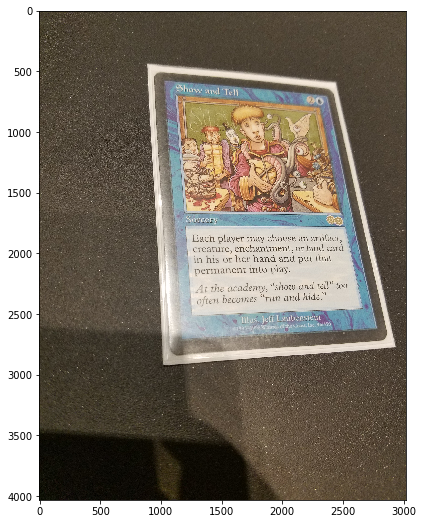

In [28]:
# Test on one image
debug=False
img=cv2.imread("data\\test\\3_131.jpg")
display_img(img)
valid,card=extract_card(img,"data\\test\\extracted_card.png", debug=debug, min_focus=60)
if valid:
    display_img(card)
if debug:
    cv2.waitKey(0)
    cv2.destroyAllWindows()

Function extract_cards_from_video
-----------------

In [29]:
def extract_cards_from_video(video_fn, output_dir=None, keep_ratio=5, min_focus=120, debug=False):
    """
        Extract cards from media file 'video_fn' 
        If 'output_dir' is specified, the cards are saved in 'output_dir'.
        One file per card with a random file name
        Because 2 consecutives frames are probably very similar, we don't use every frame of the video, 
        but only one every 'keep_ratio' frames
        
        Returns list of extracted images
    """
    #Check to see if the file specified is in the file path
    if not os.path.isfile(video_fn):
        print("Video file",video_fn,"does not exist !!!")
        return -1,[]
    #If the object output_dir has a value then change to match
    if output_dir is not None and not os.path.exists(output_dir):
        os.makedirs(output_dir)
        
    cap=cv2.VideoCapture(video_fn)
    
    frame_nb=0
    imgs_list=[]
    while True:
        ret,img=cap.read()
        if not ret: break
        # Work on every 'keep_ratio' frames
        if frame_nb%keep_ratio==0:
            if output_dir is not None:
                output_fn=give_me_filename(output_dir,"png")
            else:
                output_fn=None
            valid,card_img = extract_card(img,output_fn,min_focus=min_focus,debug=debug)
            if debug: 
                k=cv2.waitKey(1)
                if k==27: break
            if valid:
                imgs_list.append(card_img)
        frame_nb+=1
    
    if debug:
        cap.release()
        cv2.destroyAllWindows()
    
    return imgs_list

In [30]:
# Test card extraction from a video   
imgs=extract_cards_from_video("data\\video\\Brainstorm.mp4",output_dir="data\\cards\\Brainstorm",debug=False)
print("Nb images extracted:",len(imgs))

Nb images extracted: 22


Card extraction from all the videos
--------------
We suppose we have for each card_name (ex: 2d, Kc, Ah) one video file named 'card_name.extension' (ex: 2d.avi, Kc.avi, Ah.avi) in a common directory (ex: data/video). If you use images instead of movies, the script below should work by setting the variable 'extension' below to "jpg" or "png". 
The cards from a video, or the card from an image, will be extracted in a subdirectory named 'card_name' placed in the directory 'imgs_dir' (ex: data/cards)

In [31]:
#For 18,000 cards this can take awhile
video_dir="data\\video"
extension="mp4"
imgs_dir="data\\cards"

for name in CardNames:
        card_name=name
        video_fn=os.path.join(video_dir,card_name+"."+extension)
        output_dir=os.path.join(imgs_dir,card_name)
        if not os.path.isdir(output_dir):
            os.makedirs(output_dir)
        imgs=extract_cards_from_video(video_fn,output_dir, min_focus=120)
        #print("Extracted images for %s : %d"%(card_name,len(imgs)))

Video file data\video\Ach_Hans_Run.mp4 does not exist !!!
Video file data\video\Rumors_of_My_Death.mp4 does not exist !!!
Video file data\video\World_Champion.mp4 does not exist !!!
Video file data\video\A_Display_of_My_Dark_Power.mp4 does not exist !!!
Video file data\video\A_Reckoning_Approaches.mp4 does not exist !!!
Video file data\video\AWOL.mp4 does not exist !!!
Video file data\video\Abandon_Hope.mp4 does not exist !!!
Video file data\video\Abandon_Reason.mp4 does not exist !!!
Video file data\video\Abandoned_Outpost.mp4 does not exist !!!
Video file data\video\Abandoned_Sarcophagus.mp4 does not exist !!!
Video file data\video\Abattoir_Ghoul.mp4 does not exist !!!
Video file data\video\Abbey_Gargoyles.mp4 does not exist !!!
Video file data\video\Abbey_Griffin.mp4 does not exist !!!
Video file data\video\Abbey_Matron.mp4 does not exist !!!
Video file data\video\Abbot_of_Keral_Keep.mp4 does not exist !!!
Video file data\video\Abduction.mp4 does not exist !!!
Video file data\video\

Video file data\video\Adverse_Conditions.mp4 does not exist !!!
Video file data\video\Advice_from_the_Fae.mp4 does not exist !!!
Video file data\video\Advocate_of_the_Beast.mp4 does not exist !!!
Video file data\video\Aegis_Angel.mp4 does not exist !!!
Video file data\video\Aegis_Automaton.mp4 does not exist !!!
Video file data\video\Aegis_of_Honor.mp4 does not exist !!!
Video file data\video\Aegis_of_the_Gods.mp4 does not exist !!!
Video file data\video\Aegis_of_the_Heavens.mp4 does not exist !!!
Video file data\video\Aegis_of_the_Meek.mp4 does not exist !!!
Video file data\video\Aeolipile.mp4 does not exist !!!
Video file data\video\Aeon_Chronicler.mp4 does not exist !!!
Video file data\video\Aerathi_Berserker.mp4 does not exist !!!
Video file data\video\Aerial_Caravan.mp4 does not exist !!!
Video file data\video\Aerial_Engineer.mp4 does not exist !!!
Video file data\video\Aerial_Formation.mp4 does not exist !!!
Video file data\video\Aerial_Guide.mp4 does not exist !!!
Video file dat

Video file data\video\Ajani_Last_Stand.mp4 does not exist !!!
Video file data\video\Ajani_Mantra.mp4 does not exist !!!
Video file data\video\Ajani_Presence.mp4 does not exist !!!
Video file data\video\Ajani_Pridemate.mp4 does not exist !!!
Video file data\video\Ajani_Sunstriker.mp4 does not exist !!!
Video file data\video\Ajani_Welcome.mp4 does not exist !!!
Video file data\video\Ajani_Adversary_of_Tyrants.mp4 does not exist !!!
Video file data\video\Ajani_Caller_of_the_Pride.mp4 does not exist !!!
Video file data\video\Ajani_Mentor_of_Heroes.mp4 does not exist !!!
Video file data\video\Ajani_Valiant_Protector.mp4 does not exist !!!
Video file data\video\Ajani_Wise_Counselor.mp4 does not exist !!!
Video file data\video\Akiri_Line_Slinger.mp4 does not exist !!!
Video file data\video\Akki_Avalanchers.mp4 does not exist !!!
Video file data\video\Akki_Blizzard_Herder.mp4 does not exist !!!
Video file data\video\Akki_Coalflinger.mp4 does not exist !!!
Video file data\video\Akki_Drillmaster

Video file data\video\Ambassador_Oak.mp4 does not exist !!!
Video file data\video\Amber_Prison.mp4 does not exist !!!
Video file data\video\Ambiguity.mp4 does not exist !!!
Video file data\video\Ambition_Cost.mp4 does not exist !!!
Video file data\video\Ambitious_Aetherborn.mp4 does not exist !!!
Video file data\video\Ambuscade.mp4 does not exist !!!
Video file data\video\Ambuscade_Shaman.mp4 does not exist !!!
Video file data\video\Ambush.mp4 does not exist !!!
Video file data\video\Ambush_Commander.mp4 does not exist !!!
Video file data\video\Ambush_Krotiq.mp4 does not exist !!!
Video file data\video\Ambush_Party.mp4 does not exist !!!
Video file data\video\Ambush_Viper.mp4 does not exist !!!
Video file data\video\Aminatou_Augury.mp4 does not exist !!!
Video file data\video\Aminatou_the_Fateshifter.mp4 does not exist !!!
Video file data\video\Ammit_Eternal.mp4 does not exist !!!
Video file data\video\Amnesia.mp4 does not exist !!!
Video file data\video\Amoeboid_Changeling.mp4 does no

Video file data\video\Angelic_Wall.mp4 does not exist !!!
Video file data\video\Angelsong.mp4 does not exist !!!
Video file data\video\Anger.mp4 does not exist !!!
Video file data\video\Anger_of_the_Gods.mp4 does not exist !!!
Video file data\video\Angler_Drake.mp4 does not exist !!!
Video file data\video\Angrath_Ambusher.mp4 does not exist !!!
Video file data\video\Angrath_Fury.mp4 does not exist !!!
Video file data\video\Angrath_Marauders.mp4 does not exist !!!
Video file data\video\Angrath_Minotaur_Pirate.mp4 does not exist !!!
Video file data\video\Angrath_the_Flame_Chained.mp4 does not exist !!!
Video file data\video\Angry_Mob.mp4 does not exist !!!
Video file data\video\Anguished_Unmaking.mp4 does not exist !!!
Video file data\video\Angus_Mackenzie.mp4 does not exist !!!
Video file data\video\Animal_Boneyard.mp4 does not exist !!!
Video file data\video\Animal_Magnetism.mp4 does not exist !!!
Video file data\video\Animar_Soul_of_Elements.mp4 does not exist !!!
Video file data\vide

Video file data\video\Arcbound_Hybrid.mp4 does not exist !!!
Video file data\video\Arcbound_Lancer.mp4 does not exist !!!
Video file data\video\Arcbound_Overseer.mp4 does not exist !!!
Video file data\video\Arcbound_Overseer_Avatar.mp4 does not exist !!!
Video file data\video\Arcbound_Ravager.mp4 does not exist !!!
Video file data\video\Arcbound_Reclaimer.mp4 does not exist !!!
Video file data\video\Arcbound_Slith.mp4 does not exist !!!
Video file data\video\Arcbound_Stinger.mp4 does not exist !!!
Video file data\video\Arcbound_Wanderer.mp4 does not exist !!!
Video file data\video\Arcbound_Worker.mp4 does not exist !!!
Video file data\video\Arch_of_Orazca.mp4 does not exist !!!
Video file data\video\Archaeological_Dig.mp4 does not exist !!!
Video file data\video\Archaeomancer.mp4 does not exist !!!
Video file data\video\Archangel.mp4 does not exist !!!
Video file data\video\Archangel_Avacyn.mp4 does not exist !!!
Video file data\video\Archangel_of_Strife.mp4 does not exist !!!
Video fi

Video file data\video\Artful_Looter.mp4 does not exist !!!
Video file data\video\Artful_Maneuver.mp4 does not exist !!!
Video file data\video\Artifact_Blast.mp4 does not exist !!!
Video file data\video\Artifact_Mutation.mp4 does not exist !!!
Video file data\video\Artifact_Possession.mp4 does not exist !!!
Video file data\video\Artifact_Ward.mp4 does not exist !!!
Video file data\video\Artificer_Assistant.mp4 does not exist !!!
Video file data\video\Artificer_Epiphany.mp4 does not exist !!!
Video file data\video\Artificer_Hex.mp4 does not exist !!!
Video file data\video\Artificer_Intuition.mp4 does not exist !!!
Video file data\video\Artificial_Evolution.mp4 does not exist !!!
Video file data\video\Artillerize.mp4 does not exist !!!
Video file data\video\Artisan_of_Forms.mp4 does not exist !!!
Video file data\video\Artisan_of_Kozilek.mp4 does not exist !!!
Video file data\video\Artisan_Sorrow.mp4 does not exist !!!
Video file data\video\Arvad_the_Cursed.mp4 does not exist !!!
Video fil

Video file data\video\Aurification.mp4 does not exist !!!
Video file data\video\Auriok_Bladewarden.mp4 does not exist !!!
Video file data\video\Auriok_Champion.mp4 does not exist !!!
Video file data\video\Auriok_Edgewright.mp4 does not exist !!!
Video file data\video\Auriok_Glaivemaster.mp4 does not exist !!!
Video file data\video\Auriok_Replica.mp4 does not exist !!!
Video file data\video\Auriok_Salvagers.mp4 does not exist !!!
Video file data\video\Auriok_Siege_Sled.mp4 does not exist !!!
Video file data\video\Auriok_Steelshaper.mp4 does not exist !!!
Video file data\video\Auriok_Sunchaser.mp4 does not exist !!!
Video file data\video\Auriok_Survivors.mp4 does not exist !!!
Video file data\video\Auriok_Transfixer.mp4 does not exist !!!
Video file data\video\Auriok_Windwalker.mp4 does not exist !!!
Video file data\video\Aurochs.mp4 does not exist !!!
Video file data\video\Aurochs_Herd.mp4 does not exist !!!
Video file data\video\Aurora_Champion.mp4 does not exist !!!
Video file data\vi

Video file data\video\Azorius_Charm.mp4 does not exist !!!
Video file data\video\Azorius_Cluestone.mp4 does not exist !!!
Video file data\video\Azorius_First_Wing.mp4 does not exist !!!
Video file data\video\Azorius_Guildgate.mp4 does not exist !!!
Video file data\video\Azorius_Guildmage.mp4 does not exist !!!
Video file data\video\Azorius_Herald.mp4 does not exist !!!
Video file data\video\Azorius_Justiciar.mp4 does not exist !!!
Video file data\video\Azorius_Keyrune.mp4 does not exist !!!
Video file data\video\Azorius_Ploy.mp4 does not exist !!!
Video file data\video\Azorius_Signet.mp4 does not exist !!!
Video file data\video\Azra_Bladeseeker.mp4 does not exist !!!
Video file data\video\Azra_Oddsmaker.mp4 does not exist !!!
Video file data\video\Azure_Drake.mp4 does not exist !!!
Video file data\video\Azure_Mage.mp4 does not exist !!!
Video file data\video\Azusa_Lost_but_Seeking.mp4 does not exist !!!
Video file data\video\B_I_N_G_O.mp4 does not exist !!!
Video file data\video\B_Big_

Video file data\video\Barkhide_Mauler.mp4 does not exist !!!
Video file data\video\Barkshell_Blessing.mp4 does not exist !!!
Video file data\video\Barktooth_Warbeard.mp4 does not exist !!!
Video file data\video\Barl_Cage.mp4 does not exist !!!
Video file data\video\Baron_Sengir.mp4 does not exist !!!
Video file data\video\Baron_Von_Count.mp4 does not exist !!!
Video file data\video\Barony_Vampire.mp4 does not exist !!!
Video file data\video\Barrage_Ogre.mp4 does not exist !!!
Video file data\video\Barrage_Tyrant.mp4 does not exist !!!
Video file data\video\Barrage_of_Boulders.mp4 does not exist !!!
Video file data\video\Barrage_of_Expendables.mp4 does not exist !!!
Video file data\video\Barrel_Down_Sokenzan.mp4 does not exist !!!
Video file data\video\Barreling_Attack.mp4 does not exist !!!
Video file data\video\Barren_Glory.mp4 does not exist !!!
Video file data\video\Barren_Moor.mp4 does not exist !!!
Video file data\video\Barrenton_Cragtreads.mp4 does not exist !!!
Video file data\v

Video file data\video\Befuddle.mp4 does not exist !!!
Video file data\video\Beguiler_of_Wills.mp4 does not exist !!!
Video file data\video\Behemoth_Sledge.mp4 does not exist !!!
Video file data\video\Behemoth_Herald.mp4 does not exist !!!
Video file data\video\Behind_the_Scenes.mp4 does not exist !!!
Video file data\video\Behold_My_Grandeur.mp4 does not exist !!!
Video file data\video\Behold_the_Beyond.mp4 does not exist !!!
Video file data\video\Behold_the_Power_of_Destruction.mp4 does not exist !!!
Video file data\video\Belbe_Armor.mp4 does not exist !!!
Video file data\video\Belbe_Percher.mp4 does not exist !!!
Video file data\video\Belbe_Portal.mp4 does not exist !!!
Video file data\video\Belfry_Spirit.mp4 does not exist !!!
Video file data\video\Believe.mp4 does not exist !!!
Video file data\video\Belligerent_Brontodon.mp4 does not exist !!!
Video file data\video\Belligerent_Hatchling.mp4 does not exist !!!
Video file data\video\Belligerent_Sliver.mp4 does not exist !!!
Video file

Video file data\video\Blades_of_Velis_Vel.mp4 does not exist !!!
Video file data\video\Bladetusk_Boar.mp4 does not exist !!!
Video file data\video\Bladewing_the_Risen.mp4 does not exist !!!
Video file data\video\Bladewing_Thrall.mp4 does not exist !!!
Video file data\video\Blanchwood_Armor.mp4 does not exist !!!
Video file data\video\Blanchwood_Treefolk.mp4 does not exist !!!
Video file data\video\Blanket_of_Night.mp4 does not exist !!!
Video file data\video\Blaring_Captain.mp4 does not exist !!!
Video file data\video\Blaring_Recruiter.mp4 does not exist !!!
Video file data\video\Blasphemous_Act.mp4 does not exist !!!
Video file data\video\Blast_from_the_Past.mp4 does not exist !!!
Video file data\video\Blast_of_Genius.mp4 does not exist !!!
Video file data\video\Blasted_Landscape.mp4 does not exist !!!
Video file data\video\Blaster_Mage.mp4 does not exist !!!
Video file data\video\Blastfire_Bolt.mp4 does not exist !!!
Video file data\video\Blasting_Station.mp4 does not exist !!!
Video

Video file data\video\Blood_Vassal.mp4 does not exist !!!
Video file data\video\Blood_of_the_Martyr.mp4 does not exist !!!
Video file data\video\Blood_Chin_Fanatic.mp4 does not exist !!!
Video file data\video\Blood_Chin_Rager.mp4 does not exist !!!
Video file data\video\Blood_Cursed_Knight.mp4 does not exist !!!
Video file data\video\Blood_Toll_Harpy.mp4 does not exist !!!
Video file data\video\Bloodbond_March.mp4 does not exist !!!
Video file data\video\Bloodbond_Vampire.mp4 does not exist !!!
Video file data\video\Bloodborn_Scoundrels.mp4 does not exist !!!
Video file data\video\Bloodbraid_Elf.mp4 does not exist !!!
Video file data\video\Bloodbriar.mp4 does not exist !!!
Video file data\video\Bloodchief_Ascension.mp4 does not exist !!!
Video file data\video\Bloodcrazed_Goblin.mp4 does not exist !!!
Video file data\video\Bloodcrazed_Hoplite.mp4 does not exist !!!
Video file data\video\Bloodcrazed_Neonate.mp4 does not exist !!!
Video file data\video\Bloodcrazed_Paladin.mp4 does not exi

Video file data\video\Bojuka_Brigand.mp4 does not exist !!!
Video file data\video\Bola_Warrior.mp4 does not exist !!!
Video file data\video\Bold_Defense.mp4 does not exist !!!
Video file data\video\Bold_Impaler.mp4 does not exist !!!
Video file data\video\Boldwyr_Heavyweights.mp4 does not exist !!!
Video file data\video\Boldwyr_Intimidator.mp4 does not exist !!!
Video file data\video\Bolt_of_Keranos.mp4 does not exist !!!
Video file data\video\Boltwing_Marauder.mp4 does not exist !!!
Video file data\video\Bomat_Bazaar_Barge.mp4 does not exist !!!
Video file data\video\Bomat_Courier.mp4 does not exist !!!
Video file data\video\Bomb_Squad.mp4 does not exist !!!
Video file data\video\Bombard.mp4 does not exist !!!
Video file data\video\Bomber_Corps.mp4 does not exist !!!
Video file data\video\Bond_Beetle.mp4 does not exist !!!
Video file data\video\Bond_of_Agony.mp4 does not exist !!!
Video file data\video\Bonded_Construct.mp4 does not exist !!!
Video file data\video\Bonded_Fetch.mp4 does

Video file data\video\Braidwood_Cup.mp4 does not exist !!!
Video file data\video\Braidwood_Sextant.mp4 does not exist !!!
Video file data\video\Brain_Freeze.mp4 does not exist !!!
Video file data\video\Brain_Gorgers.mp4 does not exist !!!
Video file data\video\Brain_Maggot.mp4 does not exist !!!
Video file data\video\Brain_Pry.mp4 does not exist !!!
Video file data\video\Brain_Weevil.mp4 does not exist !!!
Video file data\video\Brain_in_a_Jar.mp4 does not exist !!!
Video file data\video\Brainbite.mp4 does not exist !!!
Video file data\video\Braingeyser.mp4 does not exist !!!
Video file data\video\Brainspoil.mp4 does not exist !!!
Video file data\video\Brainwash.mp4 does not exist !!!
Video file data\video\Bramble_Creeper.mp4 does not exist !!!
Video file data\video\Bramble_Elemental.mp4 does not exist !!!
Video file data\video\Bramble_Sovereign.mp4 does not exist !!!
Video file data\video\Bramblecrush.mp4 does not exist !!!
Video file data\video\Bramblesnap.mp4 does not exist !!!
Video

Video file data\video\Broodhatch_Nantuko.mp4 does not exist !!!
Video file data\video\Broodhunter_Wurm.mp4 does not exist !!!
Video file data\video\Brooding_Saurian.mp4 does not exist !!!
Video file data\video\Broodmate_Dragon.mp4 does not exist !!!
Video file data\video\Broodstar.mp4 does not exist !!!
Video file data\video\Broodwarden.mp4 does not exist !!!
Video file data\video\Brothers_Yamazaki.mp4 does not exist !!!
Video file data\video\Brothers_of_Fire.mp4 does not exist !!!
Video file data\video\Browbeat.mp4 does not exist !!!
Video file data\video\Brown_Ouphe.mp4 does not exist !!!
Video file data\video\Browse.mp4 does not exist !!!
Video file data\video\Brudiclad_Telchor_Engineer.mp4 does not exist !!!
Video file data\video\Bruna_Light_of_Alabaster.mp4 does not exist !!!
Video file data\video\Bruna_the_Fading_Light.mp4 does not exist !!!
Video file data\video\Bruse_Tarl_Boorish_Herder.mp4 does not exist !!!
Video file data\video\Brush_with_Death.mp4 does not exist !!!
Video f

Video file data\video\Cadaver_Imp.mp4 does not exist !!!
Video file data\video\Cadaverous_Bloom.mp4 does not exist !!!
Video file data\video\Cadaverous_Knight.mp4 does not exist !!!
Video file data\video\Cage_of_Hands.mp4 does not exist !!!
Video file data\video\Caged_Sun.mp4 does not exist !!!
Video file data\video\Cagemail.mp4 does not exist !!!
Video file data\video\Cairn_Wanderer.mp4 does not exist !!!
Video file data\video\Calciderm.mp4 does not exist !!!
Video file data\video\Calciform_Pools.mp4 does not exist !!!
Video file data\video\Calcite_Snapper.mp4 does not exist !!!
Video file data\video\Calculated_Dismissal.mp4 does not exist !!!
Video file data\video\Caldera_Hellion.mp4 does not exist !!!
Video file data\video\Caldera_Kavu.mp4 does not exist !!!
Video file data\video\Caldera_Lake.mp4 does not exist !!!
Video file data\video\Caligo_Skin_Witch.mp4 does not exist !!!
Video file data\video\Call.mp4 does not exist !!!
Video file data\video\Call_for_Blood.mp4 does not exist !

Video file data\video\Carrion_Feeder.mp4 does not exist !!!
Video file data\video\Carrion_Howler.mp4 does not exist !!!
Video file data\video\Carrion_Rats.mp4 does not exist !!!
Video file data\video\Carrion_Screecher.mp4 does not exist !!!
Video file data\video\Carrion_Thrash.mp4 does not exist !!!
Video file data\video\Carrion_Wall.mp4 does not exist !!!
Video file data\video\Carrion_Wurm.mp4 does not exist !!!
Video file data\video\Carrionette.mp4 does not exist !!!
Video file data\video\Carry_Away.mp4 does not exist !!!
Video file data\video\Cartel_Aristocrat.mp4 does not exist !!!
Video file data\video\Cartographer.mp4 does not exist !!!
Video file data\video\Cartouche_of_Ambition.mp4 does not exist !!!
Video file data\video\Cartouche_of_Knowledge.mp4 does not exist !!!
Video file data\video\Cartouche_of_Solidarity.mp4 does not exist !!!
Video file data\video\Cartouche_of_Strength.mp4 does not exist !!!
Video file data\video\Cartouche_of_Zeal.mp4 does not exist !!!
Video file data

Video file data\video\Cephalid_Pathmage.mp4 does not exist !!!
Video file data\video\Cephalid_Retainer.mp4 does not exist !!!
Video file data\video\Cephalid_Sage.mp4 does not exist !!!
Video file data\video\Cephalid_Scout.mp4 does not exist !!!
Video file data\video\Cephalid_Shrine.mp4 does not exist !!!
Video file data\video\Cephalid_Snitch.mp4 does not exist !!!
Video file data\video\Cephalid_Vandal.mp4 does not exist !!!
Video file data\video\Cerebral_Eruption.mp4 does not exist !!!
Video file data\video\Cerebral_Vortex.mp4 does not exist !!!
Video file data\video\Ceremonial_Guard.mp4 does not exist !!!
Video file data\video\Ceremonious_Rejection.mp4 does not exist !!!
Video file data\video\Cerodon_Yearling.mp4 does not exist !!!
Video file data\video\Certain_Death.mp4 does not exist !!!
Video file data\video\Cerulean_Sphinx.mp4 does not exist !!!
Video file data\video\Cerulean_Wisps.mp4 does not exist !!!
Video file data\video\Cerulean_Wyvern.mp4 does not exist !!!
Video file data\

Video file data\video\Chariot_of_the_Sun.mp4 does not exist !!!
Video file data\video\Charisma.mp4 does not exist !!!
Video file data\video\Charm_Peddler.mp4 does not exist !!!
Video file data\video\Charm_School.mp4 does not exist !!!
Video file data\video\Charmbreaker_Devils.mp4 does not exist !!!
Video file data\video\Charmed_Griffin.mp4 does not exist !!!
Video file data\video\Charmed_Pendant.mp4 does not exist !!!
Video file data\video\Charnelhoard_Wurm.mp4 does not exist !!!
Video file data\video\Chart_a_Course.mp4 does not exist !!!
Video file data\video\Chartooth_Cougar.mp4 does not exist !!!
Video file data\video\Chasm_Drake.mp4 does not exist !!!
Video file data\video\Chasm_Guide.mp4 does not exist !!!
Video file data\video\Chasm_Skulker.mp4 does not exist !!!
Video file data\video\Chastise.mp4 does not exist !!!
Video file data\video\Chatter_of_the_Squirrel.mp4 does not exist !!!
Video file data\video\Cheap_Ass.mp4 does not exist !!!
Video file data\video\Cheatyface.mp4 does 

Video file data\video\Citadel_Castellan.mp4 does not exist !!!
Video file data\video\Citadel_Siege.mp4 does not exist !!!
Video file data\video\Citadel_of_Pain.mp4 does not exist !!!
Video file data\video\Citanul_Centaurs.mp4 does not exist !!!
Video file data\video\Citanul_Druid.mp4 does not exist !!!
Video file data\video\Citanul_Flute.mp4 does not exist !!!
Video file data\video\Citanul_Hierophants.mp4 does not exist !!!
Video file data\video\Citanul_Woodreaders.mp4 does not exist !!!
Video file data\video\City_in_a_Bottle.mp4 does not exist !!!
Video file data\video\City_of_Ass.mp4 does not exist !!!
Video file data\video\City_of_Brass.mp4 does not exist !!!
Video file data\video\City_of_Shadows.mp4 does not exist !!!
Video file data\video\City_of_Solitude.mp4 does not exist !!!
Video file data\video\Civic_Guildmage.mp4 does not exist !!!
Video file data\video\Civic_Saber.mp4 does not exist !!!
Video file data\video\Civic_Wayfinder.mp4 does not exist !!!
Video file data\video\Civil

Video file data\video\Coastal_Piracy.mp4 does not exist !!!
Video file data\video\Coastal_Tower.mp4 does not exist !!!
Video file data\video\Coastal_Wizard.mp4 does not exist !!!
Video file data\video\Coastline_Chimera.mp4 does not exist !!!
Video file data\video\Coat_of_Arms.mp4 does not exist !!!
Video file data\video\Coat_with_Venom.mp4 does not exist !!!
Video file data\video\Coax_from_the_Blind_Eternities.mp4 does not exist !!!
Video file data\video\Cobalt_Golem.mp4 does not exist !!!
Video file data\video\Cobblebrute.mp4 does not exist !!!
Video file data\video\Cobbled_Wings.mp4 does not exist !!!
Video file data\video\Cobra_Trap.mp4 does not exist !!!
Video file data\video\Cockatrice.mp4 does not exist !!!
Video file data\video\Cocoon.mp4 does not exist !!!
Video file data\video\Codex_Shredder.mp4 does not exist !!!
Video file data\video\Coerced_Confession.mp4 does not exist !!!
Video file data\video\Coercion.mp4 does not exist !!!
Video file data\video\Coercive_Portal.mp4 does 

Video file data\video\Conjurer_Closet.mp4 does not exist !!!
Video file data\video\Conquer.mp4 does not exist !!!
Video file data\video\Conquering_Manticore.mp4 does not exist !!!
Video file data\video\Conqueror_Flail.mp4 does not exist !!!
Video file data\video\Conqueror_Foothold.mp4 does not exist !!!
Video file data\video\Conqueror_Galleon.mp4 does not exist !!!
Video file data\video\Conqueror_Pledge.mp4 does not exist !!!
Video file data\video\Consecrate_Land.mp4 does not exist !!!
Video file data\video\Consecrated_Sphinx.mp4 does not exist !!!
Video file data\video\Consecrated_by_Blood.mp4 does not exist !!!
Video file data\video\Conservator.mp4 does not exist !!!
Video file data\video\Consign.mp4 does not exist !!!
Video file data\video\Consign_to_Dream.mp4 does not exist !!!
Video file data\video\Consign_to_Dust.mp4 does not exist !!!
Video file data\video\Conspiracy.mp4 does not exist !!!
Video file data\video\Constant_Mists.mp4 does not exist !!!
Video file data\video\Constric

Video file data\video\Council_of_Advisors.mp4 does not exist !!!
Video file data\video\Council_of_the_Absolute.mp4 does not exist !!!
Video file data\video\Council_Judgment.mp4 does not exist !!!
Video file data\video\Counsel_of_the_Soratami.mp4 does not exist !!!
Video file data\video\Counterbalance.mp4 does not exist !!!
Video file data\video\Counterbore.mp4 does not exist !!!
Video file data\video\Counterflux.mp4 does not exist !!!
Video file data\video\Counterintelligence.mp4 does not exist !!!
Video file data\video\Counterlash.mp4 does not exist !!!
Video file data\video\Countermand.mp4 does not exist !!!
Video file data\video\Counterspell.mp4 does not exist !!!
Video file data\video\Countersquall.mp4 does not exist !!!
Video file data\video\Countervailing_Winds.mp4 does not exist !!!
Video file data\video\Countless_Gears_Renegade.mp4 does not exist !!!
Video file data\video\Countryside_Crusher.mp4 does not exist !!!
Video file data\video\Courageous_Outrider.mp4 does not exist !!!

Video file data\video\Crosis_the_Purger.mp4 does not exist !!!
Video file data\video\Crossbow_Ambush.mp4 does not exist !!!
Video file data\video\Crossbow_Infantry.mp4 does not exist !!!
Video file data\video\Crossroads_Consecrator.mp4 does not exist !!!
Video file data\video\Crosstown_Courier.mp4 does not exist !!!
Video file data\video\Crossway_Vampire.mp4 does not exist !!!
Video file data\video\Crosswinds.mp4 does not exist !!!
Video file data\video\Crovax.mp4 does not exist !!!
Video file data\video\Crovax_the_Cursed.mp4 does not exist !!!
Video file data\video\Crovax_Ascendant_Hero.mp4 does not exist !!!
Video file data\video\Crow_Storm.mp4 does not exist !!!
Video file data\video\Crow_of_Dark_Tidings.mp4 does not exist !!!
Video file data\video\Crowd_Favorites.mp4 does not exist !!!
Video file data\video\Crowd_of_Cinders.mp4 does not exist !!!
Video file data\video\Crowd_Favor.mp4 does not exist !!!
Video file data\video\Crown_of_Ascension.mp4 does not exist !!!
Video file data\

Video file data\video\Curse_of_Bloodletting.mp4 does not exist !!!
Video file data\video\Curse_of_Bounty.mp4 does not exist !!!
Video file data\video\Curse_of_Chains.mp4 does not exist !!!
Video file data\video\Curse_of_Chaos.mp4 does not exist !!!
Video file data\video\Curse_of_Death_Hold.mp4 does not exist !!!
Video file data\video\Curse_of_Disturbance.mp4 does not exist !!!
Video file data\video\Curse_of_Echoes.mp4 does not exist !!!
Video file data\video\Curse_of_Exhaustion.mp4 does not exist !!!
Video file data\video\Curse_of_Inertia.mp4 does not exist !!!
Video file data\video\Curse_of_Marit_Lage.mp4 does not exist !!!
Video file data\video\Curse_of_Misfortunes.mp4 does not exist !!!
Video file data\video\Curse_of_Oblivion.mp4 does not exist !!!
Video file data\video\Curse_of_Opulence.mp4 does not exist !!!
Video file data\video\Curse_of_Predation.mp4 does not exist !!!
Video file data\video\Curse_of_Shallow_Graves.mp4 does not exist !!!
Video file data\video\Curse_of_Stalked_Pre

Video file data\video\Daring_Saboteur.mp4 does not exist !!!
Video file data\video\Daring_Skyjek.mp4 does not exist !!!
Video file data\video\Daring_Sleuth.mp4 does not exist !!!
Video file data\video\Daring_Thief.mp4 does not exist !!!
Video file data\video\Dark_Banishing.mp4 does not exist !!!
Video file data\video\Dark_Bargain.mp4 does not exist !!!
Video file data\video\Dark_Betrayal.mp4 does not exist !!!
Video file data\video\Dark_Confidant.mp4 does not exist !!!
Video file data\video\Dark_Dabbling.mp4 does not exist !!!
Video file data\video\Dark_Deal.mp4 does not exist !!!
Video file data\video\Dark_Depths.mp4 does not exist !!!
Video file data\video\Dark_Favor.mp4 does not exist !!!
Video file data\video\Dark_Hatchling.mp4 does not exist !!!
Video file data\video\Dark_Heart_of_the_Wood.mp4 does not exist !!!
Video file data\video\Dark_Impostor.mp4 does not exist !!!
Video file data\video\Dark_Inquiry.mp4 does not exist !!!
Video file data\video\Dark_Intimations.mp4 does not ex

Video file data\video\Deadapult.mp4 does not exist !!!
Video file data\video\Deadbridge_Chant.mp4 does not exist !!!
Video file data\video\Deadbridge_Goliath.mp4 does not exist !!!
Video file data\video\Deadbridge_Shaman.mp4 does not exist !!!
Video file data\video\Deadeye_Brawler.mp4 does not exist !!!
Video file data\video\Deadeye_Harpooner.mp4 does not exist !!!
Video file data\video\Deadeye_Navigator.mp4 does not exist !!!
Video file data\video\Deadeye_Plunderers.mp4 does not exist !!!
Video file data\video\Deadeye_Quartermaster.mp4 does not exist !!!
Video file data\video\Deadeye_Rig_Hauler.mp4 does not exist !!!
Video file data\video\Deadeye_Tormentor.mp4 does not exist !!!
Video file data\video\Deadeye_Tracker.mp4 does not exist !!!
Video file data\video\Deadfall.mp4 does not exist !!!
Video file data\video\Deadhead.mp4 does not exist !!!
Video file data\video\Deadlock_Trap.mp4 does not exist !!!
Video file data\video\Deadly_Allure.mp4 does not exist !!!
Video file data\video\De

Video file data\video\Deepfire_Elemental.mp4 does not exist !!!
Video file data\video\Deepglow_Skate.mp4 does not exist !!!
Video file data\video\Deeproot_Champion.mp4 does not exist !!!
Video file data\video\Deeproot_Elite.mp4 does not exist !!!
Video file data\video\Deeproot_Warrior.mp4 does not exist !!!
Video file data\video\Deeproot_Waters.mp4 does not exist !!!
Video file data\video\Deeptread_Merrow.mp4 does not exist !!!
Video file data\video\Deepwater_Hypnotist.mp4 does not exist !!!
Video file data\video\Deepwood_Drummer.mp4 does not exist !!!
Video file data\video\Deepwood_Elder.mp4 does not exist !!!
Video file data\video\Deepwood_Ghoul.mp4 does not exist !!!
Video file data\video\Deepwood_Legate.mp4 does not exist !!!
Video file data\video\Deepwood_Tantiv.mp4 does not exist !!!
Video file data\video\Deepwood_Wolverine.mp4 does not exist !!!
Video file data\video\Defang.mp4 does not exist !!!
Video file data\video\Defeat.mp4 does not exist !!!
Video file data\video\Defective

Video file data\video\Desecrated_Tomb.mp4 does not exist !!!
Video file data\video\Desecration_Demon.mp4 does not exist !!!
Video file data\video\Desecration_Elemental.mp4 does not exist !!!
Video file data\video\Desecration_Plague.mp4 does not exist !!!
Video file data\video\Desecrator_Hag.mp4 does not exist !!!
Video file data\video\Desert.mp4 does not exist !!!
Video file data\video\Desert_Cerodon.mp4 does not exist !!!
Video file data\video\Desert_Drake.mp4 does not exist !!!
Video file data\video\Desert_Nomads.mp4 does not exist !!!
Video file data\video\Desert_Sandstorm.mp4 does not exist !!!
Video file data\video\Desert_Twister.mp4 does not exist !!!
Video file data\video\Desert_of_the_Fervent.mp4 does not exist !!!
Video file data\video\Desert_of_the_Glorified.mp4 does not exist !!!
Video file data\video\Desert_of_the_Indomitable.mp4 does not exist !!!
Video file data\video\Desert_of_the_Mindful.mp4 does not exist !!!
Video file data\video\Desert_of_the_True.mp4 does not exist 

Video file data\video\Dingus_Egg.mp4 does not exist !!!
Video file data\video\Dingus_Staff.mp4 does not exist !!!
Video file data\video\Dinosaur_Hunter.mp4 does not exist !!!
Video file data\video\Dinosaur_Stampede.mp4 does not exist !!!
Video file data\video\Dinrova_Horror.mp4 does not exist !!!
Video file data\video\Diplomacy_of_the_Wastes.mp4 does not exist !!!
Video file data\video\Diplomatic_Escort.mp4 does not exist !!!
Video file data\video\Diplomatic_Immunity.mp4 does not exist !!!
Video file data\video\Dire_Fleet_Captain.mp4 does not exist !!!
Video file data\video\Dire_Fleet_Daredevil.mp4 does not exist !!!
Video file data\video\Dire_Fleet_Hoarder.mp4 does not exist !!!
Video file data\video\Dire_Fleet_Interloper.mp4 does not exist !!!
Video file data\video\Dire_Fleet_Neckbreaker.mp4 does not exist !!!
Video file data\video\Dire_Fleet_Poisoner.mp4 does not exist !!!
Video file data\video\Dire_Fleet_Ravager.mp4 does not exist !!!
Video file data\video\Dire_Undercurrents.mp4 do

Video file data\video\Djeru_Renunciation.mp4 does not exist !!!
Video file data\video\Djeru_Resolve.mp4 does not exist !!!
Video file data\video\Djeru_With_Eyes_Open.mp4 does not exist !!!
Video file data\video\Djinn_Illuminatus.mp4 does not exist !!!
Video file data\video\Djinn_of_Infinite_Deceits.mp4 does not exist !!!
Video file data\video\Djinn_of_Wishes.mp4 does not exist !!!
Video file data\video\Djinn_of_the_Lamp.mp4 does not exist !!!
Video file data\video\Do_or_Die.mp4 does not exist !!!
Video file data\video\Do_It_Yourself_Seraph.mp4 does not exist !!!
Video file data\video\Docent_of_Perfection.mp4 does not exist !!!
Video file data\video\Dodecapod.mp4 does not exist !!!
Video file data\video\Dogged_Hunter.mp4 does not exist !!!
Video file data\video\Dogpile.mp4 does not exist !!!
Video file data\video\Dogsnail_Engine.mp4 does not exist !!!
Video file data\video\Dokai_Weaver_of_Life.mp4 does not exist !!!
Video file data\video\Dolmen_Gate.mp4 does not exist !!!
Video file dat

Video file data\video\Draining_Whelk.mp4 does not exist !!!
Video file data\video\Drainpipe_Vermin.mp4 does not exist !!!
Video file data\video\Drake_Familiar.mp4 does not exist !!!
Video file data\video\Drake_Hatchling.mp4 does not exist !!!
Video file data\video\Drake_Haven.mp4 does not exist !!!
Video file data\video\Drake_Umbra.mp4 does not exist !!!
Video file data\video\Drake_Skull_Cameo.mp4 does not exist !!!
Video file data\video\Drakestown_Forgotten.mp4 does not exist !!!
Video file data\video\Drakewing_Krasis.mp4 does not exist !!!
Video file data\video\Dralnu_Crusade.mp4 does not exist !!!
Video file data\video\Dralnu_Pet.mp4 does not exist !!!
Video file data\video\Dralnu_Lich_Lord.mp4 does not exist !!!
Video file data\video\Dramatic_Entrance.mp4 does not exist !!!
Video file data\video\Dramatic_Rescue.mp4 does not exist !!!
Video file data\video\Dramatic_Reversal.mp4 does not exist !!!
Video file data\video\Drana_Chosen.mp4 does not exist !!!
Video file data\video\Drana_E

Video file data\video\Drudge_Spell.mp4 does not exist !!!
Video file data\video\Druid_Lyrist.mp4 does not exist !!!
Video file data\video\Druid_of_Horns.mp4 does not exist !!!
Video file data\video\Druid_of_the_Anima.mp4 does not exist !!!
Video file data\video\Druid_of_the_Cowl.mp4 does not exist !!!
Video file data\video\Druid_of_the_Sacred_Beaker.mp4 does not exist !!!
Video file data\video\Druid_Call.mp4 does not exist !!!
Video file data\video\Druid_Deliverance.mp4 does not exist !!!
Video file data\video\Druid_Familiar.mp4 does not exist !!!
Video file data\video\Druidic_Satchel.mp4 does not exist !!!
Video file data\video\Druids_Repository.mp4 does not exist !!!
Video file data\video\Drumhunter.mp4 does not exist !!!
Video file data\video\Drunau_Corpse_Trawler.mp4 does not exist !!!
Video file data\video\Dry_Spell.mp4 does not exist !!!
Video file data\video\Dryad_Arbor.mp4 does not exist !!!
Video file data\video\Dryad_Greenseeker.mp4 does not exist !!!
Video file data\video\Dr

Video file data\video\Earnest_Fellowship.mp4 does not exist !!!
Video file data\video\Earsplitting_Rats.mp4 does not exist !!!
Video file data\video\Earth.mp4 does not exist !!!
Video file data\video\Earth_Elemental.mp4 does not exist !!!
Video file data\video\Earth_Rift.mp4 does not exist !!!
Video file data\video\Earth_Servant.mp4 does not exist !!!
Video file data\video\Earth_Surge.mp4 does not exist !!!
Video file data\video\Earth_Origin_Yak.mp4 does not exist !!!
Video file data\video\Earthbind.mp4 does not exist !!!
Video file data\video\Earthblighter.mp4 does not exist !!!
Video file data\video\Earthbrawn.mp4 does not exist !!!
Video file data\video\Earthcraft.mp4 does not exist !!!
Video file data\video\Earthen_Arms.mp4 does not exist !!!
Video file data\video\Earthen_Goo.mp4 does not exist !!!
Video file data\video\Earthlink.mp4 does not exist !!!
Video file data\video\Earthlore.mp4 does not exist !!!
Video file data\video\Earthquake.mp4 does not exist !!!
Video file data\vide

Video file data\video\Elgaud_Inquisitor.mp4 does not exist !!!
Video file data\video\Elgaud_Shieldmate.mp4 does not exist !!!
Video file data\video\Eliminate_the_Competition.mp4 does not exist !!!
Video file data\video\Elite_Arcanist.mp4 does not exist !!!
Video file data\video\Elite_Archers.mp4 does not exist !!!
Video file data\video\Elite_Cat_Warrior.mp4 does not exist !!!
Video file data\video\Elite_Inquisitor.mp4 does not exist !!!
Video file data\video\Elite_Javelineer.mp4 does not exist !!!
Video file data\video\Elite_Scaleguard.mp4 does not exist !!!
Video file data\video\Elite_Skirmisher.mp4 does not exist !!!
Video file data\video\Elite_Vanguard.mp4 does not exist !!!
Video file data\video\Elixir_of_Immortality.mp4 does not exist !!!
Video file data\video\Elixir_of_Vitality.mp4 does not exist !!!
Video file data\video\Elkin_Bottle.mp4 does not exist !!!
Video file data\video\Elkin_Lair.mp4 does not exist !!!
Video file data\video\Eloren_Wilds.mp4 does not exist !!!
Video file

Video file data\video\Enatu_Golem.mp4 does not exist !!!
Video file data\video\Encampment_Keeper.mp4 does not exist !!!
Video file data\video\Encase_in_Ice.mp4 does not exist !!!
Video file data\video\Enchanted_Being.mp4 does not exist !!!
Video file data\video\Enchanted_Evening.mp4 does not exist !!!
Video file data\video\Enchanter_Bane.mp4 does not exist !!!
Video file data\video\Enchantment_Alteration.mp4 does not exist !!!
Video file data\video\Enchantress_Presence.mp4 does not exist !!!
Video file data\video\Encircling_Fissure.mp4 does not exist !!!
Video file data\video\Enclave_Cryptologist.mp4 does not exist !!!
Video file data\video\Enclave_Elite.mp4 does not exist !!!
Video file data\video\Encroach.mp4 does not exist !!!
Video file data\video\Encroaching_Wastes.mp4 does not exist !!!
Video file data\video\Encrust.mp4 does not exist !!!
Video file data\video\End_Hostilities.mp4 does not exist !!!
Video file data\video\Endangered_Armodon.mp4 does not exist !!!
Video file data\vi

Video file data\video\Erebos_God_of_the_Dead.mp4 does not exist !!!
Video file data\video\Erg_Raiders.mp4 does not exist !!!
Video file data\video\Erhnam_Djinn.mp4 does not exist !!!
Video file data\video\Erhnam_Djinn_Avatar.mp4 does not exist !!!
Video file data\video\Erithizon.mp4 does not exist !!!
Video file data\video\Eron_the_Relentless.mp4 does not exist !!!
Video file data\video\Erosion.mp4 does not exist !!!
Video file data\video\Errand_of_Duty.mp4 does not exist !!!
Video file data\video\Errant_Doomsayers.mp4 does not exist !!!
Video file data\video\Errant_Ephemeron.mp4 does not exist !!!
Video file data\video\Errant_Minion.mp4 does not exist !!!
Video file data\video\Errantry.mp4 does not exist !!!
Video file data\video\Erratic_Explosion.mp4 does not exist !!!
Video file data\video\Erratic_Mutation.mp4 does not exist !!!
Video file data\video\Erratic_Portal.mp4 does not exist !!!
Video file data\video\Error.mp4 does not exist !!!
Video file data\video\Ersatz_Gnomes.mp4 does 

Video file data\video\Exava_Rakdos_Blood_Witch.mp4 does not exist !!!
Video file data\video\Excavation.mp4 does not exist !!!
Video file data\video\Excavation_Elephant.mp4 does not exist !!!
Video file data\video\Excavator.mp4 does not exist !!!
Video file data\video\Excise.mp4 does not exist !!!
Video file data\video\Exclude.mp4 does not exist !!!
Video file data\video\Exclusion_Mage.mp4 does not exist !!!
Video file data\video\Exclusion_Ritual.mp4 does not exist !!!
Video file data\video\Excommunicate.mp4 does not exist !!!
Video file data\video\Excoriate.mp4 does not exist !!!
Video file data\video\Excruciator.mp4 does not exist !!!
Video file data\video\Execute.mp4 does not exist !!!
Video file data\video\Executioner_Capsule.mp4 does not exist !!!
Video file data\video\Executioner_Hood.mp4 does not exist !!!
Video file data\video\Executioner_Swing.mp4 does not exist !!!
Video file data\video\Exemplar_of_Strength.mp4 does not exist !!!
Video file data\video\Exert_Influence.mp4 does 

Video file data\video\Faithful_Squire.mp4 does not exist !!!
Video file data\video\Faithless_Looting.mp4 does not exist !!!
Video file data\video\Falkenrath_Aristocrat.mp4 does not exist !!!
Video file data\video\Falkenrath_Exterminator.mp4 does not exist !!!
Video file data\video\Falkenrath_Gorger.mp4 does not exist !!!
Video file data\video\Falkenrath_Marauders.mp4 does not exist !!!
Video file data\video\Falkenrath_Noble.mp4 does not exist !!!
Video file data\video\Falkenrath_Reaver.mp4 does not exist !!!
Video file data\video\Falkenrath_Torturer.mp4 does not exist !!!
Video file data\video\Fall.mp4 does not exist !!!
Video file data\video\Fall_of_the_Gavel.mp4 does not exist !!!
Video file data\video\Fall_of_the_Hammer.mp4 does not exist !!!
Video file data\video\Fall_of_the_Thran.mp4 does not exist !!!
Video file data\video\Fall_of_the_Titans.mp4 does not exist !!!
Video file data\video\Fallen_Angel.mp4 does not exist !!!
Video file data\video\Fallen_Angel_Avatar.mp4 does not exis

Video file data\video\Feiyi_Snake.mp4 does not exist !!!
Video file data\video\Feldon_of_the_Third_Path.mp4 does not exist !!!
Video file data\video\Feldon_Cane.mp4 does not exist !!!
Video file data\video\Felhide_Brawler.mp4 does not exist !!!
Video file data\video\Felhide_Minotaur.mp4 does not exist !!!
Video file data\video\Felhide_Petrifier.mp4 does not exist !!!
Video file data\video\Felhide_Spiritbinder.mp4 does not exist !!!
Video file data\video\Felidar_Cub.mp4 does not exist !!!
Video file data\video\Felidar_Guardian.mp4 does not exist !!!
Video file data\video\Felidar_Sovereign.mp4 does not exist !!!
Video file data\video\Felidar_Umbra.mp4 does not exist !!!
Video file data\video\Fell_Flagship.mp4 does not exist !!!
Video file data\video\Fell_Shepherd.mp4 does not exist !!!
Video file data\video\Fell_Specter.mp4 does not exist !!!
Video file data\video\Fell_the_Mighty.mp4 does not exist !!!
Video file data\video\Fellwar_Stone.mp4 does not exist !!!
Video file data\video\Femer

Video file data\video\Final_Sting_Faerie.mp4 does not exist !!!
Video file data\video\Finders_Keepers.mp4 does not exist !!!
Video file data\video\Finest_Hour.mp4 does not exist !!!
Video file data\video\Finish.mp4 does not exist !!!
Video file data\video\Fire.mp4 does not exist !!!
Video file data\video\Fire_Ambush.mp4 does not exist !!!
Video file data\video\Fire_Ants.mp4 does not exist !!!
Video file data\video\Fire_Bowman.mp4 does not exist !!!
Video file data\video\Fire_Covenant.mp4 does not exist !!!
Video file data\video\Fire_Diamond.mp4 does not exist !!!
Video file data\video\Fire_Dragon.mp4 does not exist !!!
Video file data\video\Fire_Drake.mp4 does not exist !!!
Video file data\video\Fire_Elemental.mp4 does not exist !!!
Video file data\video\Fire_Imp.mp4 does not exist !!!
Video file data\video\Fire_Juggler.mp4 does not exist !!!
Video file data\video\Fire_Servant.mp4 does not exist !!!
Video file data\video\Fire_Shrine_Keeper.mp4 does not exist !!!
Video file data\video\F

Video file data\video\Flash_of_Insight.mp4 does not exist !!!
Video file data\video\Flashfires.mp4 does not exist !!!
Video file data\video\Flashfreeze.mp4 does not exist !!!
Video file data\video\Flatten.mp4 does not exist !!!
Video file data\video\Flay.mp4 does not exist !!!
Video file data\video\Flayed_Nim.mp4 does not exist !!!
Video file data\video\Flayer_Drone.mp4 does not exist !!!
Video file data\video\Flayer_Husk.mp4 does not exist !!!
Video file data\video\Flayer_of_the_Hatebound.mp4 does not exist !!!
Video file data\video\Flaying_Tendrils.mp4 does not exist !!!
Video file data\video\Fledgling_Djinn.mp4 does not exist !!!
Video file data\video\Fledgling_Dragon.mp4 does not exist !!!
Video file data\video\Fledgling_Griffin.mp4 does not exist !!!
Video file data\video\Fledgling_Imp.mp4 does not exist !!!
Video file data\video\Fledgling_Mawcor.mp4 does not exist !!!
Video file data\video\Fledgling_Osprey.mp4 does not exist !!!
Video file data\video\Fleecemane_Lion.mp4 does not 

Video file data\video\Forbidden_Lore.mp4 does not exist !!!
Video file data\video\Forbidden_Orchard.mp4 does not exist !!!
Video file data\video\Forbidden_Ritual.mp4 does not exist !!!
Video file data\video\Forbidding_Watchtower.mp4 does not exist !!!
Video file data\video\Force_Away.mp4 does not exist !!!
Video file data\video\Force_Bubble.mp4 does not exist !!!
Video file data\video\Force_Spike.mp4 does not exist !!!
Video file data\video\Force_Void.mp4 does not exist !!!
Video file data\video\Force_of_Nature.mp4 does not exist !!!
Video file data\video\Force_of_Savagery.mp4 does not exist !!!
Video file data\video\Forced_Adaptation.mp4 does not exist !!!
Video file data\video\Forced_Fruition.mp4 does not exist !!!
Video file data\video\Forced_March.mp4 does not exist !!!
Video file data\video\Forced_Retreat.mp4 does not exist !!!
Video file data\video\Forced_Worship.mp4 does not exist !!!
Video file data\video\Forcefield.mp4 does not exist !!!
Video file data\video\Forcemage_Advocat

Video file data\video\Fretwork_Colony.mp4 does not exist !!!
Video file data\video\Freyalise_Supplicant.mp4 does not exist !!!
Video file data\video\Freyalise_Charm.mp4 does not exist !!!
Video file data\video\Freyalise_Radiance.mp4 does not exist !!!
Video file data\video\Freyalise_Winds.mp4 does not exist !!!
Video file data\video\Freyalise_Llanowar_Fury.mp4 does not exist !!!
Video file data\video\Friendly_Fire.mp4 does not exist !!!
Video file data\video\Frightcrawler.mp4 does not exist !!!
Video file data\video\Frightful_Delusion.mp4 does not exist !!!
Video file data\video\Frightshroud_Courier.mp4 does not exist !!!
Video file data\video\Frilled_Deathspitter.mp4 does not exist !!!
Video file data\video\Frilled_Oculus.mp4 does not exist !!!
Video file data\video\Frilled_Sandwalla.mp4 does not exist !!!
Video file data\video\Frilled_Sea_Serpent.mp4 does not exist !!!
Video file data\video\Frog_Tongue.mp4 does not exist !!!
Video file data\video\Frogmite.mp4 does not exist !!!
Video

Video file data\video\Galvanic_Bombardment.mp4 does not exist !!!
Video file data\video\Galvanic_Juggernaut.mp4 does not exist !!!
Video file data\video\Galvanic_Key.mp4 does not exist !!!
Video file data\video\Galvanoth.mp4 does not exist !!!
Video file data\video\Gamble.mp4 does not exist !!!
Video file data\video\Game_Plan.mp4 does not exist !!!
Video file data\video\Game_Preserve.mp4 does not exist !!!
Video file data\video\Game_Trail.mp4 does not exist !!!
Video file data\video\Game_of_Chaos.mp4 does not exist !!!
Video file data\video\Game_Trail_Changeling.mp4 does not exist !!!
Video file data\video\Gamekeeper.mp4 does not exist !!!
Video file data\video\Gang_Up.mp4 does not exist !!!
Video file data\video\Gang_of_Devils.mp4 does not exist !!!
Video file data\video\Gang_of_Elk.mp4 does not exist !!!
Video file data\video\Gangrenous_Goliath.mp4 does not exist !!!
Video file data\video\Gangrenous_Zombies.mp4 does not exist !!!
Video file data\video\Garbage_Elemental_a.mp4 does not

Video file data\video\Gerrymandering.mp4 does not exist !!!
Video file data\video\Get_a_Life.mp4 does not exist !!!
Video file data\video\Geth_Grimoire.mp4 does not exist !!!
Video file data\video\Geth_Verdict.mp4 does not exist !!!
Video file data\video\Geth_Lord_of_the_Vault.mp4 does not exist !!!
Video file data\video\Geyser_Glider.mp4 does not exist !!!
Video file data\video\Geyserfield_Stalker.mp4 does not exist !!!
Video file data\video\Ghalma_Warden.mp4 does not exist !!!
Video file data\video\Ghalta_Primal_Hunger.mp4 does not exist !!!
Video file data\video\Ghastbark_Twins.mp4 does not exist !!!
Video file data\video\Ghastlord_of_Fugue.mp4 does not exist !!!
Video file data\video\Ghastly_Conscription.mp4 does not exist !!!
Video file data\video\Ghastly_Demise.mp4 does not exist !!!
Video file data\video\Ghastly_Discovery.mp4 does not exist !!!
Video file data\video\Ghastly_Haunting.mp4 does not exist !!!
Video file data\video\Ghastly_Remains.mp4 does not exist !!!
Video file da

Video file data\video\Gigadrowse.mp4 does not exist !!!
Video file data\video\Gigantiform.mp4 does not exist !!!
Video file data\video\Gigantomancer.mp4 does not exist !!!
Video file data\video\Gigantoplasm.mp4 does not exist !!!
Video file data\video\Gigantosaurus.mp4 does not exist !!!
Video file data\video\Gigapede.mp4 does not exist !!!
Video file data\video\Gild.mp4 does not exist !!!
Video file data\video\Gilded_Cerodon.mp4 does not exist !!!
Video file data\video\Gilded_Drake.mp4 does not exist !!!
Video file data\video\Gilded_Light.mp4 does not exist !!!
Video file data\video\Gilded_Lotus.mp4 does not exist !!!
Video file data\video\Gilded_Sentinel.mp4 does not exist !!!
Video file data\video\Gilder_Bairn.mp4 does not exist !!!
Video file data\video\Gilt_Leaf_Ambush.mp4 does not exist !!!
Video file data\video\Gilt_Leaf_Archdruid.mp4 does not exist !!!
Video file data\video\Gilt_Leaf_Palace.mp4 does not exist !!!
Video file data\video\Gilt_Leaf_Seer.mp4 does not exist !!!
Video

Video file data\video\Gnat_Alley_Creeper.mp4 does not exist !!!
Video file data\video\Gnat_Miser.mp4 does not exist !!!
Video file data\video\Gnathosaur.mp4 does not exist !!!
Video file data\video\Gnaw_to_the_Bone.mp4 does not exist !!!
Video file data\video\Gnawing_Zombie.mp4 does not exist !!!
Video file data\video\Gnome_Made_Engine.mp4 does not exist !!!
Video file data\video\Gnomeball_Machine.mp4 does not exist !!!
Video file data\video\Go_for_the_Throat.mp4 does not exist !!!
Video file data\video\Goatnapper.mp4 does not exist !!!
Video file data\video\Gobbling_Ooze.mp4 does not exist !!!
Video file data\video\Gobhobbler_Rats.mp4 does not exist !!!
Video file data\video\Goblin.mp4 does not exist !!!
Video file data\video\Goblin_Archaeologist.mp4 does not exist !!!
Video file data\video\Goblin_Arsonist.mp4 does not exist !!!
Video file data\video\Goblin_Artillery.mp4 does not exist !!!
Video file data\video\Goblin_Artisans.mp4 does not exist !!!
Video file data\video\Goblin_Assass

Video file data\video\Goblin_Swine_Rider.mp4 does not exist !!!
Video file data\video\Goblin_Taskmaster.mp4 does not exist !!!
Video file data\video\Goblin_Test_Pilot.mp4 does not exist !!!
Video file data\video\Goblin_Tinkerer.mp4 does not exist !!!
Video file data\video\Goblin_Trailblazer.mp4 does not exist !!!
Video file data\video\Goblin_Trashmaster.mp4 does not exist !!!
Video file data\video\Goblin_Trenches.mp4 does not exist !!!
Video file data\video\Goblin_Tunneler.mp4 does not exist !!!
Video file data\video\Goblin_Turncoat.mp4 does not exist !!!
Video file data\video\Goblin_Tutor.mp4 does not exist !!!
Video file data\video\Goblin_Vandal.mp4 does not exist !!!
Video file data\video\Goblin_War_Buggy.mp4 does not exist !!!
Video file data\video\Goblin_War_Cry.mp4 does not exist !!!
Video file data\video\Goblin_War_Drums.mp4 does not exist !!!
Video file data\video\Goblin_War_Paint.mp4 does not exist !!!
Video file data\video\Goblin_War_Strike.mp4 does not exist !!!
Video file d

Video file data\video\Grandmother_Sengir.mp4 does not exist !!!
Video file data\video\Granger_Guildmage.mp4 does not exist !!!
Video file data\video\Granite_Gargoyle.mp4 does not exist !!!
Video file data\video\Granite_Grip.mp4 does not exist !!!
Video file data\video\Granite_Shard.mp4 does not exist !!!
Video file data\video\Granitic_Titan.mp4 does not exist !!!
Video file data\video\Granny_Payback.mp4 does not exist !!!
Video file data\video\Granulate.mp4 does not exist !!!
Video file data\video\Grapeshot.mp4 does not exist !!!
Video file data\video\Grapeshot_Catapult.mp4 does not exist !!!
Video file data\video\Graphic_Violence.mp4 does not exist !!!
Video file data\video\Grapple_with_the_Past.mp4 does not exist !!!
Video file data\video\Grappler_Spider.mp4 does not exist !!!
Video file data\video\Grappling_Hook.mp4 does not exist !!!
Video file data\video\Grasp_of_Darkness.mp4 does not exist !!!
Video file data\video\Grasp_of_Fate.mp4 does not exist !!!
Video file data\video\Grasp_

Video file data\video\Grim_Captain_Call.mp4 does not exist !!!
Video file data\video\Grim_Contest.mp4 does not exist !!!
Video file data\video\Grim_Discovery.mp4 does not exist !!!
Video file data\video\Grim_Feast.mp4 does not exist !!!
Video file data\video\Grim_Flayer.mp4 does not exist !!!
Video file data\video\Grim_Flowering.mp4 does not exist !!!
Video file data\video\Grim_Guardian.mp4 does not exist !!!
Video file data\video\Grim_Haruspex.mp4 does not exist !!!
Video file data\video\Grim_Harvest.mp4 does not exist !!!
Video file data\video\Grim_Lavamancer.mp4 does not exist !!!
Video file data\video\Grim_Monolith.mp4 does not exist !!!
Video file data\video\Grim_Poppet.mp4 does not exist !!!
Video file data\video\Grim_Reminder.mp4 does not exist !!!
Video file data\video\Grim_Return.mp4 does not exist !!!
Video file data\video\Grim_Roustabout.mp4 does not exist !!!
Video file data\video\Grim_Strider.mp4 does not exist !!!
Video file data\video\Grim_Tutor.mp4 does not exist !!!
Vi

Video file data\video\Gudul_Lurker.mp4 does not exist !!!
Video file data\video\Guerrilla_Tactics.mp4 does not exist !!!
Video file data\video\Guest_List.mp4 does not exist !!!
Video file data\video\Guided_Passage.mp4 does not exist !!!
Video file data\video\Guided_Strike.mp4 does not exist !!!
Video file data\video\Guiding_Spirit.mp4 does not exist !!!
Video file data\video\Guild_Feud.mp4 does not exist !!!
Video file data\video\Guildscorn_Ward.mp4 does not exist !!!
Video file data\video\Guile.mp4 does not exist !!!
Video file data\video\Guiltfeeder.mp4 does not exist !!!
Video file data\video\Guilty_Conscience.mp4 does not exist !!!
Video file data\video\Guise_of_Fire.mp4 does not exist !!!
Video file data\video\Gulf_Squid.mp4 does not exist !!!
Video file data\video\Guma.mp4 does not exist !!!
Video file data\video\Gurmag_Angler.mp4 does not exist !!!
Video file data\video\Gurmag_Drowner.mp4 does not exist !!!
Video file data\video\Gurmag_Swiftwing.mp4 does not exist !!!
Video file

Video file data\video\Harbinger_of_Spring.mp4 does not exist !!!
Video file data\video\Harbinger_of_the_Hunt.mp4 does not exist !!!
Video file data\video\Harbinger_of_the_Tides.mp4 does not exist !!!
Video file data\video\Harbor_Bandit.mp4 does not exist !!!
Video file data\video\Harbor_Guardian.mp4 does not exist !!!
Video file data\video\Harbor_Serpent.mp4 does not exist !!!
Video file data\video\Hard_Hat_Area.mp4 does not exist !!!
Video file data\video\Hardened_Berserker.mp4 does not exist !!!
Video file data\video\Hardened_Scales.mp4 does not exist !!!
Video file data\video\Hardened_Scale_Armor.mp4 does not exist !!!
Video file data\video\Hardy_Veteran.mp4 does not exist !!!
Video file data\video\Harm_Way.mp4 does not exist !!!
Video file data\video\Harmattan_Efreet.mp4 does not exist !!!
Video file data\video\Harmless_Assault.mp4 does not exist !!!
Video file data\video\Harmless_Offering.mp4 does not exist !!!
Video file data\video\Harmonic_Convergence.mp4 does not exist !!!
Vide

Video file data\video\Heartwood_Dryad.mp4 does not exist !!!
Video file data\video\Heartwood_Giant.mp4 does not exist !!!
Video file data\video\Heartwood_Shard.mp4 does not exist !!!
Video file data\video\Heartwood_Storyteller.mp4 does not exist !!!
Video file data\video\Heartwood_Storyteller_Avatar.mp4 does not exist !!!
Video file data\video\Heartwood_Treefolk.mp4 does not exist !!!
Video file data\video\Heat_Ray.mp4 does not exist !!!
Video file data\video\Heat_Shimmer.mp4 does not exist !!!
Video file data\video\Heat_Stroke.mp4 does not exist !!!
Video file data\video\Heat_Wave.mp4 does not exist !!!
Video file data\video\Heat_of_Battle.mp4 does not exist !!!
Video file data\video\Heaven.mp4 does not exist !!!
Video file data\video\Heaven_Gate.mp4 does not exist !!!
Video file data\video\Heavenly_Blademaster.mp4 does not exist !!!
Video file data\video\Heavenly_Qilin.mp4 does not exist !!!
Video file data\video\Heavy_Arbalest.mp4 does not exist !!!
Video file data\video\Heavy_Balli

Video file data\video\Hibernation_Sliver.mp4 does not exist !!!
Video file data\video\Hibernation_End.mp4 does not exist !!!
Video file data\video\Hickory_Woodlot.mp4 does not exist !!!
Video file data\video\Hidden_Ancients.mp4 does not exist !!!
Video file data\video\Hidden_Dragonslayer.mp4 does not exist !!!
Video file data\video\Hidden_Gibbons.mp4 does not exist !!!
Video file data\video\Hidden_Guerrillas.mp4 does not exist !!!
Video file data\video\Hidden_Herbalists.mp4 does not exist !!!
Video file data\video\Hidden_Herd.mp4 does not exist !!!
Video file data\video\Hidden_Horror.mp4 does not exist !!!
Video file data\video\Hidden_Path.mp4 does not exist !!!
Video file data\video\Hidden_Predators.mp4 does not exist !!!
Video file data\video\Hidden_Retreat.mp4 does not exist !!!
Video file data\video\Hidden_Spider.mp4 does not exist !!!
Video file data\video\Hidden_Stag.mp4 does not exist !!!
Video file data\video\Hidden_Stockpile.mp4 does not exist !!!
Video file data\video\Hidden_

Video file data\video\Honored_Hierarch.mp4 does not exist !!!
Video file data\video\Honored_Hydra.mp4 does not exist !!!
Video file data\video\Hooded_Assassin.mp4 does not exist !!!
Video file data\video\Hooded_Brawler.mp4 does not exist !!!
Video file data\video\Hooded_Horror.mp4 does not exist !!!
Video file data\video\Hooded_Hydra.mp4 does not exist !!!
Video file data\video\Hooded_Kavu.mp4 does not exist !!!
Video file data\video\Hoodwink.mp4 does not exist !!!
Video file data\video\Hoof_Skulkin.mp4 does not exist !!!
Video file data\video\Hoofprints_of_the_Stag.mp4 does not exist !!!
Video file data\video\Hooting_Mandrills.mp4 does not exist !!!
Video file data\video\Hope_Against_Hope.mp4 does not exist !!!
Video file data\video\Hope_Charm.mp4 does not exist !!!
Video file data\video\Hope_Tender.mp4 does not exist !!!
Video file data\video\Hope_and_Glory.mp4 does not exist !!!
Video file data\video\Hope_of_Ghirapur.mp4 does not exist !!!
Video file data\video\Hopeful_Eidolon.mp4 d

Video file data\video\Hunt_the_Weak.mp4 does not exist !!!
Video file data\video\Hunted_Dragon.mp4 does not exist !!!
Video file data\video\Hunted_Ghoul.mp4 does not exist !!!
Video file data\video\Hunted_Horror.mp4 does not exist !!!
Video file data\video\Hunted_Lammasu.mp4 does not exist !!!
Video file data\video\Hunted_Phantasm.mp4 does not exist !!!
Video file data\video\Hunted_Troll.mp4 does not exist !!!
Video file data\video\Hunted_Wumpus.mp4 does not exist !!!
Video file data\video\Hunter_Sliver.mp4 does not exist !!!
Video file data\video\Hunter_of_Eyeblights.mp4 does not exist !!!
Video file data\video\Hunter_Ambush.mp4 does not exist !!!
Video file data\video\Hunter_Insight.mp4 does not exist !!!
Video file data\video\Hunter_Prowess.mp4 does not exist !!!
Video file data\video\Hunters_Feast.mp4 does not exist !!!
Video file data\video\Hunting_Cheetah.mp4 does not exist !!!
Video file data\video\Hunting_Drake.mp4 does not exist !!!
Video file data\video\Hunting_Grounds.mp4 do

Video file data\video\Illusionary_Servant.mp4 does not exist !!!
Video file data\video\Illusionary_Terrain.mp4 does not exist !!!
Video file data\video\Illusionary_Wall.mp4 does not exist !!!
Video file data\video\Illusionist_Bracers.mp4 does not exist !!!
Video file data\video\Illusionist_Gambit.mp4 does not exist !!!
Video file data\video\Illusionist_Stratagem.mp4 does not exist !!!
Video file data\video\Illusions_of_Grandeur.mp4 does not exist !!!
Video file data\video\Illusory_Ambusher.mp4 does not exist !!!
Video file data\video\Illusory_Angel.mp4 does not exist !!!
Video file data\video\Illusory_Demon.mp4 does not exist !!!
Video file data\video\Illusory_Gains.mp4 does not exist !!!
Video file data\video\Illusory_Wrappings.mp4 does not exist !!!
Video file data\video\Imagecrafter.mp4 does not exist !!!
Video file data\video\Imaginary_Pet.mp4 does not exist !!!
Video file data\video\Imaginary_Threats.mp4 does not exist !!!
Video file data\video\Imi_Statue.mp4 does not exist !!!
Vi

Video file data\video\Infected_Vermin.mp4 does not exist !!!
Video file data\video\Infectious_Bloodlust.mp4 does not exist !!!
Video file data\video\Infectious_Curse.mp4 does not exist !!!
Video file data\video\Infectious_Horror.mp4 does not exist !!!
Video file data\video\Infectious_Host.mp4 does not exist !!!
Video file data\video\Infectious_Rage.mp4 does not exist !!!
Video file data\video\Infernal_Caretaker.mp4 does not exist !!!
Video file data\video\Infernal_Contract.mp4 does not exist !!!
Video file data\video\Infernal_Darkness.mp4 does not exist !!!
Video file data\video\Infernal_Denizen.mp4 does not exist !!!
Video file data\video\Infernal_Genesis.mp4 does not exist !!!
Video file data\video\Infernal_Harvest.mp4 does not exist !!!
Video file data\video\Infernal_Kirin.mp4 does not exist !!!
Video file data\video\Infernal_Medusa.mp4 does not exist !!!
Video file data\video\Infernal_Offering.mp4 does not exist !!!
Video file data\video\Infernal_Plunge.mp4 does not exist !!!
Video

Video file data\video\Intrepid_Provisioner.mp4 does not exist !!!
Video file data\video\Introductions_Are_in_Order.mp4 does not exist !!!
Video file data\video\Intruder_Alarm.mp4 does not exist !!!
Video file data\video\Inundate.mp4 does not exist !!!
Video file data\video\Invader_Parasite.mp4 does not exist !!!
Video file data\video\Invasion_Plans.mp4 does not exist !!!
Video file data\video\Invasive_Species.mp4 does not exist !!!
Video file data\video\Invasive_Surgery.mp4 does not exist !!!
Video file data\video\Inventor_Apprentice.mp4 does not exist !!!
Video file data\video\Inventor_Goggles.mp4 does not exist !!!
Video file data\video\Inventors_Fair.mp4 does not exist !!!
Video file data\video\Invert_the_Skies.mp4 does not exist !!!
Video file data\video\Inverter_of_Truth.mp4 does not exist !!!
Video file data\video\Invigorate.mp4 does not exist !!!
Video file data\video\Invigorated_Rampage.mp4 does not exist !!!
Video file data\video\Invigorating_Boon.mp4 does not exist !!!
Video 

Video file data\video\Jace_Sentinel.mp4 does not exist !!!
Video file data\video\Jace_Architect_of_Thought.mp4 does not exist !!!
Video file data\video\Jace_Cunning_Castaway.mp4 does not exist !!!
Video file data\video\Jace_Ingenious_Mind_Mage.mp4 does not exist !!!
Video file data\video\Jace_Memory_Adept.mp4 does not exist !!!
Video file data\video\Jace_Telepath_Unbound.mp4 does not exist !!!
Video file data\video\Jace_Unraveler_of_Secrets.mp4 does not exist !!!
Video file data\video\Jace_Vryn_Prodigy.mp4 does not exist !!!
Video file data\video\Jace_the_Living_Guildpact.mp4 does not exist !!!
Video file data\video\Jace_the_Mind_Sculptor.mp4 does not exist !!!
Video file data\video\Jack_in_the_Mox.mp4 does not exist !!!
Video file data\video\Jackal_Familiar.mp4 does not exist !!!
Video file data\video\Jackal_Pup.mp4 does not exist !!!
Video file data\video\Jackalope_Herd.mp4 does not exist !!!
Video file data\video\Jackknight.mp4 does not exist !!!
Video file data\video\Jacques_le_Ver

Video file data\video\Journey_of_Discovery.mp4 does not exist !!!
Video file data\video\Journey_to_Eternity.mp4 does not exist !!!
Video file data\video\Journey_to_Nowhere.mp4 does not exist !!!
Video file data\video\Journeyer_Kite.mp4 does not exist !!!
Video file data\video\Jousting_Lance.mp4 does not exist !!!
Video file data\video\Joven.mp4 does not exist !!!
Video file data\video\Joven_Ferrets.mp4 does not exist !!!
Video file data\video\Joven_Tools.mp4 does not exist !!!
Video file data\video\Jovial_Evil.mp4 does not exist !!!
Video file data\video\Joyous_Respite.mp4 does not exist !!!
Video file data\video\Joyride_Rigger.mp4 does not exist !!!
Video file data\video\Jubilant_Mascot.mp4 does not exist !!!
Video file data\video\Judge_Unworthy.mp4 does not exist !!!
Video file data\video\Judge_of_Currents.mp4 does not exist !!!
Video file data\video\Judge_Familiar.mp4 does not exist !!!
Video file data\video\Jugan_the_Rising_Star.mp4 does not exist !!!
Video file data\video\Juggerna

Video file data\video\Karn_Scion_of_Urza.mp4 does not exist !!!
Video file data\video\Karn_Silver_Golem.mp4 does not exist !!!
Video file data\video\Karona_Zealot.mp4 does not exist !!!
Video file data\video\Karona_False_God.mp4 does not exist !!!
Video file data\video\Karona_False_God_Avatar.mp4 does not exist !!!
Video file data\video\Karoo.mp4 does not exist !!!
Video file data\video\Karoo_Meerkat.mp4 does not exist !!!
Video file data\video\Karplusan_Forest.mp4 does not exist !!!
Video file data\video\Karplusan_Giant.mp4 does not exist !!!
Video file data\video\Karplusan_Hound.mp4 does not exist !!!
Video file data\video\Karplusan_Minotaur.mp4 does not exist !!!
Video file data\video\Karplusan_Strider.mp4 does not exist !!!
Video file data\video\Karplusan_Wolverine.mp4 does not exist !!!
Video file data\video\Karplusan_Yeti.mp4 does not exist !!!
Video file data\video\Karrthus_Tyrant_of_Jund.mp4 does not exist !!!
Video file data\video\Karstoderm.mp4 does not exist !!!
Video file d

Video file data\video\Khorvath_Brightflame.mp4 does not exist !!!
Video file data\video\Khorvath_Fury.mp4 does not exist !!!
Video file data\video\Kiki_Jiki_Mirror_Breaker.mp4 does not exist !!!
Video file data\video\Kiku_Shadow.mp4 does not exist !!!
Video file data\video\Kiku_Night_Flower.mp4 does not exist !!!
Video file data\video\Kill_Shot.mp4 does not exist !!!
Video file data\video\Kill_Switch.mp4 does not exist !!!
Video file data\video\Kill_Destroy.mp4 does not exist !!!
Video file data\video\Kill_Suit_Cultist.mp4 does not exist !!!
Video file data\video\Killer_Bees.mp4 does not exist !!!
Video file data\video\Killer_Instinct.mp4 does not exist !!!
Video file data\video\Killer_Whale.mp4 does not exist !!!
Video file data\video\Killing_Glare.mp4 does not exist !!!
Video file data\video\Killing_Wave.mp4 does not exist !!!
Video file data\video\Kiln_Fiend.mp4 does not exist !!!
Video file data\video\Kiln_Walker.mp4 does not exist !!!
Video file data\video\Kilnmouth_Dragon.mp4 doe

Video file data\video\Knight_of_the_Mists.mp4 does not exist !!!
Video file data\video\Knight_of_the_Pilgrim_Road.mp4 does not exist !!!
Video file data\video\Knight_of_the_Reliquary.mp4 does not exist !!!
Video file data\video\Knight_of_the_Skyward_Eye.mp4 does not exist !!!
Video file data\video\Knight_of_the_Stampede.mp4 does not exist !!!
Video file data\video\Knight_of_the_Tusk.mp4 does not exist !!!
Video file data\video\Knight_of_the_White_Orchid.mp4 does not exist !!!
Video file data\video\Knight_of_the_Widget.mp4 does not exist !!!
Video file data\video\Knight_Pledge.mp4 does not exist !!!
Video file data\video\Knight_Captain_of_Eos.mp4 does not exist !!!
Video file data\video\Knighthood.mp4 does not exist !!!
Video file data\video\Knightly_Valor.mp4 does not exist !!!
Video file data\video\Knights_of_Thorn.mp4 does not exist !!!
Video file data\video\Knights_of_the_Black_Rose.mp4 does not exist !!!
Video file data\video\Knollspine_Dragon.mp4 does not exist !!!
Video file data

Video file data\video\Krosan_Verge.mp4 does not exist !!!
Video file data\video\Krosan_Vorine.mp4 does not exist !!!
Video file data\video\Krosan_Warchief.mp4 does not exist !!!
Video file data\video\Krosan_Wayfarer.mp4 does not exist !!!
Video file data\video\Krovikan_Elementalist.mp4 does not exist !!!
Video file data\video\Krovikan_Fetish.mp4 does not exist !!!
Video file data\video\Krovikan_Horror.mp4 does not exist !!!
Video file data\video\Krovikan_Mist.mp4 does not exist !!!
Video file data\video\Krovikan_Plague.mp4 does not exist !!!
Video file data\video\Krovikan_Rot.mp4 does not exist !!!
Video file data\video\Krovikan_Scoundrel.mp4 does not exist !!!
Video file data\video\Krovikan_Sorcerer.mp4 does not exist !!!
Video file data\video\Krovikan_Vampire.mp4 does not exist !!!
Video file data\video\Krovikan_Whispers.mp4 does not exist !!!
Video file data\video\Kruin_Outlaw.mp4 does not exist !!!
Video file data\video\Kruin_Striker.mp4 does not exist !!!
Video file data\video\Kru

Video file data\video\Lathliss_Dragon_Queen.mp4 does not exist !!!
Video file data\video\Lathnu_Hellion.mp4 does not exist !!!
Video file data\video\Lathnu_Sailback.mp4 does not exist !!!
Video file data\video\Latulla_Orders.mp4 does not exist !!!
Video file data\video\Latulla_Keldon_Overseer.mp4 does not exist !!!
Video file data\video\Laughing_Hyena.mp4 does not exist !!!
Video file data\video\Launch.mp4 does not exist !!!
Video file data\video\Launch_Party.mp4 does not exist !!!
Video file data\video\Launch_the_Fleet.mp4 does not exist !!!
Video file data\video\Lava_Axe.mp4 does not exist !!!
Video file data\video\Lava_Blister.mp4 does not exist !!!
Video file data\video\Lava_Burst.mp4 does not exist !!!
Video file data\video\Lava_Dart.mp4 does not exist !!!
Video file data\video\Lava_Flow.mp4 does not exist !!!
Video file data\video\Lava_Hounds.mp4 does not exist !!!
Video file data\video\Lava_Runner.mp4 does not exist !!!
Video file data\video\Lava_Spike.mp4 does not exist !!!
Vid

Video file data\video\Liberating_Combustion.mp4 does not exist !!!
Video file data\video\Library_of_Alexandria.mp4 does not exist !!!
Video file data\video\Library_of_Lat_Nam.mp4 does not exist !!!
Video file data\video\Library_of_Leng.mp4 does not exist !!!
Video file data\video\Lich.mp4 does not exist !!!
Video file data\video\Lich_Lord_of_Unx.mp4 does not exist !!!
Video file data\video\Lich_Caress.mp4 does not exist !!!
Video file data\video\Lich_Mastery.mp4 does not exist !!!
Video file data\video\Lich_Mirror.mp4 does not exist !!!
Video file data\video\Lich_Tomb.mp4 does not exist !!!
Video file data\video\Lichenthrope.mp4 does not exist !!!
Video file data\video\Licia_Sanguine_Tribune.mp4 does not exist !!!
Video file data\video\Liege_of_the_Axe.mp4 does not exist !!!
Video file data\video\Liege_of_the_Hollows.mp4 does not exist !!!
Video file data\video\Liege_of_the_Pit.mp4 does not exist !!!
Video file data\video\Liege_of_the_Tangle.mp4 does not exist !!!
Video file data\video

Video file data\video\Lithatog.mp4 does not exist !!!
Video file data\video\Lithomancer_Focus.mp4 does not exist !!!
Video file data\video\Lithophage.mp4 does not exist !!!
Video file data\video\Little_Girl.mp4 does not exist !!!
Video file data\video\Liturgy_of_Blood.mp4 does not exist !!!
Video file data\video\Liu_Bei_Lord_of_Shu.mp4 does not exist !!!
Video file data\video\Live_Fast.mp4 does not exist !!!
Video file data\video\Livewire_Lash.mp4 does not exist !!!
Video file data\video\Living_Airship.mp4 does not exist !!!
Video file data\video\Living_Armor.mp4 does not exist !!!
Video file data\video\Living_Artifact.mp4 does not exist !!!
Video file data\video\Living_Death.mp4 does not exist !!!
Video file data\video\Living_Destiny.mp4 does not exist !!!
Video file data\video\Living_End.mp4 does not exist !!!
Video file data\video\Living_Hive.mp4 does not exist !!!
Video file data\video\Living_Inferno.mp4 does not exist !!!
Video file data\video\Living_Lands.mp4 does not exist !!!
V

Video file data\video\Loxodon_Hierarch.mp4 does not exist !!!
Video file data\video\Loxodon_Hierarch_Avatar.mp4 does not exist !!!
Video file data\video\Loxodon_Line_Breaker.mp4 does not exist !!!
Video file data\video\Loxodon_Mender.mp4 does not exist !!!
Video file data\video\Loxodon_Mystic.mp4 does not exist !!!
Video file data\video\Loxodon_Partisan.mp4 does not exist !!!
Video file data\video\Loxodon_Peacekeeper.mp4 does not exist !!!
Video file data\video\Loxodon_Punisher.mp4 does not exist !!!
Video file data\video\Loxodon_Smiter.mp4 does not exist !!!
Video file data\video\Loxodon_Stalwart.mp4 does not exist !!!
Video file data\video\Loxodon_Warhammer.mp4 does not exist !!!
Video file data\video\Loxodon_Wayfarer.mp4 does not exist !!!
Video file data\video\Loyal_Apprentice.mp4 does not exist !!!
Video file data\video\Loyal_Cathar.mp4 does not exist !!!
Video file data\video\Loyal_Drake.mp4 does not exist !!!
Video file data\video\Loyal_Guardian.mp4 does not exist !!!
Video file

Video file data\video\Magma_Jet.mp4 does not exist !!!
Video file data\video\Magma_Mine.mp4 does not exist !!!
Video file data\video\Magma_Phoenix.mp4 does not exist !!!
Video file data\video\Magma_Rift.mp4 does not exist !!!
Video file data\video\Magma_Sliver.mp4 does not exist !!!
Video file data\video\Magma_Spray.mp4 does not exist !!!
Video file data\video\Magma_Vein.mp4 does not exist !!!
Video file data\video\Magmaquake.mp4 does not exist !!!
Video file data\video\Magmaroth.mp4 does not exist !!!
Video file data\video\Magmasaur.mp4 does not exist !!!
Video file data\video\Magmatic_Chasm.mp4 does not exist !!!
Video file data\video\Magmatic_Core.mp4 does not exist !!!
Video file data\video\Magmatic_Force.mp4 does not exist !!!
Video file data\video\Magmatic_Insight.mp4 does not exist !!!
Video file data\video\Magmaw.mp4 does not exist !!!
Video file data\video\Magnetic_Flux.mp4 does not exist !!!
Video file data\video\Magnetic_Mine.mp4 does not exist !!!
Video file data\video\Magn

Video file data\video\Manifold_Insights.mp4 does not exist !!!
Video file data\video\Manipulate_Fate.mp4 does not exist !!!
Video file data\video\Mannichi_the_Fevered_Dream.mp4 does not exist !!!
Video file data\video\Manor_Gargoyle.mp4 does not exist !!!
Video file data\video\Manor_Skeleton.mp4 does not exist !!!
Video file data\video\Manriki_Gusari.mp4 does not exist !!!
Video file data\video\Manta_Ray.mp4 does not exist !!!
Video file data\video\Manta_Riders.mp4 does not exist !!!
Video file data\video\Manticore_Eternal.mp4 does not exist !!!
Video file data\video\Manticore_of_the_Gauntlet.mp4 does not exist !!!
Video file data\video\Mantis_Engine.mp4 does not exist !!!
Video file data\video\Mantis_Rider.mp4 does not exist !!!
Video file data\video\Mantle_of_Leadership.mp4 does not exist !!!
Video file data\video\Mantle_of_Webs.mp4 does not exist !!!
Video file data\video\Map_the_Wastes.mp4 does not exist !!!
Video file data\video\Maralen_of_the_Mornsong.mp4 does not exist !!!
Video

Video file data\video\Massacre.mp4 does not exist !!!
Video file data\video\Massacre_Wurm.mp4 does not exist !!!
Video file data\video\Massive_Raid.mp4 does not exist !!!
Video file data\video\Master_Apothecary.mp4 does not exist !!!
Video file data\video\Master_Biomancer.mp4 does not exist !!!
Video file data\video\Master_Decoy.mp4 does not exist !!!
Video file data\video\Master_Healer.mp4 does not exist !!!
Video file data\video\Master_Splicer.mp4 does not exist !!!
Video file data\video\Master_Thief.mp4 does not exist !!!
Video file data\video\Master_Transmuter.mp4 does not exist !!!
Video file data\video\Master_Trinketeer.mp4 does not exist !!!
Video file data\video\Master_Warcraft.mp4 does not exist !!!
Video file data\video\Master_of_Arms.mp4 does not exist !!!
Video file data\video\Master_of_Cruelties.mp4 does not exist !!!
Video file data\video\Master_of_Diversion.mp4 does not exist !!!
Video file data\video\Master_of_Etherium.mp4 does not exist !!!
Video file data\video\Master

Video file data\video\Mercadian_Atlas.mp4 does not exist !!!
Video file data\video\Mercadian_Bazaar.mp4 does not exist !!!
Video file data\video\Mercadian_Lift.mp4 does not exist !!!
Video file data\video\Mercenaries.mp4 does not exist !!!
Video file data\video\Mercenary_Informer.mp4 does not exist !!!
Video file data\video\Mercenary_Knight.mp4 does not exist !!!
Video file data\video\Merchant_Scroll.mp4 does not exist !!!
Video file data\video\Merchant_Ship.mp4 does not exist !!!
Video file data\video\Merchant_of_Secrets.mp4 does not exist !!!
Video file data\video\Merchant_Dockhand.mp4 does not exist !!!
Video file data\video\Merciless_Eternal.mp4 does not exist !!!
Video file data\video\Merciless_Eviction.mp4 does not exist !!!
Video file data\video\Merciless_Executioner.mp4 does not exist !!!
Video file data\video\Merciless_Javelineer.mp4 does not exist !!!
Video file data\video\Merciless_Predator.mp4 does not exist !!!
Video file data\video\Merciless_Resolve.mp4 does not exist !!!

Video file data\video\Mimeofacture.mp4 does not exist !!!
Video file data\video\Mimic_Vat.mp4 does not exist !!!
Video file data\video\Miming_Slime.mp4 does not exist !!!
Video file data\video\Mina_and_Denn_Wildborn.mp4 does not exist !!!
Video file data\video\Minamo.mp4 does not exist !!!
Video file data\video\Minamo_Scrollkeeper.mp4 does not exist !!!
Video file data\video\Minamo_Sightbender.mp4 does not exist !!!
Video file data\video\Minamo_Meddling.mp4 does not exist !!!
Video file data\video\Minamo_School_at_Water_Edge.mp4 does not exist !!!
Video file data\video\Mind.mp4 does not exist !!!
Video file data\video\Mind_Bend.mp4 does not exist !!!
Video file data\video\Mind_Bomb.mp4 does not exist !!!
Video file data\video\Mind_Burst.mp4 does not exist !!!
Video file data\video\Mind_Control.mp4 does not exist !!!
Video file data\video\Mind_Extraction.mp4 does not exist !!!
Video file data\video\Mind_Funeral.mp4 does not exist !!!
Video file data\video\Mind_Games.mp4 does not exist !

Video file data\video\Mirrorwood_Treefolk.mp4 does not exist !!!
Video file data\video\Mirrorworks.mp4 does not exist !!!
Video file data\video\Miscalculation.mp4 does not exist !!!
Video file data\video\Mischief_and_Mayhem.mp4 does not exist !!!
Video file data\video\Mischievous_Poltergeist.mp4 does not exist !!!
Video file data\video\Mischievous_Quanar.mp4 does not exist !!!
Video file data\video\Misdirection.mp4 does not exist !!!
Video file data\video\Mise.mp4 does not exist !!!
Video file data\video\Misers_Cage.mp4 does not exist !!!
Video file data\video\Misery_Charm.mp4 does not exist !!!
Video file data\video\Misfortune.mp4 does not exist !!!
Video file data\video\Misfortune_Gain.mp4 does not exist !!!
Video file data\video\Misguided_Rage.mp4 does not exist !!!
Video file data\video\Mishra.mp4 does not exist !!!
Video file data\video\Mishra_Bauble.mp4 does not exist !!!
Video file data\video\Mishra_Factory.mp4 does not exist !!!
Video file data\video\Mishra_Groundbreaker.mp4 do

Video file data\video\Moment_of_Heroism.mp4 does not exist !!!
Video file data\video\Moment_of_Silence.mp4 does not exist !!!
Video file data\video\Moment_of_Triumph.mp4 does not exist !!!
Video file data\video\Moment_Peace.mp4 does not exist !!!
Video file data\video\Momentary_Blink.mp4 does not exist !!!
Video file data\video\Momentous_Fall.mp4 does not exist !!!
Video file data\video\Momentum.mp4 does not exist !!!
Video file data\video\Momir_Vig_Simic_Visionary.mp4 does not exist !!!
Video file data\video\Momir_Vig_Simic_Visionary_Avatar.mp4 does not exist !!!
Video file data\video\Monastery_Flock.mp4 does not exist !!!
Video file data\video\Monastery_Loremaster.mp4 does not exist !!!
Video file data\video\Monastery_Mentor.mp4 does not exist !!!
Video file data\video\Monastery_Siege.mp4 does not exist !!!
Video file data\video\Monastery_Swiftspear.mp4 does not exist !!!
Video file data\video\Mondronen_Shaman.mp4 does not exist !!!
Video file data\video\Mongrel_Pack.mp4 does not exi

Video file data\video\Mox_Jet.mp4 does not exist !!!
Video file data\video\Mox_Lotus.mp4 does not exist !!!
Video file data\video\Mox_Opal.mp4 does not exist !!!
Video file data\video\Mox_Pearl.mp4 does not exist !!!
Video file data\video\Mox_Ruby.mp4 does not exist !!!
Video file data\video\Mox_Sapphire.mp4 does not exist !!!
Video file data\video\Mtenda_Griffin.mp4 does not exist !!!
Video file data\video\Mtenda_Herder.mp4 does not exist !!!
Video file data\video\Mtenda_Lion.mp4 does not exist !!!
Video file data\video\Mu_Yanling.mp4 does not exist !!!
Video file data\video\Muck_Drubb.mp4 does not exist !!!
Video file data\video\Muck_Rats.mp4 does not exist !!!
Video file data\video\Mudbrawler_Cohort.mp4 does not exist !!!
Video file data\video\Mudbrawler_Raiders.mp4 does not exist !!!
Video file data\video\Mudbutton_Clanger.mp4 does not exist !!!
Video file data\video\Mudbutton_Torchrunner.mp4 does not exist !!!
Video file data\video\Muddle_the_Mixture.mp4 does not exist !!!
Video f

Video file data\video\Mystic_Speculation.mp4 does not exist !!!
Video file data\video\Mystic_Veil.mp4 does not exist !!!
Video file data\video\Mystic_Visionary.mp4 does not exist !!!
Video file data\video\Mystic_Zealot.mp4 does not exist !!!
Video file data\video\Mystic_of_the_Hidden_Way.mp4 does not exist !!!
Video file data\video\Mystical_Teachings.mp4 does not exist !!!
Video file data\video\Mystical_Tutor.mp4 does not exist !!!
Video file data\video\Mystifying_Maze.mp4 does not exist !!!
Video file data\video\Myth_Realized.mp4 does not exist !!!
Video file data\video\Myth_Unbound.mp4 does not exist !!!
Video file data\video\Mythic_Proportions.mp4 does not exist !!!
Video file data\video\rton_Stromgald.mp4 does not exist !!!
Video file data\video\Naar_Isle.mp4 does not exist !!!
Video file data\video\Naban_Dean_of_Iteration.mp4 does not exist !!!
Video file data\video\Nacatl_Hunt_Pride.mp4 does not exist !!!
Video file data\video\Nacatl_Outlander.mp4 does not exist !!!
Video file da

Video file data\video\Necropede.mp4 does not exist !!!
Video file data\video\Necroplasm.mp4 does not exist !!!
Video file data\video\Necropolis.mp4 does not exist !!!
Video file data\video\Necropolis_Fiend.mp4 does not exist !!!
Video file data\video\Necropolis_Regent.mp4 does not exist !!!
Video file data\video\Necropotence.mp4 does not exist !!!
Video file data\video\Necropotence_Avatar.mp4 does not exist !!!
Video file data\video\Necropouncer.mp4 does not exist !!!
Video file data\video\Necrosavant.mp4 does not exist !!!
Video file data\video\Necroskitter.mp4 does not exist !!!
Video file data\video\Necrotic_Ooze.mp4 does not exist !!!
Video file data\video\Necrotic_Plague.mp4 does not exist !!!
Video file data\video\Necrotic_Sliver.mp4 does not exist !!!
Video file data\video\Nectar_Faerie.mp4 does not exist !!!
Video file data\video\Need_for_Speed.mp4 does not exist !!!
Video file data\video\Needle_Drop.mp4 does not exist !!!
Video file data\video\Needle_Specter.mp4 does not exist

Video file data\video\Nightguard_Patrol.mp4 does not exist !!!
Video file data\video\Nighthaze.mp4 does not exist !!!
Video file data\video\Nighthowler.mp4 does not exist !!!
Video file data\video\Nightmare.mp4 does not exist !!!
Video file data\video\Nightmare_Incursion.mp4 does not exist !!!
Video file data\video\Nightmare_Lash.mp4 does not exist !!!
Video file data\video\Nightmare_Void.mp4 does not exist !!!
Video file data\video\Nightmare_Thirst.mp4 does not exist !!!
Video file data\video\Nightmarish_End.mp4 does not exist !!!
Video file data\video\Nightscape_Apprentice.mp4 does not exist !!!
Video file data\video\Nightscape_Battlemage.mp4 does not exist !!!
Video file data\video\Nightscape_Familiar.mp4 does not exist !!!
Video file data\video\Nightscape_Master.mp4 does not exist !!!
Video file data\video\Nightshade_Assassin.mp4 does not exist !!!
Video file data\video\Nightshade_Peddler.mp4 does not exist !!!
Video file data\video\Nightshade_Schemers.mp4 does not exist !!!
Video 

Video file data\video\Notorious_Assassin.mp4 does not exist !!!
Video file data\video\Notorious_Throng.mp4 does not exist !!!
Video file data\video\Nourish.mp4 does not exist !!!
Video file data\video\Nourishing_Shoal.mp4 does not exist !!!
Video file data\video\Nova_Chaser.mp4 does not exist !!!
Video file data\video\Nova_Cleric.mp4 does not exist !!!
Video file data\video\Nova_Pentacle.mp4 does not exist !!!
Video file data\video\Novablast_Wurm.mp4 does not exist !!!
Video file data\video\Novellamental.mp4 does not exist !!!
Video file data\video\Novice_Knight.mp4 does not exist !!!
Video file data\video\Novijen_Sages.mp4 does not exist !!!
Video file data\video\Novijen_Heart_of_Progress.mp4 does not exist !!!
Video file data\video\Now_I_Know_My_ABC_s.mp4 does not exist !!!
Video file data\video\Noxious_Dragon.mp4 does not exist !!!
Video file data\video\Noxious_Field.mp4 does not exist !!!
Video file data\video\Noxious_Gearhulk.mp4 does not exist !!!
Video file data\video\Noxious_Gh

Video file data\video\Offalsnout.mp4 does not exist !!!
Video file data\video\Offering_to_Asha.mp4 does not exist !!!
Video file data\video\Ogre_Arsonist.mp4 does not exist !!!
Video file data\video\Ogre_Battledriver.mp4 does not exist !!!
Video file data\video\Ogre_Berserker.mp4 does not exist !!!
Video file data\video\Ogre_Enforcer.mp4 does not exist !!!
Video file data\video\Ogre_Gatecrasher.mp4 does not exist !!!
Video file data\video\Ogre_Geargrabber.mp4 does not exist !!!
Video file data\video\Ogre_Jailbreaker.mp4 does not exist !!!
Video file data\video\Ogre_Leadfoot.mp4 does not exist !!!
Video file data\video\Ogre_Marauder.mp4 does not exist !!!
Video file data\video\Ogre_Menial.mp4 does not exist !!!
Video file data\video\Ogre_Recluse.mp4 does not exist !!!
Video file data\video\Ogre_Resister.mp4 does not exist !!!
Video file data\video\Ogre_Savant.mp4 does not exist !!!
Video file data\video\Ogre_Sentry.mp4 does not exist !!!
Video file data\video\Ogre_Shaman.mp4 does not ex

Video file data\video\Oracle_Insight.mp4 does not exist !!!
Video file data\video\Oracle_Vault.mp4 does not exist !!!
Video file data\video\Oran_Rief_Hydra.mp4 does not exist !!!
Video file data\video\Oran_Rief_Invoker.mp4 does not exist !!!
Video file data\video\Oran_Rief_Recluse.mp4 does not exist !!!
Video file data\video\Oran_Rief_Survivalist.mp4 does not exist !!!
Video file data\video\Oran_Rief_the_Vastwood.mp4 does not exist !!!
Video file data\video\Orator_of_Ojutai.mp4 does not exist !!!
Video file data\video\Oraxid.mp4 does not exist !!!
Video file data\video\Orazca_Frillback.mp4 does not exist !!!
Video file data\video\Orazca_Raptor.mp4 does not exist !!!
Video file data\video\Orazca_Relic.mp4 does not exist !!!
Video file data\video\Orb_of_Dreams.mp4 does not exist !!!
Video file data\video\Orbs_of_Warding.mp4 does not exist !!!
Video file data\video\Orbweaver_Kumo.mp4 does not exist !!!
Video file data\video\Orc_General.mp4 does not exist !!!
Video file data\video\Orc_Sure

Video file data\video\Overcome.mp4 does not exist !!!
Video file data\video\Overeager_Apprentice.mp4 does not exist !!!
Video file data\video\Overflowing_Insight.mp4 does not exist !!!
Video file data\video\Overgrown_Armasaur.mp4 does not exist !!!
Video file data\video\Overgrown_Battlement.mp4 does not exist !!!
Video file data\video\Overgrown_Estate.mp4 does not exist !!!
Video file data\video\Overgrown_Tomb.mp4 does not exist !!!
Video file data\video\Overgrowth.mp4 does not exist !!!
Video file data\video\Overlaid_Terrain.mp4 does not exist !!!
Video file data\video\Overload.mp4 does not exist !!!
Video file data\video\Overmaster.mp4 does not exist !!!
Video file data\video\Override.mp4 does not exist !!!
Video file data\video\Overrule.mp4 does not exist !!!
Video file data\video\Overrun.mp4 does not exist !!!
Video file data\video\Overseer_of_the_Damned.mp4 does not exist !!!
Video file data\video\Oversold_Cemetery.mp4 does not exist !!!
Video file data\video\Oversoul_of_Dusk.mp4 

Video file data\video\Pardic_Lancer.mp4 does not exist !!!
Video file data\video\Pardic_Miner.mp4 does not exist !!!
Video file data\video\Pardic_Swordsmith.mp4 does not exist !!!
Video file data\video\Pardic_Wanderer.mp4 does not exist !!!
Video file data\video\Pariah.mp4 does not exist !!!
Video file data\video\Pariah_Shield.mp4 does not exist !!!
Video file data\video\Paroxysm.mp4 does not exist !!!
Video file data\video\Part_Water.mp4 does not exist !!!
Video file data\video\Part_the_Veil.mp4 does not exist !!!
Video file data\video\Part_the_Waterveil.mp4 does not exist !!!
Video file data\video\Parting_Thoughts.mp4 does not exist !!!
Video file data\video\Party_Crasher.mp4 does not exist !!!
Video file data\video\Past_in_Flames.mp4 does not exist !!!
Video file data\video\Patagia_Golem.mp4 does not exist !!!
Video file data\video\Patagia_Viper.mp4 does not exist !!!
Video file data\video\Patchwork_Gnomes.mp4 does not exist !!!
Video file data\video\Path_of_Ancestry.mp4 does not ex

Video file data\video\Petalmane_Baku.mp4 does not exist !!!
Video file data\video\Petals_of_Insight.mp4 does not exist !!!
Video file data\video\Petra_Sphinx.mp4 does not exist !!!
Video file data\video\Petradon.mp4 does not exist !!!
Video file data\video\Petrahydrox.mp4 does not exist !!!
Video file data\video\Petravark.mp4 does not exist !!!
Video file data\video\Petrified_Field.mp4 does not exist !!!
Video file data\video\Petrified_Plating.mp4 does not exist !!!
Video file data\video\Petrified_Wood_Kin.mp4 does not exist !!!
Video file data\video\Pewter_Golem.mp4 does not exist !!!
Video file data\video\Phage_the_Untouchable.mp4 does not exist !!!
Video file data\video\Phage_the_Untouchable_Avatar.mp4 does not exist !!!
Video file data\video\Phalanx_Formation.mp4 does not exist !!!
Video file data\video\Phalanx_Leader.mp4 does not exist !!!
Video file data\video\Phantasmagorian.mp4 does not exist !!!
Video file data\video\Phantasmal_Abomination.mp4 does not exist !!!
Video file dat

Video file data\video\Piety_Charm.mp4 does not exist !!!
Video file data\video\Pikemen.mp4 does not exist !!!
Video file data\video\Pilfered_Plans.mp4 does not exist !!!
Video file data\video\Pilgrim_of_Justice.mp4 does not exist !!!
Video file data\video\Pilgrim_of_Virtue.mp4 does not exist !!!
Video file data\video\Pilgrim_of_the_Fires.mp4 does not exist !!!
Video file data\video\Pilgrim_Eye.mp4 does not exist !!!
Video file data\video\Pili_Pala.mp4 does not exist !!!
Video file data\video\Pillage.mp4 does not exist !!!
Video file data\video\Pillaging_Horde.mp4 does not exist !!!
Video file data\video\Pillar_Tombs_of_Aku.mp4 does not exist !!!
Video file data\video\Pillar_of_Flame.mp4 does not exist !!!
Video file data\video\Pillar_of_Light.mp4 does not exist !!!
Video file data\video\Pillar_of_Origins.mp4 does not exist !!!
Video file data\video\Pillar_of_War.mp4 does not exist !!!
Video file data\video\Pillar_of_the_Paruns.mp4 does not exist !!!
Video file data\video\Pillarfield_Ox

Video file data\video\Pollen_Remedy.mp4 does not exist !!!
Video file data\video\Pollenbright_Wings.mp4 does not exist !!!
Video file data\video\Polluted_Bonds.mp4 does not exist !!!
Video file data\video\Polluted_Dead.mp4 does not exist !!!
Video file data\video\Polluted_Mire.mp4 does not exist !!!
Video file data\video\Polukranos_World_Eater.mp4 does not exist !!!
Video file data\video\Polymorph.mp4 does not exist !!!
Video file data\video\Polymorphist_Jest.mp4 does not exist !!!
Video file data\video\Polymorphous_Rush.mp4 does not exist !!!
Video file data\video\Polyraptor.mp4 does not exist !!!
Video file data\video\Pongify.mp4 does not exist !!!
Video file data\video\Pontiff_of_Blight.mp4 does not exist !!!
Video file data\video\Ponyback_Brigade.mp4 does not exist !!!
Video file data\video\Pooling_Venom.mp4 does not exist !!!
Video file data\video\Pools_of_Becoming.mp4 does not exist !!!
Video file data\video\Porcelain_Legionnaire.mp4 does not exist !!!
Video file data\video\Pore_

Video file data\video\Primal_Surge.mp4 does not exist !!!
Video file data\video\Primal_Vigor.mp4 does not exist !!!
Video file data\video\Primal_Visitation.mp4 does not exist !!!
Video file data\video\Primal_Wellspring.mp4 does not exist !!!
Video file data\video\Primal_Whisperer.mp4 does not exist !!!
Video file data\video\Primalcrux.mp4 does not exist !!!
Video file data\video\Prime_Speaker_Zegana.mp4 does not exist !!!
Video file data\video\Primeval_Bounty.mp4 does not exist !!!
Video file data\video\Primeval_Force.mp4 does not exist !!!
Video file data\video\Primeval_Light.mp4 does not exist !!!
Video file data\video\Primeval_Protector.mp4 does not exist !!!
Video file data\video\Primeval_Shambler.mp4 does not exist !!!
Video file data\video\Primeval_Titan.mp4 does not exist !!!
Video file data\video\Primevals_Glorious_Rebirth.mp4 does not exist !!!
Video file data\video\Primitive_Etchings.mp4 does not exist !!!
Video file data\video\Primitive_Justice.mp4 does not exist !!!
Video f

Video file data\video\Psychic_Venom.mp4 does not exist !!!
Video file data\video\Psychic_Vortex.mp4 does not exist !!!
Video file data\video\Psychogenic_Probe.mp4 does not exist !!!
Video file data\video\Psychosis_Crawler.mp4 does not exist !!!
Video file data\video\Psychotic_Episode.mp4 does not exist !!!
Video file data\video\Psychotic_Fury.mp4 does not exist !!!
Video file data\video\Psychotic_Haze.mp4 does not exist !!!
Video file data\video\Psychotrope_Thallid.mp4 does not exist !!!
Video file data\video\Pterodon_Knight.mp4 does not exist !!!
Video file data\video\Pteron_Ghost.mp4 does not exist !!!
Video file data\video\Public_Execution.mp4 does not exist !!!
Video file data\video\Puca_Mischief.mp4 does not exist !!!
Video file data\video\Puffer_Extract.mp4 does not exist !!!
Video file data\video\Pull_Under.mp4 does not exist !!!
Video file data\video\Pull_from_Eternity.mp4 does not exist !!!
Video file data\video\Pull_from_Tomorrow.mp4 does not exist !!!
Video file data\video\P

Video file data\video\Queen_Bay_Soldier.mp4 does not exist !!!
Video file data\video\Queen_Commission.mp4 does not exist !!!
Video file data\video\Quenchable_Fire.mp4 does not exist !!!
Video file data\video\Quest_for_Ancient_Secrets.mp4 does not exist !!!
Video file data\video\Quest_for_Pure_Flame.mp4 does not exist !!!
Video file data\video\Quest_for_Renewal.mp4 does not exist !!!
Video file data\video\Quest_for_Ula_Temple.mp4 does not exist !!!
Video file data\video\Quest_for_the_Gemblades.mp4 does not exist !!!
Video file data\video\Quest_for_the_Goblin_Lord.mp4 does not exist !!!
Video file data\video\Quest_for_the_Gravelord.mp4 does not exist !!!
Video file data\video\Quest_for_the_Holy_Relic.mp4 does not exist !!!
Video file data\video\Quest_for_the_Nihil_Stone.mp4 does not exist !!!
Video file data\video\Questing_Phelddagrif.mp4 does not exist !!!
Video file data\video\Question_Elemental.mp4 does not exist !!!
Video file data\video\Quick_Sliver.mp4 does not exist !!!
Video file

Video file data\video\Rakdos_Cluestone.mp4 does not exist !!!
Video file data\video\Rakdos_Drake.mp4 does not exist !!!
Video file data\video\Rakdos_Guildgate.mp4 does not exist !!!
Video file data\video\Rakdos_Guildmage.mp4 does not exist !!!
Video file data\video\Rakdos_Ickspitter.mp4 does not exist !!!
Video file data\video\Rakdos_Keyrune.mp4 does not exist !!!
Video file data\video\Rakdos_Pit_Dragon.mp4 does not exist !!!
Video file data\video\Rakdos_Ragemutt.mp4 does not exist !!!
Video file data\video\Rakdos_Ringleader.mp4 does not exist !!!
Video file data\video\Rakdos_Riteknife.mp4 does not exist !!!
Video file data\video\Rakdos_Shred_Freak.mp4 does not exist !!!
Video file data\video\Rakdos_Signet.mp4 does not exist !!!
Video file data\video\Rakdos_the_Defiler.mp4 does not exist !!!
Video file data\video\Rakdos_Return.mp4 does not exist !!!
Video file data\video\Rakdos_Lord_of_Riots.mp4 does not exist !!!
Video file data\video\Rakeclaw_Gargantuan.mp4 does not exist !!!
Video f

Video file data\video\Razia_Boros_Archangel.mp4 does not exist !!!
Video file data\video\Razing_Snidd.mp4 does not exist !!!
Video file data\video\Razor_Barrier.mp4 does not exist !!!
Video file data\video\Razor_Boomerang.mp4 does not exist !!!
Video file data\video\Razor_Golem.mp4 does not exist !!!
Video file data\video\Razor_Hippogriff.mp4 does not exist !!!
Video file data\video\Razor_Pendulum.mp4 does not exist !!!
Video file data\video\Razor_Swine.mp4 does not exist !!!
Video file data\video\Razorclaw_Bear.mp4 does not exist !!!
Video file data\video\Razorfield_Rhino.mp4 does not exist !!!
Video file data\video\Razorfield_Thresher.mp4 does not exist !!!
Video file data\video\Razorfin_Abolisher.mp4 does not exist !!!
Video file data\video\Razorfin_Hunter.mp4 does not exist !!!
Video file data\video\Razorfoot_Griffin.mp4 does not exist !!!
Video file data\video\Razorgrass_Screen.mp4 does not exist !!!
Video file data\video\Razorjaw_Oni.mp4 does not exist !!!
Video file data\video\R

Video file data\video\Reflecting_Pool.mp4 does not exist !!!
Video file data\video\Reflector_Mage.mp4 does not exist !!!
Video file data\video\Reflex_Sliver.mp4 does not exist !!!
Video file data\video\Reflexes.mp4 does not exist !!!
Video file data\video\Refocus.mp4 does not exist !!!
Video file data\video\Reforge_the_Soul.mp4 does not exist !!!
Video file data\video\Refraction_Trap.mp4 does not exist !!!
Video file data\video\Refresh.mp4 does not exist !!!
Video file data\video\Refreshing_Rain.mp4 does not exist !!!
Video file data\video\Refurbish.mp4 does not exist !!!
Video file data\video\Refuse.mp4 does not exist !!!
Video file data\video\Regal_Behemoth.mp4 does not exist !!!
Video file data\video\Regal_Bloodlord.mp4 does not exist !!!
Video file data\video\Regal_Caracal.mp4 does not exist !!!
Video file data\video\Regal_Force.mp4 does not exist !!!
Video file data\video\Regal_Unicorn.mp4 does not exist !!!
Video file data\video\Regathan_Firecat.mp4 does not exist !!!
Video file 

Video file data\video\Resolute_Blademaster.mp4 does not exist !!!
Video file data\video\Resolute_Survivors.mp4 does not exist !!!
Video file data\video\Resounding_Roar.mp4 does not exist !!!
Video file data\video\Resounding_Scream.mp4 does not exist !!!
Video file data\video\Resounding_Silence.mp4 does not exist !!!
Video file data\video\Resounding_Thunder.mp4 does not exist !!!
Video file data\video\Resounding_Wave.mp4 does not exist !!!
Video file data\video\Resourceful_Return.mp4 does not exist !!!
Video file data\video\Respite.mp4 does not exist !!!
Video file data\video\Resplendent_Angel.mp4 does not exist !!!
Video file data\video\Resplendent_Griffin.mp4 does not exist !!!
Video file data\video\Resplendent_Mentor.mp4 does not exist !!!
Video file data\video\Rest_for_the_Weary.mp4 does not exist !!!
Video file data\video\Rest_in_Peace.mp4 does not exist !!!
Video file data\video\Restless_Apparition.mp4 does not exist !!!
Video file data\video\Restless_Bones.mp4 does not exist !!!


Video file data\video\Riddleform.mp4 does not exist !!!
Video file data\video\Riddlekeeper.mp4 does not exist !!!
Video file data\video\Riddlemaster_Sphinx.mp4 does not exist !!!
Video file data\video\Riddlesmith.mp4 does not exist !!!
Video file data\video\Ride_Down.mp4 does not exist !!!
Video file data\video\Riders_of_Gavony.mp4 does not exist !!!
Video file data\video\Ridge_Rannet.mp4 does not exist !!!
Video file data\video\Ridged_Kusite.mp4 does not exist !!!
Video file data\video\Ridgeline_Rager.mp4 does not exist !!!
Video file data\video\Ridgescale_Tusker.mp4 does not exist !!!
Video file data\video\Ridgetop_Raptor.mp4 does not exist !!!
Video file data\video\Riding_Red_Hare.mp4 does not exist !!!
Video file data\video\Riding_the_Dilu_Horse.mp4 does not exist !!!
Video file data\video\Rift_Bolt.mp4 does not exist !!!
Video file data\video\Rift_Elemental.mp4 does not exist !!!
Video file data\video\Riftmarked_Knight.mp4 does not exist !!!
Video file data\video\Riftstone_Portal.

Video file data\video\River_Merfolk.mp4 does not exist !!!
Video file data\video\River_Serpent.mp4 does not exist !!!
Video file data\video\River_Sneak.mp4 does not exist !!!
Video file data\video\River_of_Tears.mp4 does not exist !!!
Video file data\video\River_Grasp.mp4 does not exist !!!
Video file data\video\River_Rebuke.mp4 does not exist !!!
Video file data\video\Riverfall_Mimic.mp4 does not exist !!!
Video file data\video\Riverwheel_Aerialists.mp4 does not exist !!!
Video file data\video\Riverwise_Augur.mp4 does not exist !!!
Video file data\video\Riveting_Rigger.mp4 does not exist !!!
Video file data\video\Rix_Maadi_Guildmage.mp4 does not exist !!!
Video file data\video\Rix_Maadi_Dungeon_Palace.mp4 does not exist !!!
Video file data\video\Roar_of_Challenge.mp4 does not exist !!!
Video file data\video\Roar_of_Jukai.mp4 does not exist !!!
Video file data\video\Roar_of_Reclamation.mp4 does not exist !!!
Video file data\video\Roar_of_the_Crowd.mp4 does not exist !!!
Video file data

Video file data\video\Royal_Falcon.mp4 does not exist !!!
Video file data\video\Royal_Herbalist.mp4 does not exist !!!
Video file data\video\Royal_Trooper.mp4 does not exist !!!
Video file data\video\Rubble.mp4 does not exist !!!
Video file data\video\Rubbleback_Rhino.mp4 does not exist !!!
Video file data\video\Rubblebelt_Maaka.mp4 does not exist !!!
Video file data\video\Rubblebelt_Raiders.mp4 does not exist !!!
Video file data\video\Rubblehulk.mp4 does not exist !!!
Video file data\video\Rubinia_Soulsinger.mp4 does not exist !!!
Video file data\video\Ruby_Leech.mp4 does not exist !!!
Video file data\video\Ruby_Medallion.mp4 does not exist !!!
Video file data\video\Rude_Awakening.mp4 does not exist !!!
Video file data\video\Rugged_Highlands.mp4 does not exist !!!
Video file data\video\Rugged_Prairie.mp4 does not exist !!!
Video file data\video\Ruham_Djinn.mp4 does not exist !!!
Video file data\video\Ruhan_of_the_Fomori.mp4 does not exist !!!
Video file data\video\Ruin_Ghost.mp4 does 

Video file data\video\Sacred_Nectar.mp4 does not exist !!!
Video file data\video\Sacred_Prey.mp4 does not exist !!!
Video file data\video\Sacred_Rites.mp4 does not exist !!!
Video file data\video\Sacred_White_Deer.mp4 does not exist !!!
Video file data\video\Sacred_Wolf.mp4 does not exist !!!
Video file data\video\Sacrifice.mp4 does not exist !!!
Video file data\video\Sacrifice_Play.mp4 does not exist !!!
Video file data\video\Saddleback_Lagac.mp4 does not exist !!!
Video file data\video\Sadistic_Augermage.mp4 does not exist !!!
Video file data\video\Sadistic_Glee.mp4 does not exist !!!
Video file data\video\Sadistic_Hypnotist.mp4 does not exist !!!
Video file data\video\Sadistic_Sacrament.mp4 does not exist !!!
Video file data\video\Sadistic_Skymarcher.mp4 does not exist !!!
Video file data\video\Safe_Haven.mp4 does not exist !!!
Video file data\video\Safe_Passage.mp4 does not exist !!!
Video file data\video\Safeguard.mp4 does not exist !!!
Video file data\video\Safehold_Duo.mp4 does 

Video file data\video\Sanguine_Bond.mp4 does not exist !!!
Video file data\video\Sanguine_Glorifier.mp4 does not exist !!!
Video file data\video\Sanguine_Guard.mp4 does not exist !!!
Video file data\video\Sanguine_Praetor.mp4 does not exist !!!
Video file data\video\Sanguine_Sacrament.mp4 does not exist !!!
Video file data\video\Sanitarium_Skeleton.mp4 does not exist !!!
Video file data\video\Sanity_Gnawers.mp4 does not exist !!!
Video file data\video\Sanity_Grinding.mp4 does not exist !!!
Video file data\video\Sap_Sucker.mp4 does not exist !!!
Video file data\video\Sapling_of_Colfenor.mp4 does not exist !!!
Video file data\video\Sapphire_Charm.mp4 does not exist !!!
Video file data\video\Sapphire_Drake.mp4 does not exist !!!
Video file data\video\Sapphire_Leech.mp4 does not exist !!!
Video file data\video\Sapphire_Medallion.mp4 does not exist !!!
Video file data\video\Saprazzan_Bailiff.mp4 does not exist !!!
Video file data\video\Saprazzan_Breaker.mp4 does not exist !!!
Video file dat

Video file data\video\Scattershot_Archer.mp4 does not exist !!!
Video file data\video\Scavenged_Weaponry.mp4 does not exist !!!
Video file data\video\Scavenger_Drake.mp4 does not exist !!!
Video file data\video\Scavenger_Folk.mp4 does not exist !!!
Video file data\video\Scavenger_Grounds.mp4 does not exist !!!
Video file data\video\Scavenging_Ghoul.mp4 does not exist !!!
Video file data\video\Scavenging_Ooze.mp4 does not exist !!!
Video file data\video\Scavenging_Scarab.mp4 does not exist !!!
Video file data\video\Scent_of_Brine.mp4 does not exist !!!
Video file data\video\Scent_of_Cinder.mp4 does not exist !!!
Video file data\video\Scent_of_Ivy.mp4 does not exist !!!
Video file data\video\Scent_of_Jasmine.mp4 does not exist !!!
Video file data\video\Scent_of_Nightshade.mp4 does not exist !!!
Video file data\video\Scepter_of_Dominance.mp4 does not exist !!!
Video file data\video\Scepter_of_Empires.mp4 does not exist !!!
Video file data\video\Scepter_of_Fugue.mp4 does not exist !!!
Vide

Video file data\video\Sea_Legs.mp4 does not exist !!!
Video file data\video\Sea_Monster.mp4 does not exist !!!
Video file data\video\Sea_Scryer.mp4 does not exist !!!
Video file data\video\Sea_Serpent.mp4 does not exist !!!
Video file data\video\Sea_Snidd.mp4 does not exist !!!
Video file data\video\Sea_Spirit.mp4 does not exist !!!
Video file data\video\Sea_Sprite.mp4 does not exist !!!
Video file data\video\Sea_Troll.mp4 does not exist !!!
Video file data\video\Sea_of_Clouds.mp4 does not exist !!!
Video file data\video\Sea_of_Sand.mp4 does not exist !!!
Video file data\video\Sea_Claim.mp4 does not exist !!!
Video file data\video\Seachrome_Coast.mp4 does not exist !!!
Video file data\video\Seacoast_Drake.mp4 does not exist !!!
Video file data\video\Seafarer_Quay.mp4 does not exist !!!
Video file data\video\Seafloor_Debris.mp4 does not exist !!!
Video file data\video\Seafloor_Oracle.mp4 does not exist !!!
Video file data\video\Seagraf_Skaab.mp4 does not exist !!!
Video file data\video\

Video file data\video\Selenia_Dark_Angel.mp4 does not exist !!!
Video file data\video\Selesnya_Charm.mp4 does not exist !!!
Video file data\video\Selesnya_Cluestone.mp4 does not exist !!!
Video file data\video\Selesnya_Evangel.mp4 does not exist !!!
Video file data\video\Selesnya_Guildgate.mp4 does not exist !!!
Video file data\video\Selesnya_Guildmage.mp4 does not exist !!!
Video file data\video\Selesnya_Keyrune.mp4 does not exist !!!
Video file data\video\Selesnya_Loft_Gardens.mp4 does not exist !!!
Video file data\video\Selesnya_Sagittars.mp4 does not exist !!!
Video file data\video\Selesnya_Sanctuary.mp4 does not exist !!!
Video file data\video\Selesnya_Sentry.mp4 does not exist !!!
Video file data\video\Selesnya_Signet.mp4 does not exist !!!
Video file data\video\Self_Assembler.mp4 does not exist !!!
Video file data\video\Self_Inflicted_Wound.mp4 does not exist !!!
Video file data\video\Selfie_Preservation.mp4 does not exist !!!
Video file data\video\Selfless_Cathar.mp4 does not e

Video file data\video\Sever_the_Bloodline.mp4 does not exist !!!
Video file data\video\Severed_Legion.mp4 does not exist !!!
Video file data\video\Sewer_Nemesis.mp4 does not exist !!!
Video file data\video\Sewer_Rats.mp4 does not exist !!!
Video file data\video\Sewer_Shambler.mp4 does not exist !!!
Video file data\video\Sewerdreg.mp4 does not exist !!!
Video file data\video\Sewers_of_Estark.mp4 does not exist !!!
Video file data\video\Sewn_Eye_Drake.mp4 does not exist !!!
Video file data\video\Sex_Appeal.mp4 does not exist !!!
Video file data\video\Shackles.mp4 does not exist !!!
Video file data\video\Shade_of_Trokair.mp4 does not exist !!!
Video file data\video\Shade_Breath.mp4 does not exist !!!
Video file data\video\Shade_Form.mp4 does not exist !!!
Video file data\video\Shadow_Alley_Denizen.mp4 does not exist !!!
Video file data\video\Shadow_Glider.mp4 does not exist !!!
Video file data\video\Shadow_Guildmage.mp4 does not exist !!!
Video file data\video\Shadow_Lance.mp4 does not ex

Video file data\video\Shield_of_the_Avatar.mp4 does not exist !!!
Video file data\video\Shield_of_the_Oversoul.mp4 does not exist !!!
Video file data\video\Shield_of_the_Realm.mp4 does not exist !!!
Video file data\video\Shield_of_the_Righteous.mp4 does not exist !!!
Video file data\video\Shielded_Aether_Thief.mp4 does not exist !!!
Video file data\video\Shielded_Passage.mp4 does not exist !!!
Video file data\video\Shielded_by_Faith.mp4 does not exist !!!
Video file data\video\Shieldhide_Dragon.mp4 does not exist !!!
Video file data\video\Shielding_Plax.mp4 does not exist !!!
Video file data\video\Shieldmage_Advocate.mp4 does not exist !!!
Video file data\video\Shieldmage_Elder.mp4 does not exist !!!
Video file data\video\Shieldmate_Blessing.mp4 does not exist !!!
Video file data\video\Shields_of_Velis_Vel.mp4 does not exist !!!
Video file data\video\Shifting_Borders.mp4 does not exist !!!
Video file data\video\Shifting_Loyalties.mp4 does not exist !!!
Video file data\video\Shifting_Sh

Video file data\video\Sibsig_Muckdraggers.mp4 does not exist !!!
Video file data\video\Sick_and_Tired.mp4 does not exist !!!
Video file data\video\Sicken.mp4 does not exist !!!
Video file data\video\Sickening_Dreams.mp4 does not exist !!!
Video file data\video\Sickening_Shoal.mp4 does not exist !!!
Video file data\video\Sickle_Dancer.mp4 does not exist !!!
Video file data\video\Sickle_Ripper.mp4 does not exist !!!
Video file data\video\Sickleslicer.mp4 does not exist !!!
Video file data\video\Sidar_Jabari.mp4 does not exist !!!
Video file data\video\Sidar_Kondo.mp4 does not exist !!!
Video file data\video\Sidar_Kondo_of_Jamuraa.mp4 does not exist !!!
Video file data\video\Side_Quest.mp4 does not exist !!!
Video file data\video\Side_to_Side.mp4 does not exist !!!
Video file data\video\Sideswipe.mp4 does not exist !!!
Video file data\video\Sidewinder_Naga.mp4 does not exist !!!
Video file data\video\Sidewinder_Sliver.mp4 does not exist !!!
Video file data\video\Sidisi_Faithful.mp4 does n

Video file data\video\Simic_Initiate.mp4 does not exist !!!
Video file data\video\Simic_Keyrune.mp4 does not exist !!!
Video file data\video\Simic_Manipulator.mp4 does not exist !!!
Video file data\video\Simic_Ragworm.mp4 does not exist !!!
Video file data\video\Simic_Signet.mp4 does not exist !!!
Video file data\video\Simic_Sky_Swallower.mp4 does not exist !!!
Video file data\video\Simoon.mp4 does not exist !!!
Video file data\video\Simple.mp4 does not exist !!!
Video file data\video\Simplify.mp4 does not exist !!!
Video file data\video\Simulacrum.mp4 does not exist !!!
Video file data\video\Sin_Collector.mp4 does not exist !!!
Video file data\video\Sin_Prodder.mp4 does not exist !!!
Video file data\video\Sindbad.mp4 does not exist !!!
Video file data\video\Sinew_Sliver.mp4 does not exist !!!
Video file data\video\Singe.mp4 does not exist !!!
Video file data\video\Singe_Mind_Ogre.mp4 does not exist !!!
Video file data\video\Singing_Bell_Strike.mp4 does not exist !!!
Video file data\vi

Video file data\video\Skullmead_Cauldron.mp4 does not exist !!!
Video file data\video\Skullmulcher.mp4 does not exist !!!
Video file data\video\Skullscorch.mp4 does not exist !!!
Video file data\video\Skullsnatcher.mp4 does not exist !!!
Video file data\video\Skulltap.mp4 does not exist !!!
Video file data\video\Skullwinder.mp4 does not exist !!!
Video file data\video\Sky_Diamond.mp4 does not exist !!!
Video file data\video\Sky_Hussar.mp4 does not exist !!!
Video file data\video\Sky_Ruin_Drake.mp4 does not exist !!!
Video file data\video\Sky_Scourer.mp4 does not exist !!!
Video file data\video\Sky_Skiff.mp4 does not exist !!!
Video file data\video\Sky_Spirit.mp4 does not exist !!!
Video file data\video\Sky_Swallower.mp4 does not exist !!!
Video file data\video\Sky_Terror.mp4 does not exist !!!
Video file data\video\Sky_Weaver.mp4 does not exist !!!
Video file data\video\Sky_Eel_School.mp4 does not exist !!!
Video file data\video\Skybind.mp4 does not exist !!!
Video file data\video\Skyb

Video file data\video\Slith_Strider.mp4 does not exist !!!
Video file data\video\Slither_Blade.mp4 does not exist !!!
Video file data\video\Slitherhead.mp4 does not exist !!!
Video file data\video\Slithering_Shade.mp4 does not exist !!!
Video file data\video\Slithermuse.mp4 does not exist !!!
Video file data\video\Slithery_Stalker.mp4 does not exist !!!
Video file data\video\Sliver_Construct.mp4 does not exist !!!
Video file data\video\Sliver_Hive.mp4 does not exist !!!
Video file data\video\Sliver_Hivelord.mp4 does not exist !!!
Video file data\video\Sliver_Legion.mp4 does not exist !!!
Video file data\video\Sliver_Overlord.mp4 does not exist !!!
Video file data\video\Sliver_Queen.mp4 does not exist !!!
Video file data\video\Sliver_Queen_Avatar.mp4 does not exist !!!
Video file data\video\Sliver_Queen_Brood_Mother.mp4 does not exist !!!
Video file data\video\Sliversmith.mp4 does not exist !!!
Video file data\video\Slobad_Goblin_Tinkerer.mp4 does not exist !!!
Video file data\video\Slo

Video file data\video\Soltari_Champion.mp4 does not exist !!!
Video file data\video\Soltari_Crusader.mp4 does not exist !!!
Video file data\video\Soltari_Emissary.mp4 does not exist !!!
Video file data\video\Soltari_Foot_Soldier.mp4 does not exist !!!
Video file data\video\Soltari_Guerrillas.mp4 does not exist !!!
Video file data\video\Soltari_Lancer.mp4 does not exist !!!
Video file data\video\Soltari_Monk.mp4 does not exist !!!
Video file data\video\Soltari_Priest.mp4 does not exist !!!
Video file data\video\Soltari_Trooper.mp4 does not exist !!!
Video file data\video\Soltari_Visionary.mp4 does not exist !!!
Video file data\video\Somber_Hoverguard.mp4 does not exist !!!
Video file data\video\Somberwald_Alpha.mp4 does not exist !!!
Video file data\video\Somberwald_Dryad.mp4 does not exist !!!
Video file data\video\Somberwald_Sage.mp4 does not exist !!!
Video file data\video\Somberwald_Spider.mp4 does not exist !!!
Video file data\video\Somberwald_Stag.mp4 does not exist !!!
Video file

Video file data\video\Sound_the_Call.mp4 does not exist !!!
Video file data\video\Southern_Elephant.mp4 does not exist !!!
Video file data\video\Southern_Paladin.mp4 does not exist !!!
Video file data\video\Sovereign_Bite.mp4 does not exist !!!
Video file data\video\Sovereign_Realm.mp4 does not exist !!!
Video file data\video\Sovereigns_of_Lost_Alara.mp4 does not exist !!!
Video file data\video\Sower_of_Discord.mp4 does not exist !!!
Video file data\video\Sower_of_Temptation.mp4 does not exist !!!
Video file data\video\Sowing_Salt.mp4 does not exist !!!
Video file data\video\Spare_from_Evil.mp4 does not exist !!!
Video file data\video\Spark_Elemental.mp4 does not exist !!!
Video file data\video\Spark_Fiend.mp4 does not exist !!!
Video file data\video\Spark_Jolt.mp4 does not exist !!!
Video file data\video\Spark_Mage.mp4 does not exist !!!
Video file data\video\Spark_Spray.mp4 does not exist !!!
Video file data\video\Spark_Trooper.mp4 does not exist !!!
Video file data\video\Spark_of_Cr

Video file data\video\Spike_Colony.mp4 does not exist !!!
Video file data\video\Spike_Drone.mp4 does not exist !!!
Video file data\video\Spike_Feeder.mp4 does not exist !!!
Video file data\video\Spike_Hatcher.mp4 does not exist !!!
Video file data\video\Spike_Jester.mp4 does not exist !!!
Video file data\video\Spike_Rogue.mp4 does not exist !!!
Video file data\video\Spike_Soldier.mp4 does not exist !!!
Video file data\video\Spike_Tiller.mp4 does not exist !!!
Video file data\video\Spike_Weaver.mp4 does not exist !!!
Video file data\video\Spike_Worker.mp4 does not exist !!!
Video file data\video\Spike_Tournament_Grinder.mp4 does not exist !!!
Video file data\video\Spike_Tailed_Ceratops.mp4 does not exist !!!
Video file data\video\Spiked_Baloth.mp4 does not exist !!!
Video file data\video\Spikeshot_Elder.mp4 does not exist !!!
Video file data\video\Spikeshot_Goblin.mp4 does not exist !!!
Video file data\video\Spiketail_Drake.mp4 does not exist !!!
Video file data\video\Spiketail_Drakelin

Video file data\video\Sporoloth_Ancient.mp4 does not exist !!!
Video file data\video\Spotted_Griffin.mp4 does not exist !!!
Video file data\video\Spread_the_Sickness.mp4 does not exist !!!
Video file data\video\Spreading_Algae.mp4 does not exist !!!
Video file data\video\Spreading_Flames.mp4 does not exist !!!
Video file data\video\Spreading_Plague.mp4 does not exist !!!
Video file data\video\Spreading_Rot.mp4 does not exist !!!
Video file data\video\Spreading_Seas.mp4 does not exist !!!
Video file data\video\Spring.mp4 does not exist !!!
Video file data\video\Spring_Cleaning.mp4 does not exist !!!
Video file data\video\Spring_of_Eternal_Peace.mp4 does not exist !!!
Video file data\video\Springing_Tiger.mp4 does not exist !!!
Video file data\video\Springjack_Knight.mp4 does not exist !!!
Video file data\video\Springjack_Pasture.mp4 does not exist !!!
Video file data\video\Springjack_Shepherd.mp4 does not exist !!!
Video file data\video\Springleaf_Drum.mp4 does not exist !!!
Video file 

Video file data\video\Static_Orb.mp4 does not exist !!!
Video file data\video\Statute_of_Denial.mp4 does not exist !!!
Video file data\video\Staunch_Defenders.mp4 does not exist !!!
Video file data\video\Staunch_Hearted_Warrior.mp4 does not exist !!!
Video file data\video\Stave_Off.mp4 does not exist !!!
Video file data\video\Staying_Power.mp4 does not exist !!!
Video file data\video\Steadfast_Armasaur.mp4 does not exist !!!
Video file data\video\Steadfast_Cathar.mp4 does not exist !!!
Video file data\video\Steadfast_Guard.mp4 does not exist !!!
Video file data\video\Steadfast_Sentinel.mp4 does not exist !!!
Video file data\video\Steadfastness.mp4 does not exist !!!
Video file data\video\Steady_Progress.mp4 does not exist !!!
Video file data\video\Steady_Handed_Mook.mp4 does not exist !!!
Video file data\video\Steal_Artifact.mp4 does not exist !!!
Video file data\video\Steal_Enchantment.mp4 does not exist !!!
Video file data\video\Steal_Strength.mp4 does not exist !!!
Video file data\v

Video file data\video\Stonehorn_Chanter.mp4 does not exist !!!
Video file data\video\Stonehorn_Dignitary.mp4 does not exist !!!
Video file data\video\Stoneshaker_Shaman.mp4 does not exist !!!
Video file data\video\Stoneshock_Giant.mp4 does not exist !!!
Video file data\video\Stonewing_Antagonizer.mp4 does not exist !!!
Video file data\video\Stonewise_Fortifier.mp4 does not exist !!!
Video file data\video\Stonewood_Invocation.mp4 does not exist !!!
Video file data\video\Stonewood_Invoker.mp4 does not exist !!!
Video file data\video\Stonework_Puma.mp4 does not exist !!!
Video file data\video\Stonewright.mp4 does not exist !!!
Video file data\video\Stony_Silence.mp4 does not exist !!!
Video file data\video\Stonybrook_Angler.mp4 does not exist !!!
Video file data\video\Stonybrook_Banneret.mp4 does not exist !!!
Video file data\video\Stonybrook_Schoolmaster.mp4 does not exist !!!
Video file data\video\Stop_That.mp4 does not exist !!!
Video file data\video\Storage_Matrix.mp4 does not exist !

Video file data\video\Structural_Distortion.mp4 does not exist !!!
Video file data\video\Struggle.mp4 does not exist !!!
Video file data\video\Struggle_for_Sanity.mp4 does not exist !!!
Video file data\video\Stubborn_Denial.mp4 does not exist !!!
Video file data\video\Student_of_Elements.mp4 does not exist !!!
Video file data\video\Student_of_Ojutai.mp4 does not exist !!!
Video file data\video\Student_of_Warfare.mp4 does not exist !!!
Video file data\video\Stuffy_Doll.mp4 does not exist !!!
Video file data\video\Stuffy_Doll_Avatar.mp4 does not exist !!!
Video file data\video\Stun.mp4 does not exist !!!
Video file data\video\Stun_Sniper.mp4 does not exist !!!
Video file data\video\Stunning_Reversal.mp4 does not exist !!!
Video file data\video\Stunt_Double.mp4 does not exist !!!
Video file data\video\Stunted_Growth.mp4 does not exist !!!
Video file data\video\Stupefying_Touch.mp4 does not exist !!!
Video file data\video\Stupor.mp4 does not exist !!!
Video file data\video\Sturdy_Hatchling

Video file data\video\Sunseed_Nurturer.mp4 does not exist !!!
Video file data\video\Sunset_Pyramid.mp4 does not exist !!!
Video file data\video\Sunspear_Shikari.mp4 does not exist !!!
Video file data\video\Sunspire_Gatekeepers.mp4 does not exist !!!
Video file data\video\Sunspire_Griffin.mp4 does not exist !!!
Video file data\video\Sunspring_Expedition.mp4 does not exist !!!
Video file data\video\Sunstone.mp4 does not exist !!!
Video file data\video\Sunstrike_Legionnaire.mp4 does not exist !!!
Video file data\video\Suntail_Hawk.mp4 does not exist !!!
Video file data\video\Suntouched_Myr.mp4 does not exist !!!
Video file data\video\Sunweb.mp4 does not exist !!!
Video file data\video\Super_Secret_Tech.mp4 does not exist !!!
Video file data\video\Super_Duper_Death_Ray.mp4 does not exist !!!
Video file data\video\Superior_Numbers.mp4 does not exist !!!
Video file data\video\Supernatural_Stamina.mp4 does not exist !!!
Video file data\video\Supersize.mp4 does not exist !!!
Video file data\vi

Video file data\video\Sworn_Guardian.mp4 does not exist !!!
Video file data\video\Sydri_Galvanic_Genius.mp4 does not exist !!!
Video file data\video\Sygg_River_Cutthroat.mp4 does not exist !!!
Video file data\video\Sygg_River_Guide.mp4 does not exist !!!
Video file data\video\Sylvan_Advocate.mp4 does not exist !!!
Video file data\video\Sylvan_Awakening.mp4 does not exist !!!
Video file data\video\Sylvan_Basilisk.mp4 does not exist !!!
Video file data\video\Sylvan_Bounty.mp4 does not exist !!!
Video file data\video\Sylvan_Caryatid.mp4 does not exist !!!
Video file data\video\Sylvan_Echoes.mp4 does not exist !!!
Video file data\video\Sylvan_Hierophant.mp4 does not exist !!!
Video file data\video\Sylvan_Library.mp4 does not exist !!!
Video file data\video\Sylvan_Messenger.mp4 does not exist !!!
Video file data\video\Sylvan_Might.mp4 does not exist !!!
Video file data\video\Sylvan_Offering.mp4 does not exist !!!
Video file data\video\Sylvan_Paradise.mp4 does not exist !!!
Video file data\v

Video file data\video\Tangle_Angler.mp4 does not exist !!!
Video file data\video\Tangle_Asp.mp4 does not exist !!!
Video file data\video\Tangle_Golem.mp4 does not exist !!!
Video file data\video\Tangle_Hulk.mp4 does not exist !!!
Video file data\video\Tangle_Kelp.mp4 does not exist !!!
Video file data\video\Tangle_Mantis.mp4 does not exist !!!
Video file data\video\Tangle_Spider.mp4 does not exist !!!
Video file data\video\Tangle_Wire.mp4 does not exist !!!
Video file data\video\Tanglebloom.mp4 does not exist !!!
Video file data\video\Tangleclaw_Werewolf.mp4 does not exist !!!
Video file data\video\Tangleroot.mp4 does not exist !!!
Video file data\video\Tanglesap.mp4 does not exist !!!
Video file data\video\Tanglewalker.mp4 does not exist !!!
Video file data\video\Taniwha.mp4 does not exist !!!
Video file data\video\Taoist_Hermit.mp4 does not exist !!!
Video file data\video\Taoist_Mystic.mp4 does not exist !!!
Video file data\video\Tapestry_of_the_Ages.mp4 does not exist !!!
Video file

Video file data\video\Temple_of_Malice.mp4 does not exist !!!
Video file data\video\Temple_of_Mystery.mp4 does not exist !!!
Video file data\video\Temple_of_Plenty.mp4 does not exist !!!
Video file data\video\Temple_of_Silence.mp4 does not exist !!!
Video file data\video\Temple_of_Triumph.mp4 does not exist !!!
Video file data\video\Temple_of_the_False_God.mp4 does not exist !!!
Video file data\video\Temporal_Adept.mp4 does not exist !!!
Video file data\video\Temporal_Aperture.mp4 does not exist !!!
Video file data\video\Temporal_Cascade.mp4 does not exist !!!
Video file data\video\Temporal_Distortion.mp4 does not exist !!!
Video file data\video\Temporal_Eddy.mp4 does not exist !!!
Video file data\video\Temporal_Extortion.mp4 does not exist !!!
Video file data\video\Temporal_Fissure.mp4 does not exist !!!
Video file data\video\Temporal_Isolation.mp4 does not exist !!!
Video file data\video\Temporal_Machinations.mp4 does not exist !!!
Video file data\video\Temporal_Manipulation.mp4 does

Video file data\video\Thassa_Rebuff.mp4 does not exist !!!
Video file data\video\Thassa_God_of_the_Sea.mp4 does not exist !!!
Video file data\video\That_Which_Was_Taken.mp4 does not exist !!!
Video file data\video\Thatcher_Revolt.mp4 does not exist !!!
Video file data\video\Thaumatic_Compass.mp4 does not exist !!!
Video file data\video\Thaumatog.mp4 does not exist !!!
Video file data\video\Thawing_Glaciers.mp4 does not exist !!!
Video file data\video\The_Abyss.mp4 does not exist !!!
Video file data\video\The_Aether_Flues.mp4 does not exist !!!
Video file data\video\The_Antiquities_War.mp4 does not exist !!!
Video file data\video\The_Big_Idea.mp4 does not exist !!!
Video file data\video\The_Brute.mp4 does not exist !!!
Video file data\video\The_Chain_Veil.mp4 does not exist !!!
Video file data\video\The_Cheese_Stands_Alone.mp4 does not exist !!!
Video file data\video\The_Countdown_Is_at_One.mp4 does not exist !!!
Video file data\video\The_Crowd_Goes_Wild.mp4 does not exist !!!
Video fil

Video file data\video\Thoughtcast.mp4 does not exist !!!
Video file data\video\Thoughtcutter_Agent.mp4 does not exist !!!
Video file data\video\Thoughtflare.mp4 does not exist !!!
Video file data\video\Thoughtlace.mp4 does not exist !!!
Video file data\video\Thoughtleech.mp4 does not exist !!!
Video file data\video\Thoughtpicker_Witch.mp4 does not exist !!!
Video file data\video\Thoughtrender_Lamia.mp4 does not exist !!!
Video file data\video\Thoughts_of_Ruin.mp4 does not exist !!!
Video file data\video\Thoughtseize.mp4 does not exist !!!
Video file data\video\Thoughtweft_Gambit.mp4 does not exist !!!
Video file data\video\Thoughtweft_Trio.mp4 does not exist !!!
Video file data\video\Thousand_Winds.mp4 does not exist !!!
Video file data\video\Thousand_Year_Elixir.mp4 does not exist !!!
Video file data\video\Thousand_legged_Kami.mp4 does not exist !!!
Video file data\video\Thraben_Doomsayer.mp4 does not exist !!!
Video file data\video\Thraben_Foulbloods.mp4 does not exist !!!
Video file

Video file data\video\Tidal_Warrior.mp4 does not exist !!!
Video file data\video\Tidal_Wave.mp4 does not exist !!!
Video file data\video\Tide_Drifter.mp4 does not exist !!!
Video file data\video\Tide_of_War.mp4 does not exist !!!
Video file data\video\Tidebinder_Mage.mp4 does not exist !!!
Video file data\video\Tideforce_Elemental.mp4 does not exist !!!
Video file data\video\Tidehollow_Sculler.mp4 does not exist !!!
Video file data\video\Tidehollow_Strix.mp4 does not exist !!!
Video file data\video\Tideshaper_Mystic.mp4 does not exist !!!
Video file data\video\Tidespout_Tyrant.mp4 does not exist !!!
Video file data\video\Tidewalker.mp4 does not exist !!!
Video file data\video\Tidewater_Minion.mp4 does not exist !!!
Video file data\video\Tidings.mp4 does not exist !!!
Video file data\video\Tidy_Conclusion.mp4 does not exist !!!
Video file data\video\Tiger_Claws.mp4 does not exist !!!
Video file data\video\Tigereye_Cameo.mp4 does not exist !!!
Video file data\video\Tightening_Coils.mp4 d

Video file data\video\Top_Secret_Tunnel.mp4 does not exist !!!
Video file data\video\Topan_Ascetic.mp4 does not exist !!!
Video file data\video\Topan_Freeblade.mp4 does not exist !!!
Video file data\video\Topple.mp4 does not exist !!!
Video file data\video\Topplegeist.mp4 does not exist !!!
Video file data\video\Topsy_Turvy.mp4 does not exist !!!
Video file data\video\Tor_Giant.mp4 does not exist !!!
Video file data\video\Tor_Wauki.mp4 does not exist !!!
Video file data\video\Torch_Drake.mp4 does not exist !!!
Video file data\video\Torch_Fiend.mp4 does not exist !!!
Video file data\video\Torch_Gauntlet.mp4 does not exist !!!
Video file data\video\Torch_Slinger.mp4 does not exist !!!
Video file data\video\Torch_Song.mp4 does not exist !!!
Video file data\video\Torchling.mp4 does not exist !!!
Video file data\video\Torgaar_Famine_Incarnate.mp4 does not exist !!!
Video file data\video\Torii_Watchward.mp4 does not exist !!!
Video file data\video\Torment.mp4 does not exist !!!
Video file da

Video file data\video\Transmogrifying_Wand.mp4 does not exist !!!
Video file data\video\Transmutation.mp4 does not exist !!!
Video file data\video\Transmute_Artifact.mp4 does not exist !!!
Video file data\video\Trap_Digger.mp4 does not exist !!!
Video file data\video\Trap_Essence.mp4 does not exist !!!
Video file data\video\Trap_Runner.mp4 does not exist !!!
Video file data\video\Trapfinder_Trick.mp4 does not exist !!!
Video file data\video\Trapjaw_Kelpie.mp4 does not exist !!!
Video file data\video\Trapjaw_Tyrant.mp4 does not exist !!!
Video file data\video\Trapmaker_Snare.mp4 does not exist !!!
Video file data\video\Traproot_Kami.mp4 does not exist !!!
Video file data\video\Trash_for_Treasure.mp4 does not exist !!!
Video file data\video\Traumatic_Visions.mp4 does not exist !!!
Video file data\video\Traumatize.mp4 does not exist !!!
Video file data\video\Travel_Preparations.mp4 does not exist !!!
Video file data\video\Traveler_Amulet.mp4 does not exist !!!
Video file data\video\Travel

Video file data\video\Trove_of_Temptation.mp4 does not exist !!!
Video file data\video\Truce.mp4 does not exist !!!
Video file data\video\True_Believer.mp4 does not exist !!!
Video file data\video\True_Conviction.mp4 does not exist !!!
Video file data\video\True_Faith_Censer.mp4 does not exist !!!
Video file data\video\True_Name_Nemesis.mp4 does not exist !!!
Video file data\video\Truefire_Paladin.mp4 does not exist !!!
Video file data\video\Trueheart_Duelist.mp4 does not exist !!!
Video file data\video\Trueheart_Twins.mp4 does not exist !!!
Video file data\video\Truga_Jungle.mp4 does not exist !!!
Video file data\video\Trumpet_Blast.mp4 does not exist !!!
Video file data\video\Trumpeting_Armodon.mp4 does not exist !!!
Video file data\video\Trusted_Advisor.mp4 does not exist !!!
Video file data\video\Trusted_Forcemage.mp4 does not exist !!!
Video file data\video\Trusty_Companion.mp4 does not exist !!!
Video file data\video\Trusty_Machete.mp4 does not exist !!!
Video file data\video\Tru

Video file data\video\Umara_Entangler.mp4 does not exist !!!
Video file data\video\Umara_Raptor.mp4 does not exist !!!
Video file data\video\Umbilicus.mp4 does not exist !!!
Video file data\video\Umbra_Mystic.mp4 does not exist !!!
Video file data\video\Umbra_Stalker.mp4 does not exist !!!
Video file data\video\Umbral_Mantle.mp4 does not exist !!!
Video file data\video\Umezawa_Jitte.mp4 does not exist !!!
Video file data\video\Unbender_Tine.mp4 does not exist !!!
Video file data\video\Unblinking_Bleb.mp4 does not exist !!!
Video file data\video\Unbreathing_Horde.mp4 does not exist !!!
Video file data\video\Unbridled_Growth.mp4 does not exist !!!
Video file data\video\Unburden.mp4 does not exist !!!
Video file data\video\Unburial_Rites.mp4 does not exist !!!
Video file data\video\Uncage_the_Menagerie.mp4 does not exist !!!
Video file data\video\Uncaged_Fury.mp4 does not exist !!!
Video file data\video\Uncanny_Speed.mp4 does not exist !!!
Video file data\video\Unchecked_Growth.mp4 does n

Video file data\video\Uphill_Battle.mp4 does not exist !!!
Video file data\video\Uproot.mp4 does not exist !!!
Video file data\video\Upwelling.mp4 does not exist !!!
Video file data\video\Ur_Drago.mp4 does not exist !!!
Video file data\video\Ur_Golem_Eye.mp4 does not exist !!!
Video file data\video\Urabrask_the_Hidden.mp4 does not exist !!!
Video file data\video\Urban_Burgeoning.mp4 does not exist !!!
Video file data\video\Urban_Evolution.mp4 does not exist !!!
Video file data\video\Urbis_Protector.mp4 does not exist !!!
Video file data\video\Urborg.mp4 does not exist !!!
Video file data\video\Urborg_Drake.mp4 does not exist !!!
Video file data\video\Urborg_Elf.mp4 does not exist !!!
Video file data\video\Urborg_Emissary.mp4 does not exist !!!
Video file data\video\Urborg_Justice.mp4 does not exist !!!
Video file data\video\Urborg_Mindsucker.mp4 does not exist !!!
Video file data\video\Urborg_Panther.mp4 does not exist !!!
Video file data\video\Urborg_Phantom.mp4 does not exist !!!
Vid

Video file data\video\Varolz_the_Scar_Striped.mp4 does not exist !!!
Video file data\video\Vassal_Soul.mp4 does not exist !!!
Video file data\video\Vassal_Duty.mp4 does not exist !!!
Video file data\video\Vastwood_Animist.mp4 does not exist !!!
Video file data\video\Vastwood_Gorger.mp4 does not exist !!!
Video file data\video\Vastwood_Hydra.mp4 does not exist !!!
Video file data\video\Vastwood_Zendikon.mp4 does not exist !!!
Video file data\video\Vault_Skirge.mp4 does not exist !!!
Video file data\video\Vault_Skyward.mp4 does not exist !!!
Video file data\video\Vault_of_Catlacan.mp4 does not exist !!!
Video file data\video\Vault_of_Whispers.mp4 does not exist !!!
Video file data\video\Vault_of_the_Archangel.mp4 does not exist !!!
Video file data\video\Vaultbreaker.mp4 does not exist !!!
Video file data\video\Vebulid.mp4 does not exist !!!
Video file data\video\Vec_Townships.mp4 does not exist !!!
Video file data\video\Vectis_Agents.mp4 does not exist !!!
Video file data\video\Vectis_Do

Video file data\video\Veteran_Swordsmith.mp4 does not exist !!!
Video file data\video\Veteran_Warleader.mp4 does not exist !!!
Video file data\video\Veteran_of_the_Depths.mp4 does not exist !!!
Video file data\video\Veteran_Armaments.mp4 does not exist !!!
Video file data\video\Veteran_Reflexes.mp4 does not exist !!!
Video file data\video\Veteran_Sidearm.mp4 does not exist !!!
Video file data\video\Veteran_Voice.mp4 does not exist !!!
Video file data\video\Vex.mp4 does not exist !!!
Video file data\video\Vexing_Arcanix.mp4 does not exist !!!
Video file data\video\Vexing_Beetle.mp4 does not exist !!!
Video file data\video\Vexing_Devil.mp4 does not exist !!!
Video file data\video\Vexing_Scuttler.mp4 does not exist !!!
Video file data\video\Vexing_Shusher.mp4 does not exist !!!
Video file data\video\Vexing_Sphinx.mp4 does not exist !!!
Video file data\video\Vhati_il_Dal.mp4 does not exist !!!
Video file data\video\Vial_Smasher_the_Fierce.mp4 does not exist !!!
Video file data\video\Vial_o

Video file data\video\Visara_the_Dreadful.mp4 does not exist !!!
Video file data\video\Viscera_Dragger.mp4 does not exist !!!
Video file data\video\Viscera_Seer.mp4 does not exist !!!
Video file data\video\Viscerid_Armor.mp4 does not exist !!!
Video file data\video\Viscerid_Deepwalker.mp4 does not exist !!!
Video file data\video\Viscerid_Drone.mp4 does not exist !!!
Video file data\video\Viscid_Lemures.mp4 does not exist !!!
Video file data\video\Viseling.mp4 does not exist !!!
Video file data\video\Vish_Kal_Blood_Arbiter.mp4 does not exist !!!
Video file data\video\Vision_Charm.mp4 does not exist !!!
Video file data\video\Vision_Skeins.mp4 does not exist !!!
Video file data\video\Visionary_Augmenter.mp4 does not exist !!!
Video file data\video\Visions.mp4 does not exist !!!
Video file data\video\Visions_of_Beyond.mp4 does not exist !!!
Video file data\video\Visions_of_Brutality.mp4 does not exist !!!
Video file data\video\Vital_Splicer.mp4 does not exist !!!
Video file data\video\Vita

Video file data\video\Voracious_Vacuum.mp4 does not exist !!!
Video file data\video\Voracious_Vampire.mp4 does not exist !!!
Video file data\video\Voracious_Wurm.mp4 does not exist !!!
Video file data\video\Vorapede.mp4 does not exist !!!
Video file data\video\Vorel_of_the_Hull_Clade.mp4 does not exist !!!
Video file data\video\Vorinclex_Voice_of_Hunger.mp4 does not exist !!!
Video file data\video\Vorosh_the_Hunter.mp4 does not exist !!!
Video file data\video\Vorrac_Battlehorns.mp4 does not exist !!!
Video file data\video\Vorstclaw.mp4 does not exist !!!
Video file data\video\Vortex_Elemental.mp4 does not exist !!!
Video file data\video\Votary_of_the_Conclave.mp4 does not exist !!!
Video file data\video\Vow_of_Duty.mp4 does not exist !!!
Video file data\video\Vow_of_Flight.mp4 does not exist !!!
Video file data\video\Vow_of_Lightning.mp4 does not exist !!!
Video file data\video\Vow_of_Malice.mp4 does not exist !!!
Video file data\video\Vow_of_Wildness.mp4 does not exist !!!
Video file 

Video file data\video\Wandering_Champion.mp4 does not exist !!!
Video file data\video\Wandering_Eye.mp4 does not exist !!!
Video file data\video\Wandering_Fumarole.mp4 does not exist !!!
Video file data\video\Wandering_Goblins.mp4 does not exist !!!
Video file data\video\Wandering_Graybeard.mp4 does not exist !!!
Video file data\video\Wandering_Mage.mp4 does not exist !!!
Video file data\video\Wandering_Ones.mp4 does not exist !!!
Video file data\video\Wandering_Stream.mp4 does not exist !!!
Video file data\video\Wandering_Tombshell.mp4 does not exist !!!
Video file data\video\Wandering_Wolf.mp4 does not exist !!!
Video file data\video\Wanderlust.mp4 does not exist !!!
Video file data\video\Wanderwine_Hub.mp4 does not exist !!!
Video file data\video\Wanderwine_Prophets.mp4 does not exist !!!
Video file data\video\Wane.mp4 does not exist !!!
Video file data\video\Waning_Wurm.mp4 does not exist !!!
Video file data\video\Wanted_Scoundrels.mp4 does not exist !!!
Video file data\video\War_B

Video file data\video\Wayfarer_Bauble.mp4 does not exist !!!
Video file data\video\Wayfaring_Giant.mp4 does not exist !!!
Video file data\video\Wayfaring_Temple.mp4 does not exist !!!
Video file data\video\Waylay.mp4 does not exist !!!
Video file data\video\Wayward_Angel.mp4 does not exist !!!
Video file data\video\Wayward_Disciple.mp4 does not exist !!!
Video file data\video\Wayward_Giant.mp4 does not exist !!!
Video file data\video\Wayward_Servant.mp4 does not exist !!!
Video file data\video\Wayward_Soul.mp4 does not exist !!!
Video file data\video\Wayward_Swordtooth.mp4 does not exist !!!
Video file data\video\Weakness.mp4 does not exist !!!
Video file data\video\Weakstone.mp4 does not exist !!!
Video file data\video\Weapon_Surge.mp4 does not exist !!!
Video file data\video\Weaponcraft_Enthusiast.mp4 does not exist !!!
Video file data\video\Weapons_Trainer.mp4 does not exist !!!
Video file data\video\Wear.mp4 does not exist !!!
Video file data\video\Wear_Away.mp4 does not exist !!!


Video file data\video\Whispers_of_the_Muse.mp4 does not exist !!!
Video file data\video\Whispersilk_Cloak.mp4 does not exist !!!
Video file data\video\Whisperwood_Elemental.mp4 does not exist !!!
Video file data\video\White_Knight.mp4 does not exist !!!
Video file data\video\White_Mana_Battery.mp4 does not exist !!!
Video file data\video\White_Scarab.mp4 does not exist !!!
Video file data\video\White_Shield_Crusader.mp4 does not exist !!!
Video file data\video\White_Sun_Zenith.mp4 does not exist !!!
Video file data\video\White_Ward.mp4 does not exist !!!
Video file data\video\Whitemane_Lion.mp4 does not exist !!!
Video file data\video\Whiteout.mp4 does not exist !!!
Video file data\video\Whitesun_Passage.mp4 does not exist !!!
Video file data\video\Whitewater_Naiads.mp4 does not exist !!!
Video file data\video\Who.mp4 does not exist !!!
Video file data\video\Why.mp4 does not exist !!!
Video file data\video\Wicked_Akuba.mp4 does not exist !!!
Video file data\video\Wicked_Pact.mp4 does n

Video file data\video\Wingrattle_Scarecrow.mp4 does not exist !!!
Video file data\video\Wings_of_Aesthir.mp4 does not exist !!!
Video file data\video\Wings_of_Hope.mp4 does not exist !!!
Video file data\video\Wings_of_Velis_Vel.mp4 does not exist !!!
Video file data\video\Wings_of_the_Guard.mp4 does not exist !!!
Video file data\video\Wingsteed_Rider.mp4 does not exist !!!
Video file data\video\Winnow.mp4 does not exist !!!
Video file data\video\Winnower_Patrol.mp4 does not exist !!!
Video file data\video\Winter_Blast.mp4 does not exist !!!
Video file data\video\Winter_Orb.mp4 does not exist !!!
Video file data\video\Winter_Sky.mp4 does not exist !!!
Video file data\video\Winter_Chill.mp4 does not exist !!!
Video file data\video\Winter_Grasp.mp4 does not exist !!!
Video file data\video\Winter_Night.mp4 does not exist !!!
Video file data\video\Winterflame.mp4 does not exist !!!
Video file data\video\Wintermoon_Mesa.mp4 does not exist !!!
Video file data\video\Wipe_Away.mp4 does not exis

Video file data\video\Worldgorger_Dragon.mp4 does not exist !!!
Video file data\video\Worldheart_Phoenix.mp4 does not exist !!!
Video file data\video\Worldknit.mp4 does not exist !!!
Video file data\video\Worldly_Counsel.mp4 does not exist !!!
Video file data\video\Worldly_Tutor.mp4 does not exist !!!
Video file data\video\Worldpurge.mp4 does not exist !!!
Video file data\video\Worldslayer.mp4 does not exist !!!
Video file data\video\Worldspine_Wurm.mp4 does not exist !!!
Video file data\video\Worm_Harvest.mp4 does not exist !!!
Video file data\video\Wormfang_Behemoth.mp4 does not exist !!!
Video file data\video\Wormfang_Crab.mp4 does not exist !!!
Video file data\video\Wormfang_Drake.mp4 does not exist !!!
Video file data\video\Wormfang_Manta.mp4 does not exist !!!
Video file data\video\Wormfang_Newt.mp4 does not exist !!!
Video file data\video\Wormfang_Turtle.mp4 does not exist !!!
Video file data\video\Worms_of_the_Earth.mp4 does not exist !!!
Video file data\video\Wormwood_Dryad.mp

Video file data\video\Your_Will_Is_Not_Your_Own.mp4 does not exist !!!
Video file data\video\Youthful_Knight.mp4 does not exist !!!
Video file data\video\Youthful_Scholar.mp4 does not exist !!!
Video file data\video\Yuan_Shao_Infantry.mp4 does not exist !!!
Video file data\video\Yuan_Shao_the_Indecisive.mp4 does not exist !!!
Video file data\video\Yuki_Onna.mp4 does not exist !!!
Video file data\video\Yukora_the_Prisoner.mp4 does not exist !!!
Video file data\video\Yule_Ooze.mp4 does not exist !!!
Video file data\video\Yuriko_the_Tiger_Shadow.mp4 does not exist !!!
Video file data\video\Zacama_Primal_Calamity.mp4 does not exist !!!
Video file data\video\Zada_Commando.mp4 does not exist !!!
Video file data\video\Zada_Hedron_Grinder.mp4 does not exist !!!
Video file data\video\Zahid_Djinn_of_the_Lamp.mp4 does not exist !!!
Video file data\video\Zameck_Guildmage.mp4 does not exist !!!
Video file data\video\Zanam_Djinn.mp4 does not exist !!!
Video file data\video\Zanikev_Locust.mp4 does no

Before going on, check that everything looks good
---------------------
We randomly choose and display one of the extracted card. We also draw on the card the 2 polygons defined by refCornerHL and refCornerLR. Check that the value and suit symbols are well inside the polygons. If not, check the hand-made measures : cardW, cardH, cornerXmin, cornerXmax, cornerYmin and cornerYmax


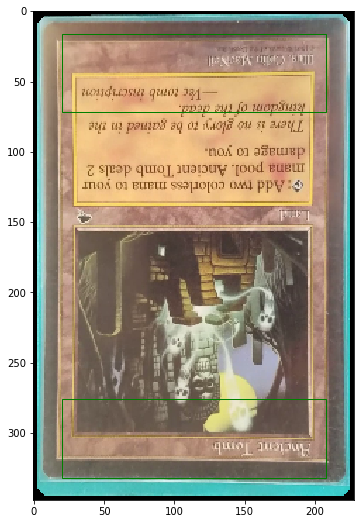

In [32]:
#Run a few times...
imgs_dir="data\\cards"
imgs_fns=glob(imgs_dir+"\\*\\*.png")
img_fn=random.choice(imgs_fns)
display_img(cv2.imread(img_fn,cv2.IMREAD_UNCHANGED),polygons=[refCornerHL,refCornerLR])

**Need to clean up zone space for text detection**

In [33]:
def findHull(img, corner=refCornerHL, debug="no"):
    """
        Find in the zone 'corner' of image 'img' and return, the convex hull delimiting
        the value and suit symbols
        'corner' (shape (4,2)) is an array of 4 points delimiting a rectangular zone, 
        takes one of the 2 possible values : refCornerHL or refCornerLR
        debug=
    """
    
    kernel = np.ones((3,3),np.uint8)
    corner=corner.astype(np.int)

    # We will focus on the zone of 'img' delimited by 'corner'
    x1=int(corner[0][0])
    y1=int(corner[0][1])
    x2=int(corner[2][0])
    y2=int(corner[2][1])
    w=x2-x1
    h=y2-y1
    zone=img[y1:y2,x1:x2].copy()

    strange_cnt=np.zeros_like(zone)
    gray=cv2.cvtColor(zone,cv2.COLOR_BGR2GRAY)
    bilateral=cv2.bilateralFilter(gray,20,10,100)#<---added
    ret,thresh=cv2.threshold(bilateral,157,220,cv2.THRESH_TOZERO)#<----added
    thld=cv2.Canny(thresh,30,200)
    thld = cv2.dilate(thld,kernel,iterations=1)
    if debug!="no": plt.imshow(thld)
    
    # Find the contours
    _,contours,_=cv2.findContours(thld.copy(),cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)

    min_area=75 # We will reject contours with small area. TWEAK, 'zoom' dependant
    min_solidity=0.2 # Reject contours with a low solidity. TWEAK
    
    concat_contour=None # We will aggregate in 'concat_contour' the contours that we want to keep
    
    ok=True
    for c in contours:
        area=cv2.contourArea(c)

        hull = cv2.convexHull(c)
        hull_area = cv2.contourArea(hull)
        #print(hull_area)
        solidity = float(area)/hull_area#<----
        # Determine the center of gravity (cx,cy) of the contour
        M=cv2.moments(c)
        cx=int(M['m10']/M['m00'])
        cy=int(M['m01']/M['m00'])
        #  abs(w/2-cx)<w*0.3 and abs(h/2-cy)<h*0.4 : TWEAK, the idea here is to keep only the contours which are closed to the center of the zone
        if area >= min_area and abs(w/2-cx)<w*0.3 and abs(h/2-cy)<h*0.4 and solidity>min_solidity:
            if debug != "no" :
                cv2.drawContours(zone,[c],0,(255,0,0),-1)
            if concat_contour is None:
                concat_contour=c
            else:
                concat_contour=np.concatenate((concat_contour,c))
        if debug != "no" and solidity <= min_solidity :
            print("Solidity",solidity)
            cv2.drawContours(strange_cnt,[c],0,255,2)
            plt.imshow(strange_cnt)
            
     
    if concat_contour is not None:
        # At this point, we suppose that 'concat_contour' contains only the contours corresponding the value and suit symbols   
        # We can now determine the hull
        hull=cv2.convexHull(concat_contour)
        hull_area=cv2.contourArea(hull)
        # If the area of the hull is to small or too big, there may be a problem
        min_hull_area=1000 # TWEAK, deck and 'zoom' dependant
        max_hull_area=10000 # TWEAK, deck and 'zoom' dependant
        if hull_area < min_hull_area or hull_area > max_hull_area: 
            ok=False
            if debug!="no":
                print("Hull area=",hull_area,"too large or too small")
        # So far, the coordinates of the hull are relative to 'zone'
        # We need the coordinates relative to the image -> 'hull_in_img' 
        hull_in_img=hull+corner[0]

    else:
        ok=False
    
    
    if debug != "no" :
        if concat_contour is not None:
            cv2.drawContours(zone,[hull],0,(0,255,0),1)
            cv2.drawContours(img,[hull_in_img],0,(0,255,0),1)
        plt.imshow(zone)
        plt.imshow(img)
        if ok and debug!="pause_always":
            key=cv2.waitKey(1)
        else:
            key=cv2.waitKey(0)
        if key==27:
            return None
    if ok == False:
        
        return None
    
    return hull_in_img

data\cards\Emrakul_the_Aeons_Torn\712278050.png


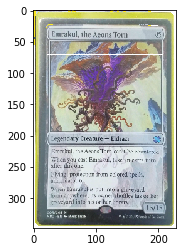

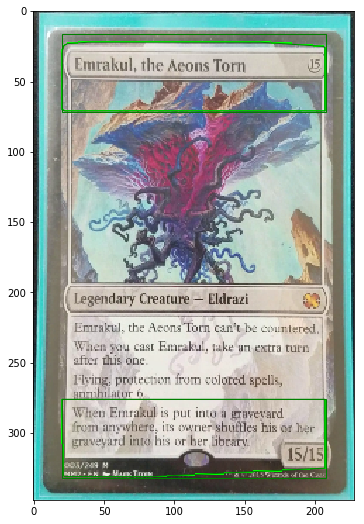

In [73]:
# Test find_hull on a random card image
# debug = "no" or "pause_always" or "pause_on_pb"
# If debug!="no", you may have to press a key to continue execution after pause
debug="yes" 
imgs_dir="data\\cards"
imgs_fns=glob(imgs_dir+"\\*\\*.png")
img_fn=random.choice(imgs_fns)
print(img_fn)
img=cv2.imread(img_fn,cv2.IMREAD_UNCHANGED)
hullHL=findHull(img,refCornerHL,debug=debug)
hullLR=findHull(img,refCornerLR,debug=debug)
display_img(img,[refCornerHL,refCornerLR,hullHL,hullLR])

plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

In [35]:
CardNames[:15]

['Ach_Hans_Run',
 'Rumors_of_My_Death',
 'World_Champion',
 'A_Display_of_My_Dark_Power',
 'A_Reckoning_Approaches',
 'AWOL',
 'Abandon_Hope',
 'Abandon_Reason',
 'Abandoned_Outpost',
 'Abandoned_Sarcophagus',
 'Abattoir_Ghoul',
 'Abbey_Gargoyles',
 'Abbey_Griffin',
 'Abbey_Matron',
 'Abbot_of_Keral_Keep']

In [36]:
imgs_dir="data\\cards"

cards={}
for card in CardNames:
    card_name=card        
    card_dir=os.path.join(imgs_dir,card_name)
    if not os.path.isdir(card_dir):
        #print("!!!",card_dir,"does not exist !!!")
        continue
    #cards[card_name]=[]
    for f in glob(card_dir+"\\*.png"):
        img=cv2.imread(f,cv2.IMREAD_UNCHANGED)
        hullHL=findHull(img,refCornerHL,debug="no") 
        if hullHL is None: 
            print("File:",f,"not used.")
            continue
        hullLR=findHull(img,refCornerLR,debug="no") 
        if hullLR is None: 
            #print("File:",f,"not used.")
            continue
        # We store the image in "rgb" format (we don't need opencv anymore)
        img=cv2.cvtColor(img,cv2.COLOR_BGRA2RGBA)
        #cards[card_name].append((img,hullHL,hullLR))
        cards[card_name]=((img,hullHL,hullLR))
#    print("Nb images for",CardNames,":",len(cards[card_name]))

File: data\cards\Ancient_Tomb\443155358.png not used.
File: data\cards\Ancient_Tomb\772445099.png not used.
File: data\cards\Brainstorm\008625883.png not used.
File: data\cards\Brainstorm\017302057.png not used.
File: data\cards\Brainstorm\048832488.png not used.
File: data\cards\Brainstorm\090366072.png not used.
File: data\cards\Brainstorm\094769616.png not used.
File: data\cards\Brainstorm\209491887.png not used.
File: data\cards\Brainstorm\212928240.png not used.
File: data\cards\Brainstorm\219312352.png not used.
File: data\cards\Brainstorm\342514480.png not used.
File: data\cards\Brainstorm\398228869.png not used.
File: data\cards\Brainstorm\506793499.png not used.
File: data\cards\Brainstorm\555522016.png not used.
File: data\cards\Brainstorm\599043100.png not used.
File: data\cards\Brainstorm\680705939.png not used.
File: data\cards\Brainstorm\715891937.png not used.
File: data\cards\Brainstorm\752823122.png not used.
File: data\cards\Brainstorm\755239423.png not used.
File: da

File: data\cards\Mountain\016316899.png not used.
File: data\cards\Mountain\016907795.png not used.
File: data\cards\Mountain\035400353.png not used.
File: data\cards\Mountain\035625983.png not used.
File: data\cards\Mountain\039129418.png not used.
File: data\cards\Mountain\044444976.png not used.
File: data\cards\Mountain\048429149.png not used.
File: data\cards\Mountain\061293785.png not used.
File: data\cards\Mountain\096506727.png not used.
File: data\cards\Mountain\133024966.png not used.
File: data\cards\Mountain\137822390.png not used.
File: data\cards\Mountain\145799143.png not used.
File: data\cards\Mountain\149301641.png not used.
File: data\cards\Mountain\158843474.png not used.
File: data\cards\Mountain\169091348.png not used.
File: data\cards\Mountain\183556103.png not used.
File: data\cards\Mountain\183696594.png not used.
File: data\cards\Mountain\188288135.png not used.
File: data\cards\Mountain\194865992.png not used.
File: data\cards\Mountain\197932331.png not used.


File: data\cards\Scalding_Tarn\905407095.png not used.
File: data\cards\Scalding_Tarn\919845673.png not used.
File: data\cards\Scalding_Tarn\960394125.png not used.
File: data\cards\Sneak_Attack\113819421.png not used.
File: data\cards\Sneak_Attack\271591436.png not used.
File: data\cards\Sneak_Attack\484142751.png not used.
File: data\cards\Sneak_Attack\788759094.png not used.
File: data\cards\Sneak_Attack\816002880.png not used.
File: data\cards\Sneak_Attack\871506566.png not used.
File: data\cards\Sneak_Attack\931883585.png not used.
File: data\cards\Sneak_Attack\948949843.png not used.
File: data\cards\Spell_Pierce\011613891.png not used.
File: data\cards\Spell_Pierce\217688743.png not used.
File: data\cards\Spell_Pierce\260911286.png not used.
File: data\cards\Spell_Pierce\307439333.png not used.
File: data\cards\Spell_Pierce\318709209.png not used.
File: data\cards\Spell_Pierce\349449411.png not used.
File: data\cards\Spell_Pierce\429692998.png not used.
File: data\cards\Spell_Pi

In [37]:
cards.keys()

dict_keys(['Ancient_Tomb', 'Brainstorm', 'City_of_Traitors', 'Cunning_Wish', 'Emrakul_the_Aeons_Torn', 'Flusterstorm', 'Force_of_Will', 'Griselbrand', 'Intuition', 'Island', 'Lotus_Petal', 'Misty_Rainforest', 'Mountain', 'Omniscience', 'Polluted_Delta', 'Ponder', 'Scalding_Tarn', 'Show_and_Tell', 'Sneak_Attack', 'Spell_Pierce', 'Taiga', 'Volcanic_Island', 'Wooded_Foothills'])

In [38]:
cards['Island'][2]

array([[[207, 282]],

       [[185, 327]],

       [[112, 327]],

       [[ 22, 303]],

       [[ 20, 279]],

       [[ 20, 276]],

       [[207, 276]]])

In [39]:
print("Saved in :",cards_pck_fn)
pickle.dump(cards,open(cards_pck_fn,'wb'))

Saved in : data\cards.pck


In [40]:
class Cards():
    def __init__(self,cards_pck_fn=cards_pck_fn):
        self._cards=pickle.load(open(cards_pck_fn,'rb'))
        # self._cards is a dictionary where keys are card names and values are lists of (img,hullHL,hullLR) 
        self._nb_cards_by_value={k:len(self._cards[k]) for k in self._cards}
        print("Nb of cards loaded per name :", self._nb_cards_by_value)
        
    def get_random(self, card_name=None, display=False):
        if card_name is None:
            card_name= random.choice(list(self._cards.keys()))
        card,hull1,hull2=self._cards[card_name]#
        [random.randint(0,self._nb_cards_by_value[card_name]-1)]
        print(card_name)
        if display:
            if display: display_img(card,[hull1,hull2],"rgb")
        return card,card_name,hull1,hull2
    
cardlist = Cards()

Nb of cards loaded per name : {'Ancient_Tomb': 3, 'Brainstorm': 3, 'City_of_Traitors': 3, 'Cunning_Wish': 3, 'Emrakul_the_Aeons_Torn': 3, 'Flusterstorm': 3, 'Force_of_Will': 3, 'Griselbrand': 3, 'Intuition': 3, 'Island': 3, 'Lotus_Petal': 3, 'Misty_Rainforest': 3, 'Mountain': 3, 'Omniscience': 3, 'Polluted_Delta': 3, 'Ponder': 3, 'Scalding_Tarn': 3, 'Show_and_Tell': 3, 'Sneak_Attack': 3, 'Spell_Pierce': 3, 'Taiga': 3, 'Volcanic_Island': 3, 'Wooded_Foothills': 3}


Wooded_Foothills


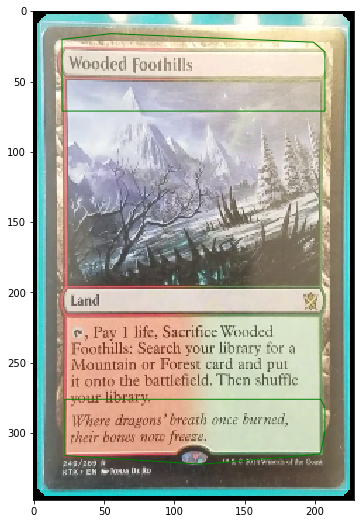

In [41]:
# Test: display a random card
_=cardlist.get_random(display=True)
# Display a random Ace of spades
#_=cards.get_random("As",display=True)

In [42]:
xml_body_1="""<annotation>
        <folder>FOLDER</folder>
        <filename>{FILENAME}</filename>
        <path>{PATH}</path>
        <source>
                <database>Unknown</database>
        </source>
        <size>
                <width>{WIDTH}</width>
                <height>{HEIGHT}</height>
                <depth>3</depth>
        </size>
"""
xml_object=""" <object>
                <name>{CLASS}</name>
                <pose>Unspecified</pose>
                <truncated>0</truncated>
                <difficult>0</difficult>
                <bndbox>
                        <xmin>{XMIN}</xmin>
                        <ymin>{YMIN}</ymin>
                        <xmax>{XMAX}</xmax>
                        <ymax>{YMAX}</ymax>
                </bndbox>
        </object>
"""
xml_body_2="""</annotation>        
"""

def create_voc_xml(xml_file, img_file,listbba,display=False):
    with open(xml_file,"w") as f:
        f.write(xml_body_1.format(**{'FILENAME':os.path.basename(img_file), 'PATH':img_file,'WIDTH':imgW,'HEIGHT':imgH}))
        for bba in listbba:            
            f.write(xml_object.format(**{'CLASS':bba.classname,'XMIN':bba.x1,'YMIN':bba.y1,'XMAX':bba.x2,'YMAX':bba.y2}))
        f.write(xml_body_2)
        if display: print("New xml",xml_file)

In [43]:
# Scenario with 2 cards:
# The original image of a card has the shape (cardH,cardW,4)
# We first paste it in a zero image of shape (imgH,imgW,4) at position decalX, decalY
# so that the original image is centerd in the zero image
decalX=int((imgW-cardW)/2)      #((720-228)/2)=246
decalY=int((imgH-cardH)/2)      #((720-348)/2)=186

# Scenario with 3 cards : decal values are different
decalX3=int(imgW/2)#720/2=360
decalY3=int(imgH/2-cardH)#360-348=12


In [44]:
def kps_to_polygon(kps):
    """
        Convert imgaug keypoints to shapely polygon
    """
    pts=[(kp.x,kp.y) for kp in kps]
    return Polygon(pts)

In [45]:
def hull_to_kps(hull, decalX=decalX, decalY=decalY):
    """
        Convert hull to imgaug keypoints
    """
    # hull is a cv2.Contour, shape : Nx1x2
    kps=[ia.Keypoint(x=p[0]+decalX,y=p[1]+decalY) for p in hull.reshape(-1,2)]
    kps=ia.KeypointsOnImage(kps, shape=(imgH,imgW,3))
    return kps

In [46]:
def kps_to_BB(kps):
    """
        Determine imgaug bounding box from imgaug keypoints
    """
    extend=3 # To make the bounding box a little bit bigger
    kpsx=[kp.x for kp in kps.keypoints]
    minx=max(0,int(min(kpsx)-extend))
    maxx=min(imgW,int(max(kpsx)+extend))
    kpsy=[kp.y for kp in kps.keypoints]
    miny=max(0,int(min(kpsy)-extend))
    maxy=min(imgH,int(max(kpsy)+extend))
    if minx==maxx or miny==maxy:
        return None
    else:
        return ia.BoundingBox(x1=minx,y1=miny,x2=maxx,y2=maxy)

In [47]:
# imgaug keypoints of the bounding box of a whole card
cardKP = ia.KeypointsOnImage([    
    ia.Keypoint(x=decalX,y=decalY),
    ia.Keypoint(x=decalX+cardW,y=decalY),   
    ia.Keypoint(x=decalX+cardW,y=decalY+cardH),
    ia.Keypoint(x=decalX,y=decalY+cardH)
    ], shape=(imgH,imgW,3))
    #Keypoint(x=-96.00000000, y=-336.00000000)
    #Keypoint(x=132.00000000, y=-336.00000000)
    #Keypoint(x=132.00000000, y=12.00000000)
    #Keypoint(x=-96.00000000, y=12.00000000)
    #shape=(720, 720, 3)

In [48]:
# imgaug transformation for one card in scenario with 2 cards
transform_1card = iaa.Sequential([
    iaa.Affine(scale=[0.65,1]),
    iaa.Affine(rotate=(-180,180)),
    iaa.Affine(translate_percent={"x":(-0.25,0.25),"y":(-0.25,0.25)}),])

In [49]:
# For the 3 cards scenario, we use 3 imgaug transforms, the first 2 are for individual cards, 
# and the third one for the group of 3 cards
trans_rot1 = iaa.Sequential([
    iaa.Affine(translate_px={"x": (10, 20)}),
    iaa.Affine(rotate=(22,30))])

trans_rot2 = iaa.Sequential([
    iaa.Affine(translate_px={"x": (0, 5)}),
    iaa.Affine(rotate=(10,15))])

transform_3cards = iaa.Sequential([
    iaa.Affine(translate_px={"x":decalX-decalX3,"y":decalY-decalY3}),
    iaa.Affine(scale=[0.65,1]),
    iaa.Affine(rotate=(-180,180)),
    iaa.Affine(translate_percent={"x":(-0.2,0.2),"y":(-0.2,0.2)})   ])

In [50]:
# imgaug transformation for the background
scaleBg=iaa.Scale({"height": imgH, "width": imgW})
scaleBg

Scale(name=UnnamedScale, parameters=[(Deterministic(int 720), Deterministic(int 720)), Deterministic(cubic)], deterministic=False)

In [51]:
def augment(img, list_kps, seq, restart=True):
    """
        Apply augmentation 'seq' to image 'img' and keypoints 'list_kps'
        If restart is False, the augmentation has been made deterministic outside the function (used for 3 cards scenario)
    """ 
    # Make sequence deterministic
    while True:
        if restart:
            myseq=seq.to_deterministic()
        else:
            myseq=seq
        # Augment image, keypoints and bbs 
        img_aug = myseq.augment_images([img])[0]
        list_kps_aug = [myseq.augment_keypoints([kp])[0] for kp in list_kps]
        list_bbs = [kps_to_BB(list_kps_aug[1]),kps_to_BB(list_kps_aug[2])]
        valid=True
        # Check the card bounding box stays inside the image
        for bb in list_bbs:
            if bb is None or int(round(bb.x2)) >= imgW or int(round(bb.y2)) >= imgH or int(bb.x1)<=0 or int(bb.y1)<=0:
                valid=False
                break
        if valid: break
        elif not restart:
            img_aug=None
            break
                
    return img_aug,list_kps_aug,list_bbs

In [52]:
class BBA:  # Bounding box + annotations
    def __init__(self,bb,classname):      
        self.x1=int(round(bb.x1))
        self.y1=int(round(bb.y1))
        self.x2=int(round(bb.x2))
        self.y2=int(round(bb.y2))
        self.classname=classname

In [53]:
#ValueError: could not broadcast input array from shape (348,228,4) into shape (336,96,4)
#-336 : -336+1392=1056,    -96:-96+912=816
#decalY:decalY+cardH,decalX:decalX+cardW,:

In [54]:
(imgH,imgW,4)

(720, 720, 4)

In [55]:
class Scene:
    def __init__(self,bg,img1, class1, hulla1,hullb1,img2, class2,hulla2,hullb2,img3=None, class3=None,hulla3=None,hullb3=None):
        if img3 is not None:
            self.create3CardsScene(bg,img1, class1, hulla1,hullb1,img2, class2,hulla2,hullb2,img3, class3,hulla3,hullb3)
        else:
            self.create2CardsScene(bg,img1, class1, hulla1,hullb1,img2, class2,hulla2,hullb2)

    def create2CardsScene(self,bg,img1, class1, hulla1,hullb1,img2, class2,hulla2,hullb2):
        kpsa1=hull_to_kps(hulla1)
        kpsb1=hull_to_kps(hullb1)
        kpsa2=hull_to_kps(hulla2)
        kpsb2=hull_to_kps(hullb2)
        
        # Randomly transform 1st card
        self.img1=np.zeros((imgH,imgW,4),dtype=np.uint8)
        self.img1[decalY:decalY+cardH,decalX:decalX+cardW,:]=img1#<-----
        self.img1,self.lkps1,self.bbs1=augment(self.img1,[cardKP,kpsa1,kpsb1],transform_1card)

        # Randomly transform 2nd card. We want that card 2 does not partially cover a corner of 1 card.
        # If so, we apply a new random transform to card 2
        while True:
            self.listbba=[]
            self.img2=np.zeros((imgH,imgW,4),dtype=np.uint8)
            self.img2[decalY:decalY+cardH,decalX:decalX+cardW,:]=img2
            self.img2,self.lkps2,self.bbs2=augment(self.img2,[cardKP,kpsa2,kpsb2],transform_1card)

            # mainPoly2: shapely polygon of card 2
            mainPoly2=kps_to_polygon(self.lkps2[0].keypoints[0:4])
            invalid=False
            intersect_ratio=0.1
            for i in range(1,3):
                # smallPoly1: shapely polygon of one of the hull of card 1
                smallPoly1=kps_to_polygon(self.lkps1[i].keypoints[:])
                a=smallPoly1.area
                # We calculate area of the intersection of card 1 corner with card 2
                intersect=mainPoly2.intersection(smallPoly1)
                ai=intersect.area
                # If intersection area is small enough, we accept card 2
                if (a-ai)/a > 1-intersect_ratio:
                    self.listbba.append(BBA(self.bbs1[i-1],class1))
                # If intersectio area is not small, but also not big enough, we want apply new transform to card 2
                elif (a-ai)/a>intersect_ratio:
                    invalid=True
                    break
                    
            if not invalid: break
            
        self.class1=class1
        self.class2=class2
        for bb in self.bbs2:
            self.listbba.append(BBA(bb,class2))
        # Construct final image of the scene by superimposing: bg, img1 and img2
        self.bg=scaleBg.augment_image(bg)
        mask1=self.img1[:,:,3]
        self.mask1=np.stack([mask1]*3,-1)
        self.final=np.where(self.mask1,self.img1[:,:,0:3],self.bg)
        mask2=self.img2[:,:,3]
        self.mask2=np.stack([mask2]*3,-1)
        self.final=np.where(self.mask2,self.img2[:,:,0:3],self.final)
        
        
        
    def create3CardsScene(self,bg,img1, class1, hulla1,hullb1,img2, class2,hulla2,hullb2,img3, class3,hulla3,hullb3):
        
        kpsa1=hull_to_kps(hulla1,decalX3,decalY3)
        kpsb1=hull_to_kps(hullb1,decalX3,decalY3)
        kpsa2=hull_to_kps(hulla2,decalX3,decalY3)
        kpsb2=hull_to_kps(hullb2,decalX3,decalY3)
        kpsa3=hull_to_kps(hulla3,decalX3,decalY3)
        kpsb3=hull_to_kps(hullb3,decalX3,decalY3)
        self.img3=np.zeros((imgH,imgW,4),dtype=np.uint8)
        self.img3[decalY3:decalY3+cardH,decalX3:decalX3+cardW,:]=img3
        self.img3,self.lkps3,self.bbs3=augment(self.img3,[cardKP,kpsa3,kpsb3],trans_rot1)
        self.img2=np.zeros((imgH,imgW,4),dtype=np.uint8)
        self.img2[decalY3:decalY3+cardH,decalX3:decalX3+cardW,:]=img2
        self.img2,self.lkps2,self.bbs2=augment(self.img2,[cardKP,kpsa2,kpsb2],trans_rot2)
        self.img1=np.zeros((imgH,imgW,4),dtype=np.uint8)
        self.img1[decalY3:decalY3+cardH,decalX3:decalX3+cardW,:]=img1

        while True:
            det_transform_3cards = transform_3cards.to_deterministic()
            _img3,_lkps3,self.bbs3=augment(self.img3,self.lkps3,det_transform_3cards, False)
            if _img3 is None: continue
            _img2,_lkps2,self.bbs2=augment(self.img2,self.lkps2,det_transform_3cards, False)
            if _img2 is None: continue
            _img1,self.lkps1,self.bbs1=augment(self.img1,[cardKP,kpsa1,kpsb1],det_transform_3cards, False)
            if _img1 is None: continue
            break
        self.img3=_img3
        self.lkps3=_lkps3
        self.img2=_img2
        self.lkps2=_lkps2
        self.img1=_img1
        
        self.class1=class1
        self.class2=class2
        self.class3=class3
        self.listbba=[BBA(self.bbs1[0],class1),BBA(self.bbs2[0],class2),BBA(self.bbs3[0],class3),BBA(self.bbs3[1],class3)]
        
        # Construct final image of the scene by superimposing: bg, img1, img2 and img3
        self.bg=scaleBg.augment_image(bg)
        mask1=self.img1[:,:,3]
        self.mask1=np.stack([mask1]*3,-1)
        self.final=np.where(self.mask1,self.img1[:,:,0:3],self.bg)
        mask2=self.img2[:,:,3]
        self.mask2=np.stack([mask2]*3,-1)
        self.final=np.where(self.mask2,self.img2[:,:,0:3],self.final)
        mask3=self.img3[:,:,3]
        self.mask3=np.stack([mask3]*3,-1)
        self.final=np.where(self.mask3,self.img3[:,:,0:3],self.final)

    def display(self):
        fig,ax=plt.subplots(1,figsize=(8,8))
        ax.imshow(self.final)
        for bb in self.listbba:
            rect=patches.Rectangle((bb.x1,bb.y1),bb.x2-bb.x1,bb.y2-bb.y1,linewidth=1,edgecolor='b',facecolor='none')
            ax.add_patch(rect)
    def res(self):
        return self.final
    def write_files(self,save_dir,display=False):
        jpg_fn, xml_fn=give_me_filename(save_dir, ["jpg","xml"])
        plt.imsave(jpg_fn,self.final)
        if display: print("New image saved in",jpg_fn)
        create_voc_xml(xml_fn,jpg_fn, self.listbba,display=display)

In [56]:
# Test generation of a scene with 2 cards
bg=backgrounds.get_random()

In [57]:
img1,card_val1,hulla1,hullb1=cardlist.get_random()

Spell_Pierce


In [58]:
img2,card_val2,hulla2,hullb2=cardlist.get_random()

Show_and_Tell


In [59]:
bg.shape

(369, 400, 3)

In [60]:
img1.shape

(348, 228, 4)

In [61]:
card_val1

'Spell_Pierce'

In [62]:
hulla1.shape

(12, 1, 2)

In [63]:
hullb1.shape

(11, 1, 2)

In [64]:
img2.shape

(348, 228, 4)

In [65]:
card_val2

'Show_and_Tell'

In [66]:
hulla2.shape

(8, 1, 2)

In [67]:
hullb2.shape

(7, 1, 2)

In [68]:
newimg=Scene(bg,img1,card_val1,hulla1,hullb1,img2,card_val2,hulla2,hullb2)

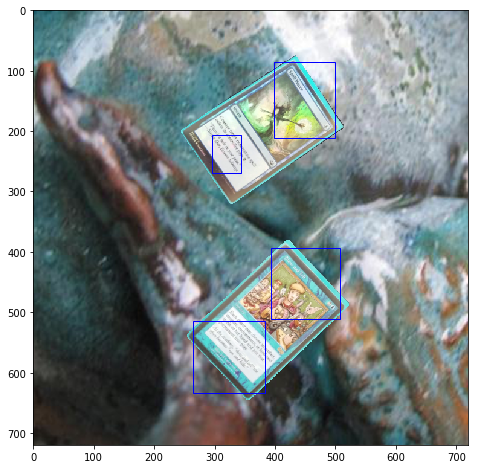

In [69]:

newimg=Scene(bg,img1,card_val1,hulla1,hullb1,img2,card_val2,hulla2,hullb2)
newimg.display()

Ancient_Tomb
Show_and_Tell
Omniscience


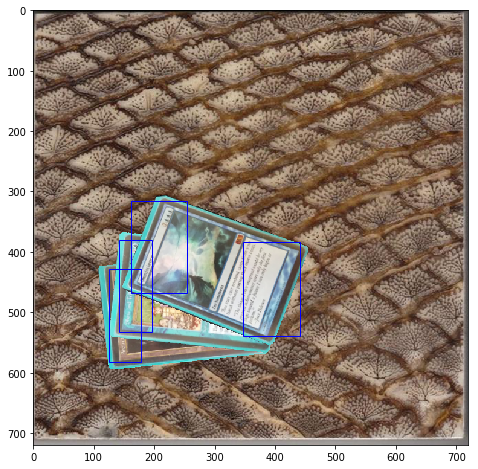

In [70]:
# Test generation of a scene with 3 cards
bg=backgrounds.get_random()
img1,card_val1,hulla1,hullb1=cardlist.get_random()
img2,card_val2,hulla2,hullb2=cardlist.get_random()
img3,card_val3,hulla3,hullb3=cardlist.get_random()

newimg=Scene(bg,img1,card_val1,hulla1,hullb1,img2,card_val2,hulla2,hullb2,img3,card_val3,hulla3,hullb3)
newimg.display()

In [71]:
nb_cards_to_generate=100
save_dir="data\\scenes\\val"

if not os.path.isdir(save_dir):
    os.makedirs(save_dir)

for i in tqdm(range(nb_cards_to_generate)):
    bg=backgrounds.get_random()
    img1,card_val1,hulla1,hullb1=cardlist.get_random()
    img2,card_val2,hulla2,hullb2=cardlist.get_random()
    
    newimg=Scene(bg,img1,card_val1,hulla1,hullb1,img2,card_val2,hulla2,hullb2)
    newimg.write_files(save_dir)

  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

Omniscience
Omniscience


  1%|▊                                                                                 | 1/100 [00:00<00:17,  5.78it/s]

Force_of_Will
Ponder


  2%|█▋                                                                                | 2/100 [00:00<00:16,  5.93it/s]

Taiga
Misty_Rainforest


  3%|██▍                                                                               | 3/100 [00:00<00:15,  6.21it/s]

Spell_Pierce
Wooded_Foothills


  4%|███▎                                                                              | 4/100 [00:00<00:15,  6.32it/s]

Ponder
Omniscience


  5%|████                                                                              | 5/100 [00:00<00:14,  6.60it/s]

Scalding_Tarn
Lotus_Petal


  6%|████▉                                                                             | 6/100 [00:00<00:15,  6.02it/s]

Force_of_Will
Emrakul_the_Aeons_Torn


  7%|█████▋                                                                            | 7/100 [00:01<00:15,  6.15it/s]

Polluted_Delta
Force_of_Will


  8%|██████▌                                                                           | 8/100 [00:01<00:18,  5.08it/s]

Intuition
Wooded_Foothills


  9%|███████▍                                                                          | 9/100 [00:01<00:19,  4.72it/s]

Ancient_Tomb
Brainstorm


 10%|████████                                                                         | 10/100 [00:01<00:18,  4.86it/s]

Ancient_Tomb
Force_of_Will


 11%|████████▉                                                                        | 11/100 [00:01<00:16,  5.32it/s]

Omniscience
Sneak_Attack


 12%|█████████▋                                                                       | 12/100 [00:02<00:16,  5.40it/s]

Brainstorm
Spell_Pierce


 13%|██████████▌                                                                      | 13/100 [00:02<00:18,  4.81it/s]

Misty_Rainforest
City_of_Traitors


 14%|███████████▎                                                                     | 14/100 [00:02<00:17,  5.04it/s]

Polluted_Delta
Sneak_Attack


 15%|████████████▏                                                                    | 15/100 [00:02<00:15,  5.36it/s]

Volcanic_Island
Show_and_Tell


 16%|████████████▉                                                                    | 16/100 [00:02<00:15,  5.41it/s]

Ponder
Sneak_Attack


 17%|█████████████▊                                                                   | 17/100 [00:03<00:14,  5.55it/s]

Volcanic_Island
Emrakul_the_Aeons_Torn


 18%|██████████████▌                                                                  | 18/100 [00:03<00:14,  5.86it/s]

Polluted_Delta
Force_of_Will


 19%|███████████████▍                                                                 | 19/100 [00:03<00:14,  5.75it/s]

Lotus_Petal
Cunning_Wish


 20%|████████████████▏                                                                | 20/100 [00:03<00:14,  5.60it/s]

Wooded_Foothills
Island


 21%|█████████████████                                                                | 21/100 [00:03<00:14,  5.57it/s]

Emrakul_the_Aeons_Torn
Griselbrand


 22%|█████████████████▊                                                               | 22/100 [00:03<00:13,  5.72it/s]

Cunning_Wish
Ancient_Tomb


 23%|██████████████████▋                                                              | 23/100 [00:04<00:13,  5.65it/s]

Island
Force_of_Will


 24%|███████████████████▍                                                             | 24/100 [00:04<00:14,  5.14it/s]

Wooded_Foothills
Show_and_Tell


 25%|████████████████████▎                                                            | 25/100 [00:04<00:13,  5.52it/s]

Brainstorm
Flusterstorm


 26%|█████████████████████                                                            | 26/100 [00:04<00:12,  5.91it/s]

City_of_Traitors
Ancient_Tomb


 27%|█████████████████████▊                                                           | 27/100 [00:04<00:13,  5.45it/s]

Polluted_Delta
Omniscience


 28%|██████████████████████▋                                                          | 28/100 [00:05<00:14,  4.90it/s]

Misty_Rainforest
Force_of_Will


 29%|███████████████████████▍                                                         | 29/100 [00:05<00:13,  5.27it/s]

Polluted_Delta
Lotus_Petal


 30%|████████████████████████▎                                                        | 30/100 [00:05<00:12,  5.50it/s]

Lotus_Petal
Emrakul_the_Aeons_Torn


 31%|█████████████████████████                                                        | 31/100 [00:05<00:12,  5.47it/s]

Flusterstorm
Force_of_Will


 32%|█████████████████████████▉                                                       | 32/100 [00:05<00:12,  5.67it/s]

Emrakul_the_Aeons_Torn
Force_of_Will


 33%|██████████████████████████▋                                                      | 33/100 [00:06<00:12,  5.30it/s]

Wooded_Foothills
Show_and_Tell


 34%|███████████████████████████▌                                                     | 34/100 [00:06<00:16,  4.12it/s]

Wooded_Foothills
Island


 35%|████████████████████████████▎                                                    | 35/100 [00:06<00:13,  4.70it/s]

Force_of_Will
Ponder


 36%|█████████████████████████████▏                                                   | 36/100 [00:06<00:12,  5.02it/s]

Brainstorm
Wooded_Foothills


 37%|█████████████████████████████▉                                                   | 37/100 [00:06<00:11,  5.44it/s]

Emrakul_the_Aeons_Torn
Sneak_Attack


 38%|██████████████████████████████▊                                                  | 38/100 [00:07<00:10,  5.66it/s]

Force_of_Will
Ancient_Tomb


 39%|███████████████████████████████▌                                                 | 39/100 [00:07<00:13,  4.53it/s]

Flusterstorm
Polluted_Delta


 40%|████████████████████████████████▍                                                | 40/100 [00:07<00:12,  4.91it/s]

Griselbrand
Island


 41%|█████████████████████████████████▏                                               | 41/100 [00:07<00:11,  5.21it/s]

Mountain
Taiga


 42%|██████████████████████████████████                                               | 42/100 [00:07<00:11,  5.07it/s]

City_of_Traitors
Sneak_Attack


 43%|██████████████████████████████████▊                                              | 43/100 [00:08<00:11,  5.17it/s]

Spell_Pierce
Griselbrand


 44%|███████████████████████████████████▋                                             | 44/100 [00:08<00:10,  5.53it/s]

Taiga
Misty_Rainforest


 45%|████████████████████████████████████▍                                            | 45/100 [00:08<00:11,  4.77it/s]

Taiga
Griselbrand


 46%|█████████████████████████████████████▎                                           | 46/100 [00:08<00:10,  5.17it/s]

Intuition
Sneak_Attack


 47%|██████████████████████████████████████                                           | 47/100 [00:08<00:09,  5.53it/s]

Volcanic_Island
Taiga


 48%|██████████████████████████████████████▉                                          | 48/100 [00:08<00:08,  5.91it/s]

Flusterstorm
Lotus_Petal


 49%|███████████████████████████████████████▋                                         | 49/100 [00:09<00:08,  5.77it/s]

Sneak_Attack
Force_of_Will


 50%|████████████████████████████████████████▌                                        | 50/100 [00:09<00:08,  5.89it/s]

Omniscience
Wooded_Foothills


 51%|█████████████████████████████████████████▎                                       | 51/100 [00:09<00:08,  6.07it/s]

Misty_Rainforest
Griselbrand


 52%|██████████████████████████████████████████                                       | 52/100 [00:09<00:07,  6.28it/s]

Omniscience
Sneak_Attack


 53%|██████████████████████████████████████████▉                                      | 53/100 [00:09<00:07,  6.54it/s]

Show_and_Tell
Misty_Rainforest


 54%|███████████████████████████████████████████▋                                     | 54/100 [00:09<00:07,  6.23it/s]

Emrakul_the_Aeons_Torn
Polluted_Delta


 55%|████████████████████████████████████████████▌                                    | 55/100 [00:10<00:07,  6.16it/s]

Emrakul_the_Aeons_Torn
Omniscience


 56%|█████████████████████████████████████████████▎                                   | 56/100 [00:10<00:06,  6.39it/s]

Emrakul_the_Aeons_Torn
Ancient_Tomb


 57%|██████████████████████████████████████████████▏                                  | 57/100 [00:10<00:06,  6.23it/s]

Wooded_Foothills
Misty_Rainforest


 58%|██████████████████████████████████████████████▉                                  | 58/100 [00:10<00:07,  5.53it/s]

Ponder
Polluted_Delta


 59%|███████████████████████████████████████████████▊                                 | 59/100 [00:10<00:07,  5.84it/s]

Mountain
Ancient_Tomb


 60%|████████████████████████████████████████████████▌                                | 60/100 [00:10<00:06,  5.87it/s]

Force_of_Will
Flusterstorm


 61%|█████████████████████████████████████████████████▍                               | 61/100 [00:11<00:06,  5.93it/s]

Omniscience
Cunning_Wish


 62%|██████████████████████████████████████████████████▏                              | 62/100 [00:11<00:07,  4.99it/s]

Intuition
Ponder


 63%|███████████████████████████████████████████████████                              | 63/100 [00:11<00:07,  5.04it/s]

Griselbrand
Intuition


 64%|███████████████████████████████████████████████████▊                             | 64/100 [00:11<00:06,  5.32it/s]

Emrakul_the_Aeons_Torn
Misty_Rainforest


 65%|████████████████████████████████████████████████████▋                            | 65/100 [00:11<00:07,  4.97it/s]

Flusterstorm
Spell_Pierce


 66%|█████████████████████████████████████████████████████▍                           | 66/100 [00:12<00:06,  5.15it/s]

Sneak_Attack
Griselbrand


 67%|██████████████████████████████████████████████████████▎                          | 67/100 [00:12<00:06,  5.46it/s]

Ponder
Griselbrand


 68%|███████████████████████████████████████████████████████                          | 68/100 [00:12<00:05,  5.63it/s]

Griselbrand
Polluted_Delta


 69%|███████████████████████████████████████████████████████▉                         | 69/100 [00:12<00:05,  5.57it/s]

Polluted_Delta
Show_and_Tell


 70%|████████████████████████████████████████████████████████▋                        | 70/100 [00:12<00:05,  5.64it/s]

Wooded_Foothills
Flusterstorm


 71%|█████████████████████████████████████████████████████████▌                       | 71/100 [00:13<00:05,  5.50it/s]

Polluted_Delta
Brainstorm


 72%|██████████████████████████████████████████████████████████▎                      | 72/100 [00:13<00:05,  5.41it/s]

Flusterstorm
Polluted_Delta


 73%|███████████████████████████████████████████████████████████▏                     | 73/100 [00:13<00:04,  5.72it/s]

Island
Griselbrand


 74%|███████████████████████████████████████████████████████████▉                     | 74/100 [00:13<00:04,  5.76it/s]

Wooded_Foothills
Force_of_Will


 75%|████████████████████████████████████████████████████████████▊                    | 75/100 [00:13<00:04,  6.06it/s]

Lotus_Petal
Wooded_Foothills


 76%|█████████████████████████████████████████████████████████████▌                   | 76/100 [00:13<00:04,  5.94it/s]

Taiga
Intuition


 77%|██████████████████████████████████████████████████████████████▎                  | 77/100 [00:13<00:03,  6.24it/s]

Lotus_Petal
Emrakul_the_Aeons_Torn


 78%|███████████████████████████████████████████████████████████████▏                 | 78/100 [00:14<00:03,  5.96it/s]

Show_and_Tell
Lotus_Petal


 79%|███████████████████████████████████████████████████████████████▉                 | 79/100 [00:14<00:03,  5.97it/s]

Force_of_Will
Intuition


 80%|████████████████████████████████████████████████████████████████▊                | 80/100 [00:14<00:03,  5.84it/s]

City_of_Traitors
Emrakul_the_Aeons_Torn


 81%|█████████████████████████████████████████████████████████████████▌               | 81/100 [00:14<00:03,  6.15it/s]

Omniscience
Force_of_Will


 82%|██████████████████████████████████████████████████████████████████▍              | 82/100 [00:14<00:03,  5.74it/s]

Show_and_Tell
Misty_Rainforest


 83%|███████████████████████████████████████████████████████████████████▏             | 83/100 [00:15<00:03,  5.11it/s]

City_of_Traitors
Brainstorm


 84%|████████████████████████████████████████████████████████████████████             | 84/100 [00:15<00:02,  5.47it/s]

Wooded_Foothills
Emrakul_the_Aeons_Torn


 85%|████████████████████████████████████████████████████████████████████▊            | 85/100 [00:15<00:03,  4.83it/s]

Ponder
Griselbrand


 86%|█████████████████████████████████████████████████████████████████████▋           | 86/100 [00:15<00:02,  4.69it/s]

Polluted_Delta
Cunning_Wish


 87%|██████████████████████████████████████████████████████████████████████▍          | 87/100 [00:15<00:02,  5.18it/s]

Wooded_Foothills
Emrakul_the_Aeons_Torn


 88%|███████████████████████████████████████████████████████████████████████▎         | 88/100 [00:16<00:02,  5.61it/s]

Lotus_Petal
Emrakul_the_Aeons_Torn


 89%|████████████████████████████████████████████████████████████████████████         | 89/100 [00:16<00:02,  4.54it/s]

Island
Volcanic_Island


 90%|████████████████████████████████████████████████████████████████████████▉        | 90/100 [00:16<00:01,  5.04it/s]

Lotus_Petal
Misty_Rainforest


 91%|█████████████████████████████████████████████████████████████████████████▋       | 91/100 [00:16<00:01,  5.18it/s]

Show_and_Tell
Show_and_Tell


 92%|██████████████████████████████████████████████████████████████████████████▌      | 92/100 [00:16<00:01,  5.54it/s]

Sneak_Attack
Lotus_Petal


 93%|███████████████████████████████████████████████████████████████████████████▎     | 93/100 [00:16<00:01,  5.79it/s]

Show_and_Tell
Misty_Rainforest


 94%|████████████████████████████████████████████████████████████████████████████▏    | 94/100 [00:17<00:01,  5.55it/s]

Cunning_Wish
Polluted_Delta


 95%|████████████████████████████████████████████████████████████████████████████▉    | 95/100 [00:17<00:00,  5.26it/s]

Emrakul_the_Aeons_Torn
Island


 96%|█████████████████████████████████████████████████████████████████████████████▊   | 96/100 [00:17<00:00,  5.29it/s]

Scalding_Tarn
Sneak_Attack


 97%|██████████████████████████████████████████████████████████████████████████████▌  | 97/100 [00:17<00:00,  4.96it/s]

Taiga
Force_of_Will


 98%|███████████████████████████████████████████████████████████████████████████████▍ | 98/100 [00:17<00:00,  5.39it/s]

Ancient_Tomb
Force_of_Will


 99%|████████████████████████████████████████████████████████████████████████████████▏| 99/100 [00:18<00:00,  5.08it/s]

Scalding_Tarn
Brainstorm


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:18<00:00,  5.09it/s]


In [72]:
nb_cards_to_generate=100
save_dir="data\\scenes\\val"

if not os.path.isdir(save_dir):
    os.makedirs(save_dir)

for i in tqdm(range(nb_cards_to_generate)):
    bg=backgrounds.get_random()
    img1,card_val1,hulla1,hullb1=cardlist.get_random()
    img2,card_val2,hulla2,hullb2=cardlist.get_random()
    img3,card_val3,hulla3,hullb3=cardlist.get_random()
    
    newimg=Scene(bg,img1,card_val1,hulla1,hullb1,img2,card_val2,hulla2,hullb2,img3,card_val3,hulla3,hullb3)
    newimg.write_files(save_dir)

  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

Lotus_Petal
Ancient_Tomb
Omniscience


  1%|▊                                                                                 | 1/100 [00:00<00:27,  3.66it/s]

Omniscience
Ponder
Sneak_Attack


  2%|█▋                                                                                | 2/100 [00:00<00:26,  3.74it/s]

Cunning_Wish
Brainstorm
Show_and_Tell


  3%|██▍                                                                               | 3/100 [00:00<00:24,  3.90it/s]

Island
Mountain
Misty_Rainforest


  4%|███▎                                                                              | 4/100 [00:00<00:23,  4.07it/s]

Lotus_Petal
Scalding_Tarn
Volcanic_Island


  5%|████                                                                              | 5/100 [00:01<00:22,  4.24it/s]

Sneak_Attack
City_of_Traitors
Mountain


  6%|████▉                                                                             | 6/100 [00:01<00:21,  4.28it/s]

Lotus_Petal
Wooded_Foothills
Ponder


  7%|█████▋                                                                            | 7/100 [00:01<00:22,  4.22it/s]

Polluted_Delta
Ponder
Volcanic_Island


  8%|██████▌                                                                           | 8/100 [00:01<00:21,  4.33it/s]

Lotus_Petal
Sneak_Attack
Griselbrand


  9%|███████▍                                                                          | 9/100 [00:02<00:21,  4.32it/s]

Show_and_Tell
Misty_Rainforest
Polluted_Delta


 10%|████████                                                                         | 10/100 [00:02<00:21,  4.26it/s]

Emrakul_the_Aeons_Torn
Volcanic_Island
Brainstorm


 11%|████████▉                                                                        | 11/100 [00:02<00:20,  4.28it/s]

Brainstorm
Polluted_Delta
Flusterstorm


 12%|█████████▋                                                                       | 12/100 [00:02<00:21,  4.17it/s]

Misty_Rainforest
Polluted_Delta
Ponder


 13%|██████████▌                                                                      | 13/100 [00:03<00:20,  4.26it/s]

Mountain
Flusterstorm
Wooded_Foothills


 14%|███████████▎                                                                     | 14/100 [00:03<00:20,  4.23it/s]

Misty_Rainforest
Misty_Rainforest
Lotus_Petal


 15%|████████████▏                                                                    | 15/100 [00:03<00:22,  3.83it/s]

Ancient_Tomb
Sneak_Attack
Island


 16%|████████████▉                                                                    | 16/100 [00:03<00:20,  4.02it/s]

Lotus_Petal
Flusterstorm
Griselbrand


 17%|█████████████▊                                                                   | 17/100 [00:04<00:20,  4.10it/s]

Mountain
Intuition
Ancient_Tomb


 18%|██████████████▌                                                                  | 18/100 [00:04<00:19,  4.21it/s]

Polluted_Delta
Spell_Pierce
Show_and_Tell


 19%|███████████████▍                                                                 | 19/100 [00:04<00:19,  4.26it/s]

Emrakul_the_Aeons_Torn
Griselbrand
Mountain


 20%|████████████████▏                                                                | 20/100 [00:04<00:18,  4.35it/s]

Flusterstorm
City_of_Traitors
Lotus_Petal


 21%|█████████████████                                                                | 21/100 [00:04<00:17,  4.41it/s]

Emrakul_the_Aeons_Torn
City_of_Traitors
Brainstorm


 22%|█████████████████▊                                                               | 22/100 [00:05<00:18,  4.31it/s]

Ancient_Tomb
Scalding_Tarn
Ponder


 23%|██████████████████▋                                                              | 23/100 [00:05<00:17,  4.41it/s]

Island
Brainstorm
Sneak_Attack


 24%|███████████████████▍                                                             | 24/100 [00:05<00:16,  4.48it/s]

Mountain
Taiga
Griselbrand


 25%|████████████████████▎                                                            | 25/100 [00:05<00:16,  4.47it/s]

Polluted_Delta
Taiga
Scalding_Tarn


 26%|█████████████████████                                                            | 26/100 [00:06<00:16,  4.46it/s]

Polluted_Delta
Lotus_Petal
City_of_Traitors


 27%|█████████████████████▊                                                           | 27/100 [00:06<00:16,  4.51it/s]

Force_of_Will
Misty_Rainforest
Island


 28%|██████████████████████▋                                                          | 28/100 [00:06<00:15,  4.51it/s]

Scalding_Tarn
Wooded_Foothills
Volcanic_Island


 29%|███████████████████████▍                                                         | 29/100 [00:06<00:15,  4.58it/s]

Wooded_Foothills
Mountain
Force_of_Will


 30%|████████████████████████▎                                                        | 30/100 [00:06<00:15,  4.46it/s]

Emrakul_the_Aeons_Torn
Intuition
Brainstorm


 31%|█████████████████████████                                                        | 31/100 [00:07<00:18,  3.82it/s]

Spell_Pierce
Cunning_Wish
Ancient_Tomb


 32%|█████████████████████████▉                                                       | 32/100 [00:07<00:17,  3.79it/s]

Taiga
Griselbrand
Force_of_Will


 33%|██████████████████████████▋                                                      | 33/100 [00:07<00:17,  3.81it/s]

Omniscience
Force_of_Will
Ancient_Tomb


 34%|███████████████████████████▌                                                     | 34/100 [00:08<00:16,  4.01it/s]

Brainstorm
Lotus_Petal
Flusterstorm


 35%|████████████████████████████▎                                                    | 35/100 [00:08<00:15,  4.16it/s]

Show_and_Tell
Emrakul_the_Aeons_Torn
Taiga


 36%|█████████████████████████████▏                                                   | 36/100 [00:08<00:14,  4.28it/s]

Scalding_Tarn
Ponder
Show_and_Tell


 37%|█████████████████████████████▉                                                   | 37/100 [00:08<00:14,  4.30it/s]

Volcanic_Island
Island
Intuition


 38%|██████████████████████████████▊                                                  | 38/100 [00:08<00:14,  4.26it/s]

Scalding_Tarn
Omniscience
Spell_Pierce


 39%|███████████████████████████████▌                                                 | 39/100 [00:09<00:14,  4.31it/s]

Flusterstorm
Wooded_Foothills
Mountain


 40%|████████████████████████████████▍                                                | 40/100 [00:09<00:13,  4.39it/s]

Intuition
Volcanic_Island
Intuition


 41%|█████████████████████████████████▏                                               | 41/100 [00:09<00:13,  4.33it/s]

City_of_Traitors
Polluted_Delta
Flusterstorm


 42%|██████████████████████████████████                                               | 42/100 [00:09<00:13,  4.38it/s]

Spell_Pierce
Spell_Pierce
Mountain


 43%|██████████████████████████████████▊                                              | 43/100 [00:10<00:12,  4.46it/s]

Show_and_Tell
Spell_Pierce
Lotus_Petal


 44%|███████████████████████████████████▋                                             | 44/100 [00:10<00:12,  4.51it/s]

Ancient_Tomb
Mountain
Polluted_Delta


 45%|████████████████████████████████████▍                                            | 45/100 [00:10<00:12,  4.52it/s]

Lotus_Petal
Intuition
Mountain


 46%|█████████████████████████████████████▎                                           | 46/100 [00:10<00:12,  4.36it/s]

Emrakul_the_Aeons_Torn
Omniscience
Force_of_Will


 47%|██████████████████████████████████████                                           | 47/100 [00:11<00:12,  4.35it/s]

Omniscience
Lotus_Petal
Lotus_Petal


 48%|██████████████████████████████████████▉                                          | 48/100 [00:11<00:13,  3.99it/s]

Polluted_Delta
Volcanic_Island
Cunning_Wish


 49%|███████████████████████████████████████▋                                         | 49/100 [00:11<00:12,  4.10it/s]

Taiga
Flusterstorm
Ancient_Tomb


 50%|████████████████████████████████████████▌                                        | 50/100 [00:11<00:12,  4.14it/s]

Spell_Pierce
Ancient_Tomb
City_of_Traitors


 51%|█████████████████████████████████████████▎                                       | 51/100 [00:12<00:11,  4.23it/s]

Volcanic_Island
Mountain
Cunning_Wish


 52%|██████████████████████████████████████████                                       | 52/100 [00:12<00:11,  4.24it/s]

Mountain
Force_of_Will
Brainstorm


 53%|██████████████████████████████████████████▉                                      | 53/100 [00:12<00:10,  4.30it/s]

Brainstorm
Wooded_Foothills
Ancient_Tomb


 54%|███████████████████████████████████████████▋                                     | 54/100 [00:12<00:10,  4.36it/s]

Ponder
Ponder
Spell_Pierce


 55%|████████████████████████████████████████████▌                                    | 55/100 [00:12<00:10,  4.41it/s]

Polluted_Delta
Griselbrand
Ponder


 56%|█████████████████████████████████████████████▎                                   | 56/100 [00:13<00:09,  4.43it/s]

Volcanic_Island
Spell_Pierce
Emrakul_the_Aeons_Torn


 57%|██████████████████████████████████████████████▏                                  | 57/100 [00:13<00:10,  4.24it/s]

Emrakul_the_Aeons_Torn
Ponder
Show_and_Tell


 58%|██████████████████████████████████████████████▉                                  | 58/100 [00:13<00:09,  4.35it/s]

Intuition
Show_and_Tell
Ponder


 59%|███████████████████████████████████████████████▊                                 | 59/100 [00:13<00:09,  4.39it/s]

Ancient_Tomb
Mountain
Taiga


 60%|████████████████████████████████████████████████▌                                | 60/100 [00:14<00:09,  4.42it/s]

City_of_Traitors
Intuition
Mountain


 61%|█████████████████████████████████████████████████▍                               | 61/100 [00:14<00:08,  4.38it/s]

Force_of_Will
Force_of_Will
Flusterstorm


 62%|██████████████████████████████████████████████████▏                              | 62/100 [00:14<00:08,  4.41it/s]

Intuition
City_of_Traitors
Lotus_Petal


 63%|███████████████████████████████████████████████████                              | 63/100 [00:14<00:08,  4.52it/s]

Ponder
City_of_Traitors
Spell_Pierce


 64%|███████████████████████████████████████████████████▊                             | 64/100 [00:14<00:08,  4.47it/s]

Misty_Rainforest
Scalding_Tarn
Flusterstorm


 65%|████████████████████████████████████████████████████▋                            | 65/100 [00:15<00:08,  4.19it/s]

Sneak_Attack
Cunning_Wish
Sneak_Attack


 66%|█████████████████████████████████████████████████████▍                           | 66/100 [00:15<00:08,  4.11it/s]

Polluted_Delta
Ponder
Lotus_Petal


 67%|██████████████████████████████████████████████████████▎                          | 67/100 [00:15<00:07,  4.19it/s]

Taiga
Island
Island


 68%|███████████████████████████████████████████████████████                          | 68/100 [00:15<00:07,  4.29it/s]

Misty_Rainforest
Wooded_Foothills
City_of_Traitors


 69%|███████████████████████████████████████████████████████▉                         | 69/100 [00:16<00:07,  4.24it/s]

Cunning_Wish
Ponder
Polluted_Delta


 70%|████████████████████████████████████████████████████████▋                        | 70/100 [00:16<00:06,  4.37it/s]

Volcanic_Island
Volcanic_Island
Taiga


 71%|█████████████████████████████████████████████████████████▌                       | 71/100 [00:16<00:06,  4.43it/s]

Emrakul_the_Aeons_Torn
Intuition
Intuition


 72%|██████████████████████████████████████████████████████████▎                      | 72/100 [00:16<00:06,  4.51it/s]

Griselbrand
Emrakul_the_Aeons_Torn
Brainstorm


 73%|███████████████████████████████████████████████████████████▏                     | 73/100 [00:17<00:06,  4.24it/s]

Island
Brainstorm
Misty_Rainforest


 74%|███████████████████████████████████████████████████████████▉                     | 74/100 [00:17<00:06,  4.28it/s]

Intuition
Cunning_Wish
Intuition


 75%|████████████████████████████████████████████████████████████▊                    | 75/100 [00:17<00:05,  4.39it/s]

Brainstorm
Lotus_Petal
Volcanic_Island


 76%|█████████████████████████████████████████████████████████████▌                   | 76/100 [00:17<00:05,  4.45it/s]

Intuition
Lotus_Petal
Show_and_Tell


 77%|██████████████████████████████████████████████████████████████▎                  | 77/100 [00:17<00:05,  4.39it/s]

Show_and_Tell
Wooded_Foothills
Show_and_Tell


 78%|███████████████████████████████████████████████████████████████▏                 | 78/100 [00:18<00:04,  4.41it/s]

Wooded_Foothills
Ponder
Force_of_Will


 79%|███████████████████████████████████████████████████████████████▉                 | 79/100 [00:18<00:04,  4.46it/s]

Island
Sneak_Attack
Intuition


 80%|████████████████████████████████████████████████████████████████▊                | 80/100 [00:18<00:04,  4.52it/s]

Omniscience
Lotus_Petal
Intuition


 81%|█████████████████████████████████████████████████████████████████▌               | 81/100 [00:18<00:04,  3.92it/s]

Ancient_Tomb
Mountain
Ancient_Tomb


 82%|██████████████████████████████████████████████████████████████████▍              | 82/100 [00:19<00:04,  4.08it/s]

Emrakul_the_Aeons_Torn
Lotus_Petal
Island


 83%|███████████████████████████████████████████████████████████████████▏             | 83/100 [00:19<00:04,  4.20it/s]

Taiga
Force_of_Will
Griselbrand


 84%|████████████████████████████████████████████████████████████████████             | 84/100 [00:19<00:03,  4.37it/s]

Taiga
Force_of_Will
Force_of_Will


 85%|████████████████████████████████████████████████████████████████████▊            | 85/100 [00:19<00:03,  3.89it/s]

Ponder
Spell_Pierce
Volcanic_Island


 86%|█████████████████████████████████████████████████████████████████████▋           | 86/100 [00:20<00:03,  4.01it/s]

Scalding_Tarn
Lotus_Petal
Wooded_Foothills


 87%|██████████████████████████████████████████████████████████████████████▍          | 87/100 [00:20<00:03,  4.15it/s]

Emrakul_the_Aeons_Torn
Scalding_Tarn
Flusterstorm


 88%|███████████████████████████████████████████████████████████████████████▎         | 88/100 [00:20<00:02,  4.30it/s]

Ancient_Tomb
Scalding_Tarn
Misty_Rainforest


 89%|████████████████████████████████████████████████████████████████████████         | 89/100 [00:20<00:02,  4.18it/s]

Mountain
Taiga
Scalding_Tarn


 90%|████████████████████████████████████████████████████████████████████████▉        | 90/100 [00:21<00:02,  4.25it/s]

Griselbrand
Intuition
Taiga


 91%|█████████████████████████████████████████████████████████████████████████▋       | 91/100 [00:21<00:02,  4.31it/s]

Omniscience
Spell_Pierce
Taiga


 92%|██████████████████████████████████████████████████████████████████████████▌      | 92/100 [00:21<00:01,  4.40it/s]

Ancient_Tomb
Brainstorm
Show_and_Tell


 93%|███████████████████████████████████████████████████████████████████████████▎     | 93/100 [00:21<00:01,  4.33it/s]

Misty_Rainforest
Taiga
Ancient_Tomb


 94%|████████████████████████████████████████████████████████████████████████████▏    | 94/100 [00:21<00:01,  4.32it/s]

Wooded_Foothills
Lotus_Petal
Emrakul_the_Aeons_Torn


 95%|████████████████████████████████████████████████████████████████████████████▉    | 95/100 [00:22<00:01,  4.36it/s]

City_of_Traitors
Brainstorm
Spell_Pierce


 96%|█████████████████████████████████████████████████████████████████████████████▊   | 96/100 [00:22<00:00,  4.44it/s]

Flusterstorm
Omniscience
City_of_Traitors


 97%|██████████████████████████████████████████████████████████████████████████████▌  | 97/100 [00:22<00:00,  4.35it/s]

Cunning_Wish
Sneak_Attack
Mountain


 98%|███████████████████████████████████████████████████████████████████████████████▍ | 98/100 [00:22<00:00,  3.92it/s]

Mountain
Volcanic_Island
Volcanic_Island


 99%|████████████████████████████████████████████████████████████████████████████████▏| 99/100 [00:23<00:00,  4.03it/s]

Wooded_Foothills
Flusterstorm
Omniscience


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:23<00:00,  4.05it/s]
